# Overview (Male Candidate)

In [1]:
# path to user functions
import sys  
sys.path.append('../Src/')

import pandas as pd
import pickle
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import sys

from scipy import stats
from importlib.metadata import version

# set seaborn theme
sns.set_theme()

# python modules
import utilities as u
import plot
import ranker

# initializing variables
SEED = 1776

# Create a dictionary of versions
versions = {
    "Python": sys.version.split()[0],
    "Pandas": pd.__version__,
    "NumPy": np.__version__,
    "Seaborn": sns.__version__,
    "Matplot": sys.modules['matplotlib'].__version__,
    # "Sk-Learn": sys.modules['sklearn'].__version__,
    "Scipy": sys.modules['scipy'].__version__,
}

# Display as a clean DataFrame
df_versions = pd.DataFrame(list(versions.items()), columns=['Library', 'Version'])
print(df_versions)

# adjust pandas display options to max
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
# adjust pandas display options to ensure full display of content
pd.set_option('display.max_colwidth', None)

   Library  Version
0   Python  3.11.13
1   Pandas    3.0.2
2    NumPy    2.3.2
3  Seaborn   0.13.2
4  Matplot   3.10.5
5    Scipy   1.16.1


## Import Data

In [2]:
# import data
df = pd.read_parquet("../Data/Candidate_Male_Heart.parquet")
# display shape
df.shape

(22236, 145)

## Male

In [3]:
# display info
df.info(max_cols=df.shape[1])

<class 'pandas.DataFrame'>
RangeIndex: 22236 entries, 0 to 22235
Data columns (total 145 columns):
 #    Column                                        Non-Null Count  Dtype   
---   ------                                        --------------  -----   
 0    PreviousTransplantNumber_CAN                  22236 non-null  category
 1    WaitListDiagnosisCode_CAN                     22236 non-null  category
 2    Gender_CAN                                    22236 non-null  category
 3    BloodGroup_CAN                                22236 non-null  category
 4    Citizenship_CAN                               22236 non-null  category
 5    ResidencyStateRegistration_CAN                22236 non-null  category
 6    EducationLevel_CAN                            22236 non-null  category
 7    LifeSupportRegistration_ECMO_CAN              22236 non-null  category
 8    LifeSupportRegistration_IABP_CAN              22236 non-null  category
 9    LifeSupportInhaled_CAN                        22

In [4]:
# Empty DataFrame # list for record keeping
mapping_df = pd.DataFrame(columns=['feature', 'consolidate', 'type', 'gender'])
gender_value = 'Male'
type_value = 'CAN'
remove_cols = []

| Feature                     | Bonferroni        | Holm‑Bonferroni   | FDR (Benjamini–Hochberg) |
|-----------------------------|-------------------|-------------------|---------------------------|
| **Strictness**              | Highest           | High              | Lowest                    |
| **Statistical Power**       | Lowest            | Moderate          | Highest                   |
| **Primary Risk**            | Type II Error     | Type II Error     | Type I Error              |
| **Best Use Case**           | 2–5 comparisons; scientific “proof” | General use; balanced control | Feature engineering; large category sets |


| Error Type     | Meaning                                      | Risk in Medical Modeling                        | Caused By                          |
|----------------|----------------------------------------------|--------------------------------------------------|------------------------------------|
| **Type I**     | False positive (detecting a difference that isn't real) | Over-splitting, spurious risk groups, misleading clinical interpretation | Too lenient alpha, weak correction |
| **Type II**    | False negative (missing a real difference)    | Collapsing meaningful categories, losing signal, underestimating risk     | Low power, strict correction, small effects |



#### Previous Transplant Number

In [5]:
# info
feature = u.get_feature_info(df, 'PreviousTransplantNumber', cat=False)
# dtype
df[feature].apply(lambda s: repr(s.dtype))

                              count unique top   freq
PreviousTransplantNumber_CAN  22236      4   0  21641

:::: NaN Count:
PreviousTransplantNumber_CAN    0 



PreviousTransplantNumber_CAN    CategoricalDtype(categories=['0', '1', '2', '3'], ordered=False, categories_dtype=str)
dtype: str

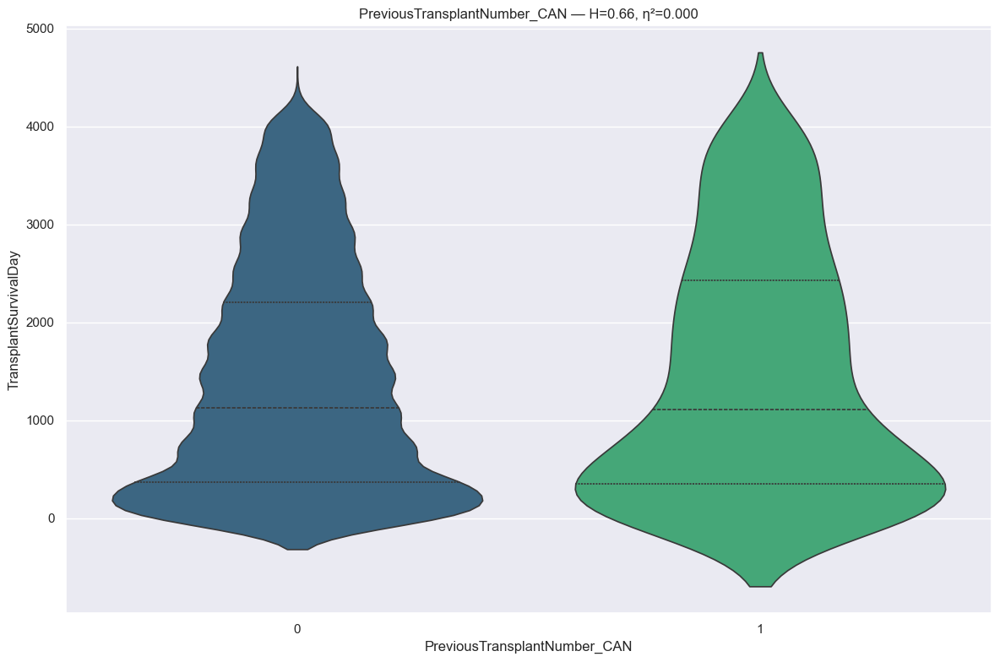

RANKING REPORT: PreviousTransplantNumber_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :  21641 records
 * 1                                                 :    569 records
BYPASSED CATEGORIES (n < min_n):
 * 2                                                 :     24 records
 * 3                                                 :      2 records
--------------------------------------------------------------------------------
Kruskal H: 0.6647 | P-value: 4.148894e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
0            vs 1            | p=4.1489e-01 | thr=0.0500 | r=-0.020 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - 0
  - 1

>>> Other (2 categories)
  - 2
  - 3


In [6]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [7]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PreviousTransplantNumber_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :  21641 records
 * 1                                                 :    569 records
BYPASSED CATEGORIES (n < min_n):
 * 2                                                 :     24 records
 * 3                                                 :      2 records
--------------------------------------------------------------------------------
Kruskal H: 0.6647 | P-value: 4.148894e-01 | Effect η²: 0.0000
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - 0
  - 1

>>> Other (2 categories)
  - 2
  - 3



In [8]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### WaitList Diagnosis Code

In [9]:
# info
feature = u.get_feature_info(df, 'WaitListDiagnosisCode', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                           count unique                           top  freq
WaitListDiagnosisCode_CAN  22236     36  DILATED MYOPATHY: IDIOPATHIC  7652

:::: NaN Count:
WaitListDiagnosisCode_CAN    0 



{'WaitListDiagnosisCode_CAN': CategoricalDtype(categories=['ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY',
                   'CANCER',
                   'CONGENITAL HEART DEFECT - HYPOPLASTIC LEFT HEART SYNDROME - UNOPERATED',
                   'CONGENITAL HEART DEFECT - PRIOR SURGERY UNKNOWN',
                   'CONGENITAL HEART DEFECT - WITH SURGERY',
                   'CONGENITAL HEART DEFECT - WITHOUT SURGERY',
                   'CORONARY ARTERY DISEASE',
                   'COVID-19: DILATED MYOPATHY: ACTIVE MYOCARDITIS',
                   'COVID-19: DILATED MYOPATHY: HISTORY OF MYOCARDITIS',
                   'DILATED MYOPATHY: ADRIAMYCIN',
                   'DILATED MYOPATHY: ALCOHOLIC', 'DILATED MYOPATHY: FAMILIAL',
                   'DILATED MYOPATHY: IDIOPATHIC', 'DILATED MYOPATHY: ISCHEMIC',
                   'DILATED MYOPATHY: MYOCARDITIS',
                   'DILATED MYOPATHY: OTHER SPECIFY',
                   'DILATED MYOPATHY: POST PARTUM', 'DILA

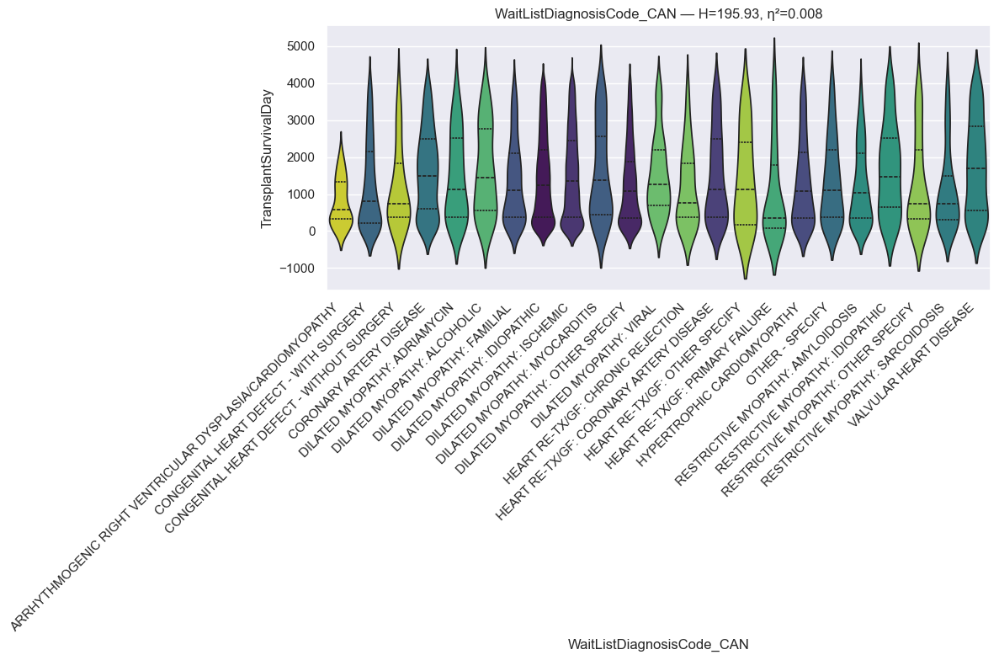

RANKING REPORT: WaitListDiagnosisCode_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY:     84 records
 * CONGENITAL HEART DEFECT - WITH SURGERY            :    550 records
 * CONGENITAL HEART DEFECT - WITHOUT SURGERY         :     47 records
 * CORONARY ARTERY DISEASE                           :    644 records
 * DILATED MYOPATHY: ADRIAMYCIN                      :    122 records
 * DILATED MYOPATHY: ALCOHOLIC                       :     73 records
 * DILATED MYOPATHY: FAMILIAL                        :    693 records
 * DILATED MYOPATHY: IDIOPATHIC                      :   7652 records
 * DILATED MYOPATHY: ISCHEMIC                        :   7649 records
 * DILATED MYOPATHY: MYOCARDITIS                     :    117 records
 * DILATED MYOPATHY: OTHER SPECIFY                   :   2061 records
 * DILATED MYOPATHY: VIRAL                           :    252 records
 * HEART RE-TX/GF: CHRONIC REJECTION                 :     68 records
 * HEART RE

In [10]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [11]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: WaitListDiagnosisCode_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY:     84 records
 * CONGENITAL HEART DEFECT - WITH SURGERY            :    550 records
 * CONGENITAL HEART DEFECT - WITHOUT SURGERY         :     47 records
 * CORONARY ARTERY DISEASE                           :    644 records
 * DILATED MYOPATHY: ADRIAMYCIN                      :    122 records
 * DILATED MYOPATHY: ALCOHOLIC                       :     73 records
 * DILATED MYOPATHY: FAMILIAL                        :    693 records
 * DILATED MYOPATHY: IDIOPATHIC                      :   7652 records
 * DILATED MYOPATHY: ISCHEMIC                        :   7649 records
 * DILATED MYOPATHY: MYOCARDITIS                     :    117 records
 * DILATED MYOPATHY: OTHER SPECIFY                   :   2061 records
 * DILATED MYOPATHY: VIRAL                           :    252 records
 * HEART RE-TX/GF: CHRONIC REJECTION                 :     68 records
 * HEART RE

In [12]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Gender

In [13]:
# info
feature = u.get_feature_info(df, 'Gender', cat=False)
# dtype
{col: df[col].dtype for col in feature}

            count unique top   freq
Gender_CAN  22236      1   M  22236

:::: NaN Count:
Gender_CAN    0 



{'Gender_CAN': CategoricalDtype(categories=['F', 'M'], ordered=False, categories_dtype=str)}

In [14]:
# add to remove_cols list
remove_cols.extend(feature)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Blood Group

In [15]:
# info
feature = u.get_feature_info(df, 'BloodGroup', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                      count unique        top   freq
BloodGroupMatchLevel  22236      3  Identical  19117
BloodGroup_CAN        22236      8          A   8865

:::: NaN Count:
BloodGroupMatchLevel    0
BloodGroup_CAN          0 



{'BloodGroupMatchLevel': CategoricalDtype(categories=['Compatible', 'Identical', 'Incompatible'], ordered=False, categories_dtype=str),
 'BloodGroup_CAN': CategoricalDtype(categories=['A', 'A1', 'A1B', 'A2', 'A2B', 'AB', 'B', 'O'], ordered=False, categories_dtype=str)}

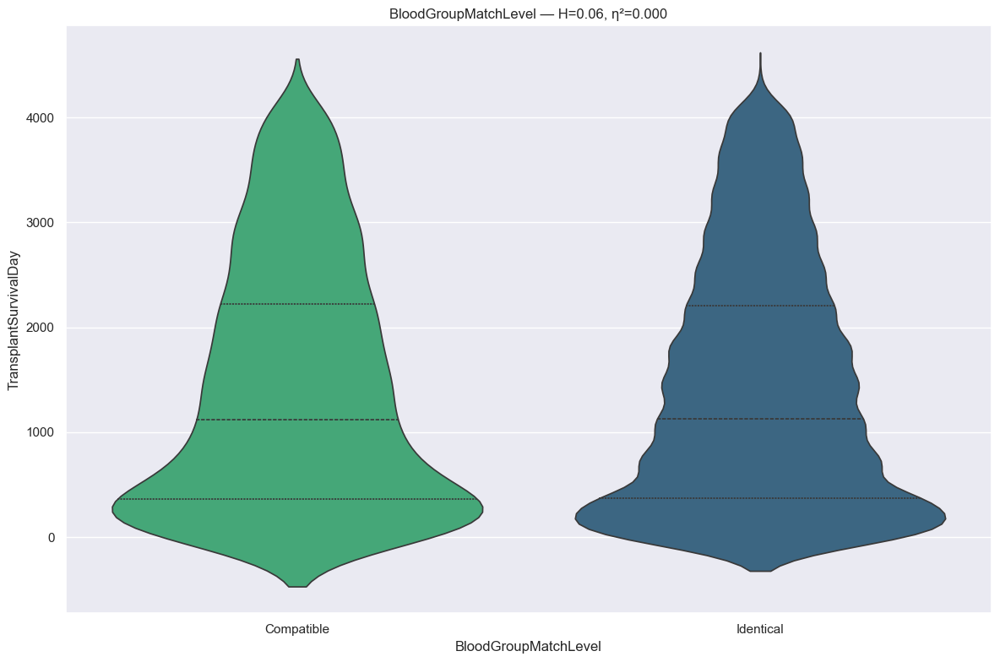

RANKING REPORT: BloodGroupMatchLevel (n ≥ 30)
INCLUDED CATEGORIES:
 * Compatible                                        :   3118 records
 * Identical                                         :  19117 records
BYPASSED CATEGORIES (n < min_n):
 * Incompatible                                      :      1 records
--------------------------------------------------------------------------------
Kruskal H: 0.0624 | P-value: 8.027700e-01 | Effect η²: 0.0000
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.10)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - Compatible
  - Identical

>>> Other (1 categories)
  - Incompatible

BloodGroupMatchLevel  mean_survival_days  median_survival_days  maximum_survival_days  minim

In [16]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "holm",
    "suppress_pairwise": True,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [17]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Citizenship

In [18]:
# info
feature = u.get_feature_info(df, 'Citizenship', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                 count unique         top   freq
Citizenship_CAN  22236      7  US Citizen  21425

:::: NaN Count:
Citizenship_CAN    0 



{'Citizenship_CAN': CategoricalDtype(categories=['NON-RESIDENT ALIEN',
                   'Non-US Citizen/Non-US Resident, Traveled to US for Reason Other Than Transplant',
                   'Non-US Citizen/Non-US Resident, Traveled to US for Transplant',
                   'Non-US Citizen/US Resident', 'RESIDENT ALIEN', 'US Citizen',
                   'Unknown'],
 , ordered=False, categories_dtype=str)}

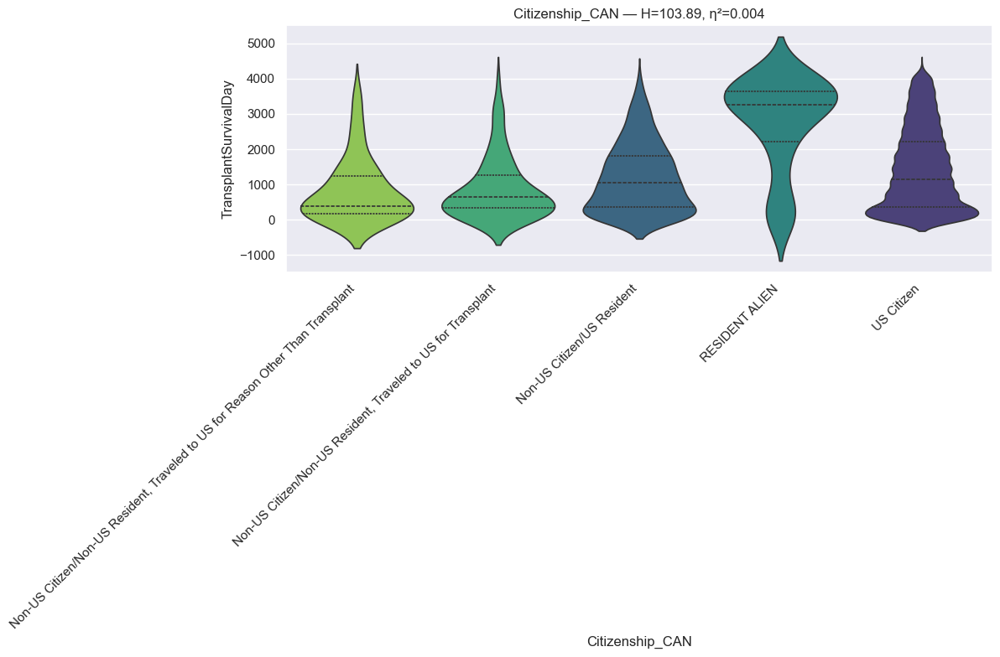

RANKING REPORT: Citizenship_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Non-US Citizen/Non-US Resident, Traveled to US for Reason Other Than Transplant:     48 records
 * Non-US Citizen/Non-US Resident, Traveled to US for Transplant:     87 records
 * Non-US Citizen/US Resident                        :    589 records
 * RESIDENT ALIEN                                    :     55 records
 * US Citizen                                        :  21425 records
BYPASSED CATEGORIES (n < min_n):
 * NON-RESIDENT ALIEN                                :     15 records
 * Unknown                                           :     17 records
--------------------------------------------------------------------------------
Kruskal H: 103.8924 | P-value: 1.458434e-21 | Effect η²: 0.0045
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0050 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Non-US Citizen/US Resident vs RESIDENT ALIEN | p=6.6533

In [19]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "min_n": 30,
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [20]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: Citizenship_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Non-US Citizen/Non-US Resident, Traveled to US for Reason Other Than Transplant:     48 records
 * Non-US Citizen/Non-US Resident, Traveled to US for Transplant:     87 records
 * Non-US Citizen/US Resident                        :    589 records
 * RESIDENT ALIEN                                    :     55 records
 * US Citizen                                        :  21425 records
BYPASSED CATEGORIES (n < min_n):
 * NON-RESIDENT ALIEN                                :     15 records
 * Unknown                                           :     17 records
--------------------------------------------------------------------------------
Kruskal H: 103.8924 | P-value: 1.458434e-21 | Effect η²: 0.0045
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapse

In [21]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Residency State Registration

In [22]:
# info
feature = u.get_feature_info(df, 'ResidencyStateRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                count unique top  freq
ResidencyStateRegistration_CAN  22236     56  CA  2653

:::: NaN Count:
ResidencyStateRegistration_CAN    0 



{'ResidencyStateRegistration_CAN': CategoricalDtype(categories=['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL',
                   'GA', 'GU', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA',
                   'MA', 'MD', 'ME', 'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND',
                   'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA',
                   'PR', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'Unknown', 'VA',
                   'VI', 'VT', 'WA', 'WI', 'WV', 'WY', 'ZZ'],
 , ordered=False, categories_dtype=str)}

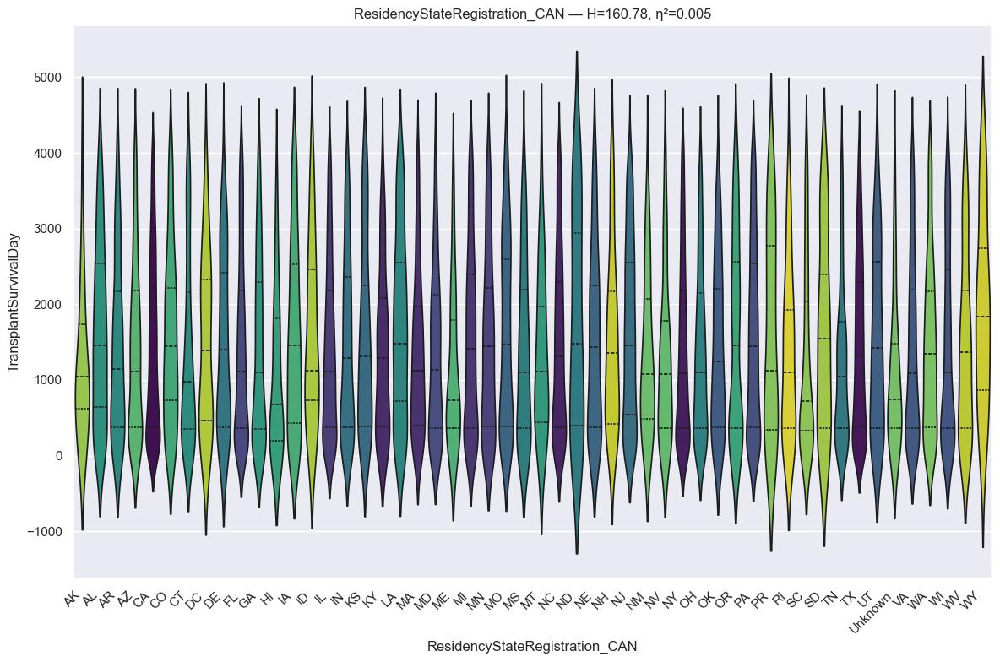

RANKING REPORT: ResidencyStateRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * AK                                                :     33 records
 * AL                                                :    188 records
 * AR                                                :    167 records
 * AZ                                                :    385 records
 * CA                                                :   2653 records
 * CO                                                :    228 records
 * CT                                                :    384 records
 * DC                                                :     46 records
 * DE                                                :     80 records
 * FL                                                :   1445 records
 * GA                                                :    505 records
 * HI                                                :     57 records
 * IA                                                :    206 records
 * ID        

In [23]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [24]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: ResidencyStateRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * AK                                                :     33 records
 * AL                                                :    188 records
 * AR                                                :    167 records
 * AZ                                                :    385 records
 * CA                                                :   2653 records
 * CO                                                :    228 records
 * CT                                                :    384 records
 * DC                                                :     46 records
 * DE                                                :     80 records
 * FL                                                :   1445 records
 * GA                                                :    505 records
 * HI                                                :     57 records
 * IA                                                :    206 records
 * ID        

In [25]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Education Level

In [26]:
# info
feature = u.get_feature_info(df, 'EducationLevel', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                    count unique                        top  freq
EducationLevel_CAN  22236      7  HIGH SCHOOL (9-12) or GED  8297

:::: NaN Count:
EducationLevel_CAN    0 



{'EducationLevel_CAN': CategoricalDtype(categories=['ASSOCIATE/BACHELOR DEGREE',
                   'ATTENDED COLLEGE/TECHNICAL SCHOOL', 'GRADE SCHOOL (0-8)',
                   'HIGH SCHOOL (9-12) or GED', 'NONE',
                   'POST-COLLEGE GRADUATE DEGREE', 'Unknown'],
 , ordered=False, categories_dtype=str)}

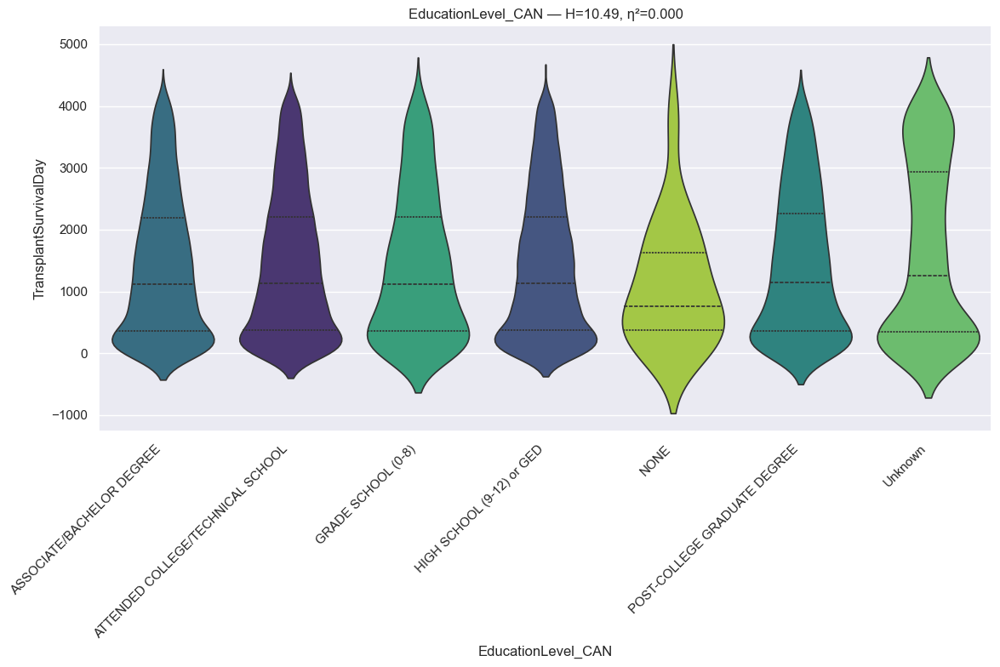

RANKING REPORT: EducationLevel_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * ASSOCIATE/BACHELOR DEGREE                         :   4278 records
 * ATTENDED COLLEGE/TECHNICAL SCHOOL                 :   5991 records
 * GRADE SCHOOL (0-8)                                :    676 records
 * HIGH SCHOOL (9-12) or GED                         :   8297 records
 * NONE                                              :     35 records
 * POST-COLLEGE GRADUATE DEGREE                      :   2014 records
 * Unknown                                           :    945 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 10.4934 | P-value: 1.053533e-01 | Effect η²: 0.0002
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0024 | r_threshold: 0.10)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::

In [27]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": True,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [28]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: EducationLevel_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * ASSOCIATE/BACHELOR DEGREE                         :   4278 records
 * ATTENDED COLLEGE/TECHNICAL SCHOOL                 :   5991 records
 * GRADE SCHOOL (0-8)                                :    676 records
 * HIGH SCHOOL (9-12) or GED                         :   8297 records
 * NONE                                              :     35 records
 * POST-COLLEGE GRADUATE DEGREE                      :   2014 records
 * Unknown                                           :    945 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 10.4934 | P-value: 1.053533e-01 | Effect η²: 0.0002
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

::

In [29]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life-Support Registration ECMO
* ECMO (Extracorporeal Membrane Oxygenation) serves as a critical, increasingly used "bridge" to heart transplantation or ventricular assist devices (LVAD) for patients in severe cardiogenic shock. The Extracorporeal Life Support Organization (ELSO) Registry tracks these cases, which have shown growing utilization—up to 22.2% in 2019—with high-risk patients often bridged to transplant within 24 hours of admission for best outcomes.

In [30]:
# info
feature = u.get_feature_info(df, 'LifeSupportRegistration_ECMO_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                  count unique top   freq
LifeSupportRegistration_ECMO_CAN  22236      2  No  21858

:::: NaN Count:
LifeSupportRegistration_ECMO_CAN    0 



{'LifeSupportRegistration_ECMO_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

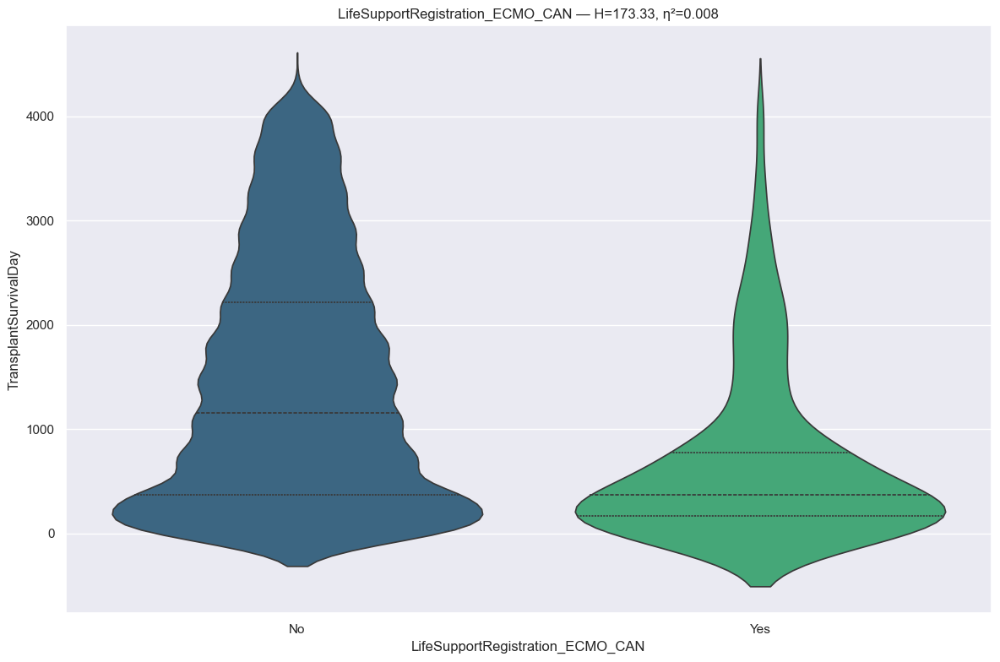

RANKING REPORT: LifeSupportRegistration_ECMO_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21858 records
 * Yes                                               :    378 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 173.3299 | P-value: 1.386490e-39 | Effect η²: 0.0078
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.3866e-39 | thr=0.0500 | r=-0.394 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

LifeSupportRegistration_ECMO_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
              

In [31]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [32]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Registration IABP
* The Intra-Aortic Balloon Pump (IABP) is a widely used mechanical circulatory support (MCS) device, particularly as a temporary bridge to heart transplantation (BTT) for patients in cardiogenic shock. Since the October 2018 UNOS/OPTN policy change in the U.S., the use of IABP in this context has increased more than threefold, improving waitlist outcomes with comparable post-transplant survival.

In [33]:
# info
feature = u.get_feature_info(df, 'LifeSupportRegistration_IABP', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                  count unique top   freq
LifeSupportRegistration_IABP_CAN  22236      2  No  20415

:::: NaN Count:
LifeSupportRegistration_IABP_CAN    0 



{'LifeSupportRegistration_IABP_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

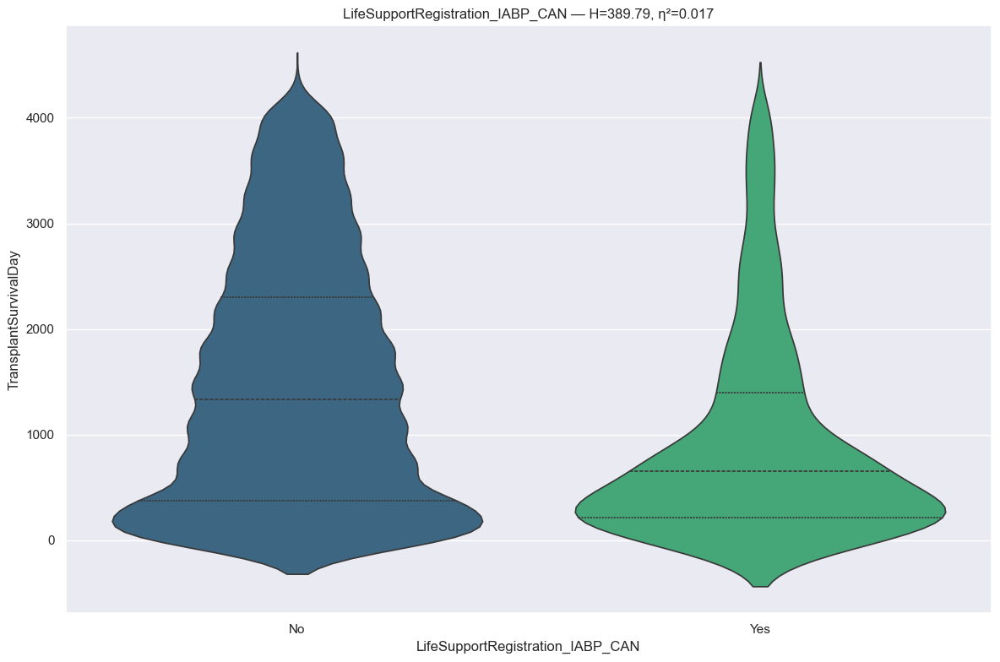

RANKING REPORT: LifeSupportRegistration_IABP_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  20415 records
 * Yes                                               :   1821 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 389.7945 | P-value: 9.175317e-87 | Effect η²: 0.0175
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=9.1757e-87 | thr=0.0500 | r=-0.279 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

LifeSupportRegistration_IABP_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
              

In [34]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [35]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Inhaled
* Inhaled therapies, particularly inhaled Nitric Oxide (iNO), are used during and after heart transplantation to treat pulmonary hypertension and right ventricular dysfunction. They act as selective pulmonary vasodilators, improving graft function and reducing ischemia-reperfusion injury. Life support systems, such as ECMO (extracorporeal membrane oxygenation), may also be used in cases of early graft failure.

In [36]:
# info
feature = u.get_feature_info(df, 'LifeSupportInhaled_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique top   freq
LifeSupportInhaled_CAN  22236      2  No  22191

:::: NaN Count:
LifeSupportInhaled_CAN    0 



{'LifeSupportInhaled_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

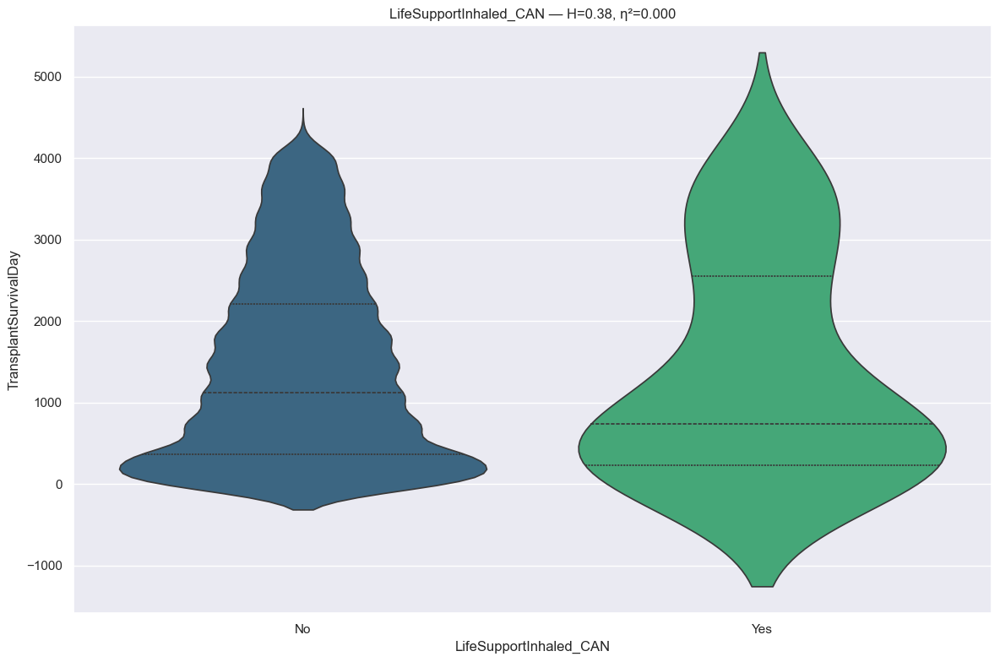

RANKING REPORT: LifeSupportInhaled_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  22191 records
 * Yes                                               :     45 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 0.3804 | P-value: 5.373664e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=5.3737e-01 | thr=0.0500 | r=-0.053 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

LifeSupportInhaled_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                    No         1436.823081                1126

In [37]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [38]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Inotropes IV Registration
* Intravenous (IV) inotropes, such as milrinone or dobutamine, are critical bridge-to-transplant therapies used to stabilize patients with advanced heart failure. They are frequently used to support patients listed for heart transplants, with studies showing 55 out of 60 patients maintained on inotropes successfully until transplantation or LVAD

In [39]:
# info
feature = u.get_feature_info(df, 'InotropesIVRegistration_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                             count unique top   freq
InotropesIVRegistration_CAN  22236      2  No  14937

:::: NaN Count:
InotropesIVRegistration_CAN    0 



{'InotropesIVRegistration_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

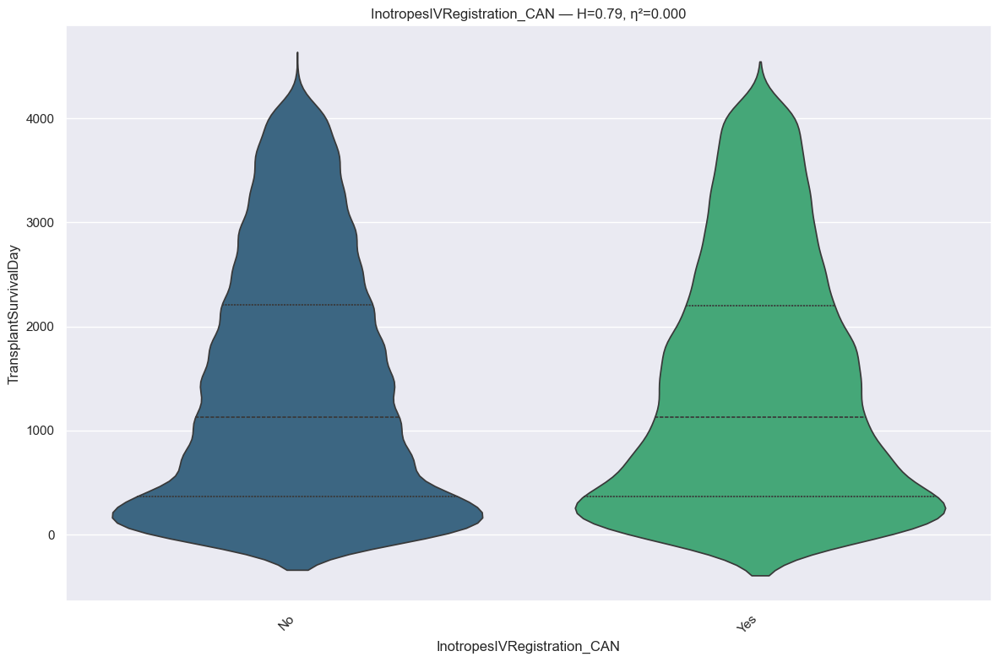

RANKING REPORT: InotropesIVRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  14937 records
 * Yes                                               :   7299 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 0.7915 | P-value: 3.736406e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=3.7364e-01 | thr=0.0500 | r= 0.007 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

InotropesIVRegistration_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                         No         1432.866037     

In [40]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [41]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### LifeSupport Registration PGE

In [42]:
# info
feature = u.get_feature_info(df, 'LifeSupportRegistration_PGE', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                 count unique top   freq
LifeSupportRegistration_PGE_CAN  22236      2  No  22223

:::: NaN Count:
LifeSupportRegistration_PGE_CAN    0 



{'LifeSupportRegistration_PGE_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

In [43]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

[WARNING] Cannot perform statistical comparison for LifeSupportRegistration_PGE_CAN
          Only 1 category has n ≥ 30.
          You can only compare MORE THAN ONE category since n < min_n.

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

LifeSupportRegistration_PGE_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                             No         1436.602844                1126.0                 4300.0                    0.0         22223
                            Yes         1687.692308                1312.0                 4001.0                  176.0            13


In [44]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Life Support Mechanism Registration OTHER

In [45]:
# info
feature = u.get_feature_info(df, 'LifeSupportMechanismRegistration_OTHER', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                            count unique top   freq
LifeSupportMechanismRegistration_OTHER_CAN  22236      2  No  21128

:::: NaN Count:
LifeSupportMechanismRegistration_OTHER_CAN    0 



{'LifeSupportMechanismRegistration_OTHER_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

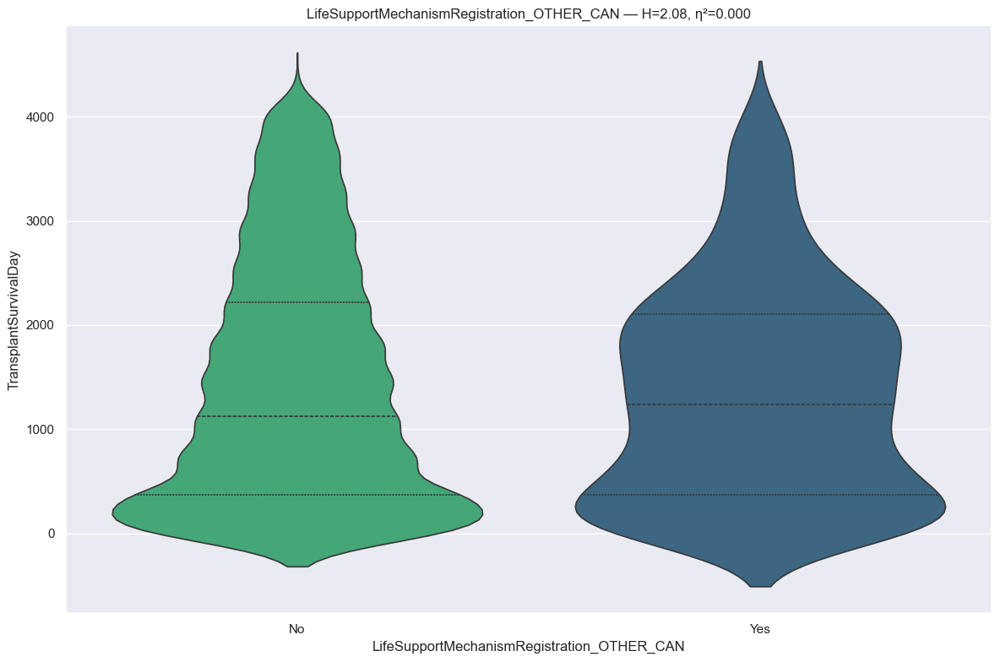

RANKING REPORT: LifeSupportMechanismRegistration_OTHER_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21128 records
 * Yes                                               :   1108 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 2.0790 | P-value: 1.493359e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.4934e-01 | thr=0.0500 | r=-0.026 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

LifeSupportMechanismRegistration_OTHER_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                      

In [46]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [47]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** Only keep this due to the difference in Other and will not collapse due to clinical interpretation.

In [48]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Ventricular Device Type Registration

In [49]:
# info
feature = u.get_feature_info(df, 'VentricularDeviceTypeRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                       count unique   top   freq
VentricularDeviceTypeRegistration_CAN  22236      6  None  15475

:::: NaN Count:
VentricularDeviceTypeRegistration_CAN    0 



{'VentricularDeviceTypeRegistration_CAN': CategoricalDtype(categories=['Lvad', 'Lvad+Rvad', 'None', 'Rvad', 'Tah', 'Unknown'], ordered=False, categories_dtype=str)}

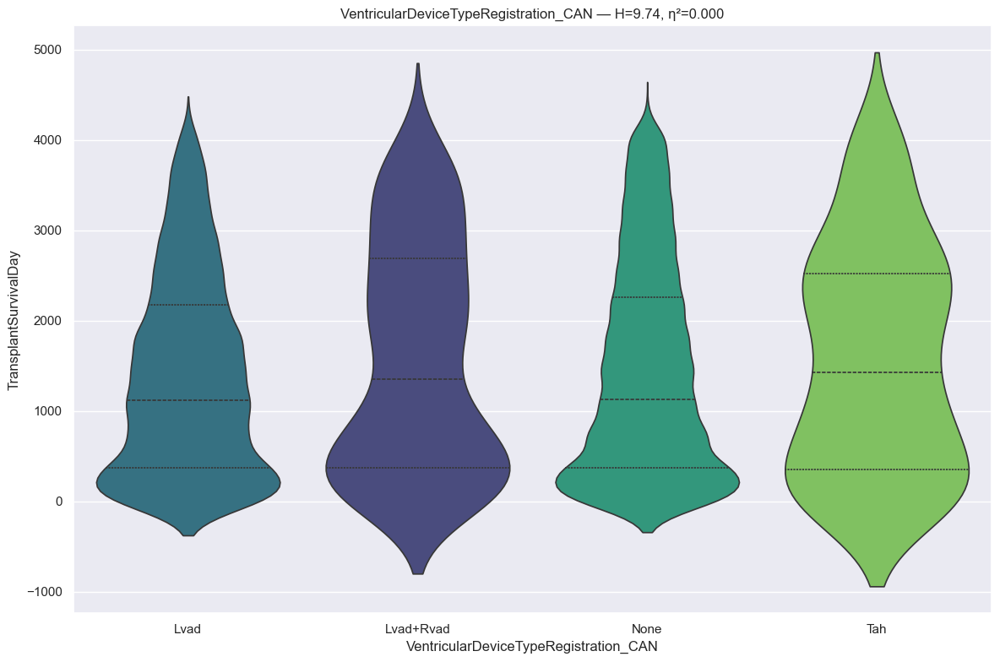

RANKING REPORT: VentricularDeviceTypeRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Lvad                                              :   6276 records
 * Lvad+Rvad                                         :    311 records
 * None                                              :  15475 records
 * Tah                                               :    135 records
BYPASSED CATEGORIES (n < min_n):
 * Rvad                                              :     21 records
 * Unknown                                           :     18 records
--------------------------------------------------------------------------------
Kruskal H: 9.7351 | P-value: 2.095724e-02 | Effect η²: 0.0003
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Lvad         vs None         | p=7.2984e-03 | thr=0.0083 | r= 0.023 | *Sig*
Lvad         vs Lvad+Rvad    | p=5.6705e-02 | thr=0.0083 | r= 0.064 |

In [50]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [51]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: VentricularDeviceTypeRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Lvad                                              :   6276 records
 * Lvad+Rvad                                         :    311 records
 * None                                              :  15475 records
 * Tah                                               :    135 records
BYPASSED CATEGORIES (n < min_n):
 * Rvad                                              :     21 records
 * Unknown                                           :     18 records
--------------------------------------------------------------------------------
Kruskal H: 9.7351 | P-value: 2.095724e-02 | Effect η²: 0.0003
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORI

In [52]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Functional Status Registration

In [53]:
# info
feature = u.get_feature_info(df, 'FunctionalStatusRegistration_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                  count unique top  freq
FunctionalStatusRegistration_CAN  21528     10  20  5035

:::: NaN Count:
FunctionalStatusRegistration_CAN    708 



{'FunctionalStatusRegistration_CAN': CategoricalDtype(categories=['10', '100', '20', '30', '40', '50', '60', '70', '80', '90'], ordered=False, categories_dtype=str)}

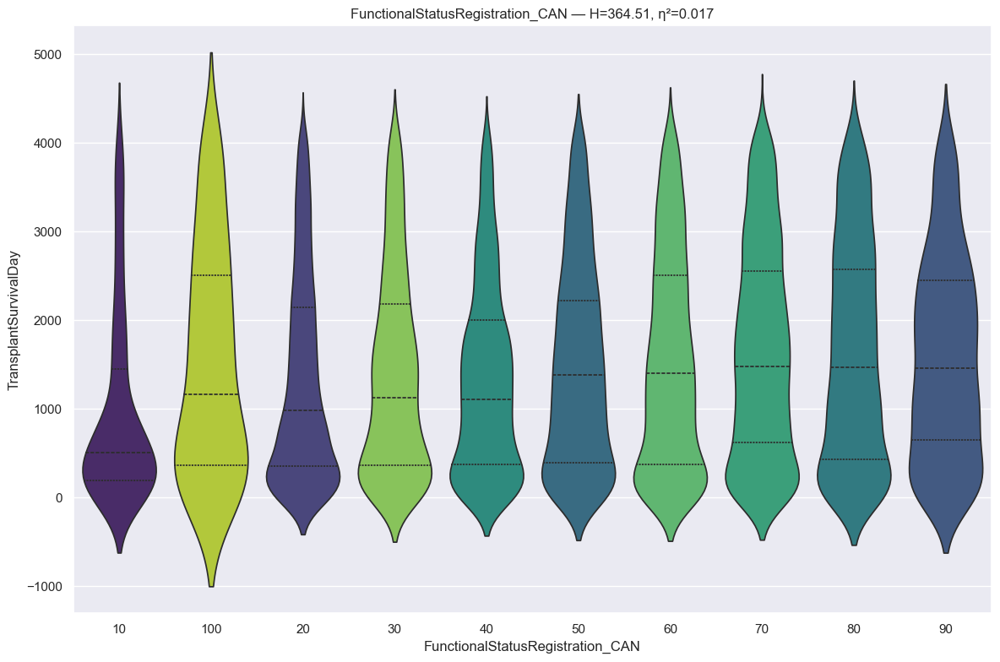

RANKING REPORT: FunctionalStatusRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 10                                                :    504 records
 * 100                                               :    102 records
 * 20                                                :   5035 records
 * 30                                                :   1978 records
 * 40                                                :   2993 records
 * 50                                                :   2351 records
 * 60                                                :   2732 records
 * 70                                                :   3157 records
 * 80                                                :   2039 records
 * 90                                                :    637 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 364.5140 | P-value: 5.034103e-73 | Effect η²: 0.0165
Correction Method: BONFERRONI
Pairwise Testing (Bo

In [54]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [55]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: FunctionalStatusRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 10                                                :    504 records
 * 100                                               :    102 records
 * 20                                                :   5035 records
 * 30                                                :   1978 records
 * 40                                                :   2993 records
 * 50                                                :   2351 records
 * 60                                                :   2732 records
 * 70                                                :   3157 records
 * 80                                                :   2039 records
 * 90                                                :    637 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 364.5140 | P-value: 5.034103e-73 | Effect η²: 0.0165
Correction Method: HOLM
Pairwise Testing (Base Alp

In [56]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.True_

#### Primary Payment Registration

In [57]:
# info
feature = u.get_feature_info(df, 'PrimaryPaymentRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                count unique                top   freq
PrimaryPaymentRegistration_CAN  22236     14  Private insurance  11380

:::: NaN Count:
PrimaryPaymentRegistration_CAN    0 



{'PrimaryPaymentRegistration_CAN': CategoricalDtype(categories=['Donation', 'Foreign Government Specify', 'Free Care',
                   'Missing', 'Pending', 'Private insurance',
                   'Public insurance - CHIP (Children's Health Insurance Program)',
                   'Public insurance - Department of VA',
                   'Public insurance - Medicaid',
                   'Public insurance - Medicare & Choice',
                   'Public insurance - Medicare (further detail not collected)',
                   'Public insurance - Medicare FFS (Fee for Service)',
                   'Public insurance - Other government', 'Self'],
 , ordered=False, categories_dtype=str)}

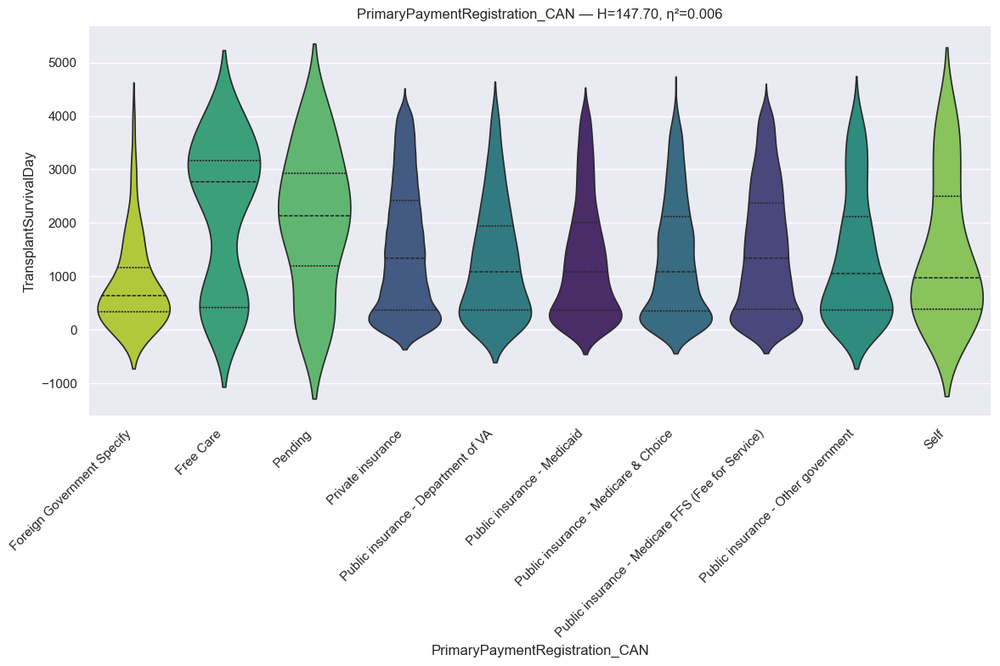

RANKING REPORT: PrimaryPaymentRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Foreign Government Specify                        :     64 records
 * Free Care                                         :     54 records
 * Pending                                           :     30 records
 * Private insurance                                 :  11380 records
 * Public insurance - Department of VA               :    514 records
 * Public insurance - Medicaid                       :   2709 records
 * Public insurance - Medicare & Choice              :   2973 records
 * Public insurance - Medicare FFS (Fee for Service) :   4110 records
 * Public insurance - Other government               :    334 records
 * Self                                              :     41 records
BYPASSED CATEGORIES (n < min_n):
 * Donation                                          :      4 records
 * Missing                                           :     17 records
 * Public insurance - CHIP (Children's Health Insu

In [58]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [59]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PrimaryPaymentRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Foreign Government Specify                        :     64 records
 * Free Care                                         :     54 records
 * Pending                                           :     30 records
 * Private insurance                                 :  11380 records
 * Public insurance - Department of VA               :    514 records
 * Public insurance - Medicaid                       :   2709 records
 * Public insurance - Medicare & Choice              :   2973 records
 * Public insurance - Medicare FFS (Fee for Service) :   4110 records
 * Public insurance - Other government               :    334 records
 * Self                                              :     41 records
BYPASSED CATEGORIES (n < min_n):
 * Donation                                          :      4 records
 * Missing                                           :     17 records
 * Public insurance - CHIP (Children's Health Insu

In [60]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Diagnosis At Listing

In [61]:
# info
feature = u.get_feature_info(df, 'DiagnosisAtListing', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique                           top  freq
DiagnosisAtListing_CAN  22236     38  DILATED MYOPATHY: IDIOPATHIC  7665

:::: NaN Count:
DiagnosisAtListing_CAN    0 



{'DiagnosisAtListing_CAN': CategoricalDtype(categories=['ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY',
                   'CANCER',
                   'CONGENITAL HEART DEFECT - HYPOPLASTIC LEFT HEART SYNDROME - UNOPERATED',
                   'CONGENITAL HEART DEFECT - PRIOR SURGERY UNKNOWN',
                   'CONGENITAL HEART DEFECT - WITH SURGERY',
                   'CONGENITAL HEART DEFECT - WITHOUT SURGERY',
                   'CORONARY ARTERY DISEASE',
                   'COVID-19: DILATED MYOPATHY: ACTIVE MYOCARDITIS',
                   'COVID-19: DILATED MYOPATHY: HISTORY OF MYOCARDITIS',
                   'DILATED MYOPATHY: ADRIAMYCIN',
                   'DILATED MYOPATHY: ALCOHOLIC', 'DILATED MYOPATHY: FAMILIAL',
                   'DILATED MYOPATHY: IDIOPATHIC', 'DILATED MYOPATHY: ISCHEMIC',
                   'DILATED MYOPATHY: MYOCARDITIS',
                   'DILATED MYOPATHY: OTHER SPECIFY',
                   'DILATED MYOPATHY: POST PARTUM', 'DILATED

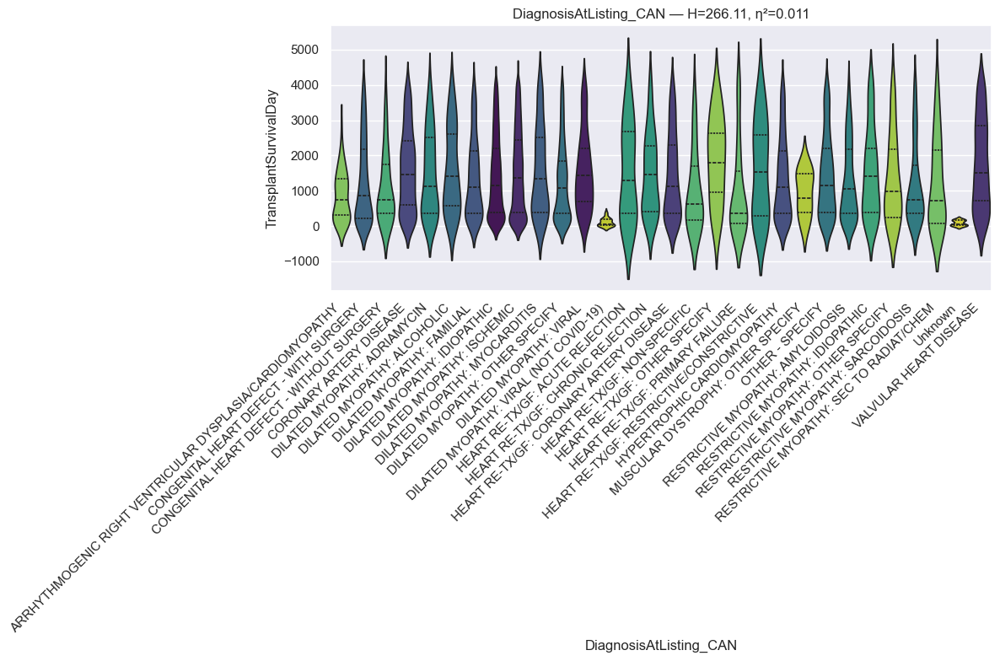

RANKING REPORT: DiagnosisAtListing_CAN (n ≥ 10)
INCLUDED CATEGORIES:
 * ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY:     84 records
 * CONGENITAL HEART DEFECT - WITH SURGERY            :    557 records
 * CONGENITAL HEART DEFECT - WITHOUT SURGERY         :     50 records
 * CORONARY ARTERY DISEASE                           :    735 records
 * DILATED MYOPATHY: ADRIAMYCIN                      :    133 records
 * DILATED MYOPATHY: ALCOHOLIC                       :     86 records
 * DILATED MYOPATHY: FAMILIAL                        :    681 records
 * DILATED MYOPATHY: IDIOPATHIC                      :   7665 records
 * DILATED MYOPATHY: ISCHEMIC                        :   7541 records
 * DILATED MYOPATHY: MYOCARDITIS                     :    121 records
 * DILATED MYOPATHY: OTHER SPECIFY                   :   1808 records
 * DILATED MYOPATHY: VIRAL                           :    256 records
 * DILATED MYOPATHY: VIRAL (NOT COVID-19)            :     23 records
 * HEART RE-TX

In [62]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45,
    "min_n": 10
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [63]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: DiagnosisAtListing_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY:     84 records
 * CONGENITAL HEART DEFECT - WITH SURGERY            :    557 records
 * CONGENITAL HEART DEFECT - WITHOUT SURGERY         :     50 records
 * CORONARY ARTERY DISEASE                           :    735 records
 * DILATED MYOPATHY: ADRIAMYCIN                      :    133 records
 * DILATED MYOPATHY: ALCOHOLIC                       :     86 records
 * DILATED MYOPATHY: FAMILIAL                        :    681 records
 * DILATED MYOPATHY: IDIOPATHIC                      :   7665 records
 * DILATED MYOPATHY: ISCHEMIC                        :   7541 records
 * DILATED MYOPATHY: MYOCARDITIS                     :    121 records
 * DILATED MYOPATHY: OTHER SPECIFY                   :   1808 records
 * DILATED MYOPATHY: VIRAL                           :    256 records
 * HEART RE-TX/GF: CHRONIC REJECTION                 :     79 records
 * HEART RE-TX

In [64]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Diabetes Type

In [65]:
# info
feature = u.get_feature_info(df, 'DiabetesType_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                  count unique top   freq
DiabetesType_CAN  22236      7  No  15441

:::: NaN Count:
DiabetesType_CAN    0 



{'DiabetesType_CAN': CategoricalDtype(categories=['Diabetes Status Unknown', 'No', 'Type I', 'Type II',
                   'Type Other', 'Type Unknown', 'Unknown'],
 , ordered=False, categories_dtype=str)}

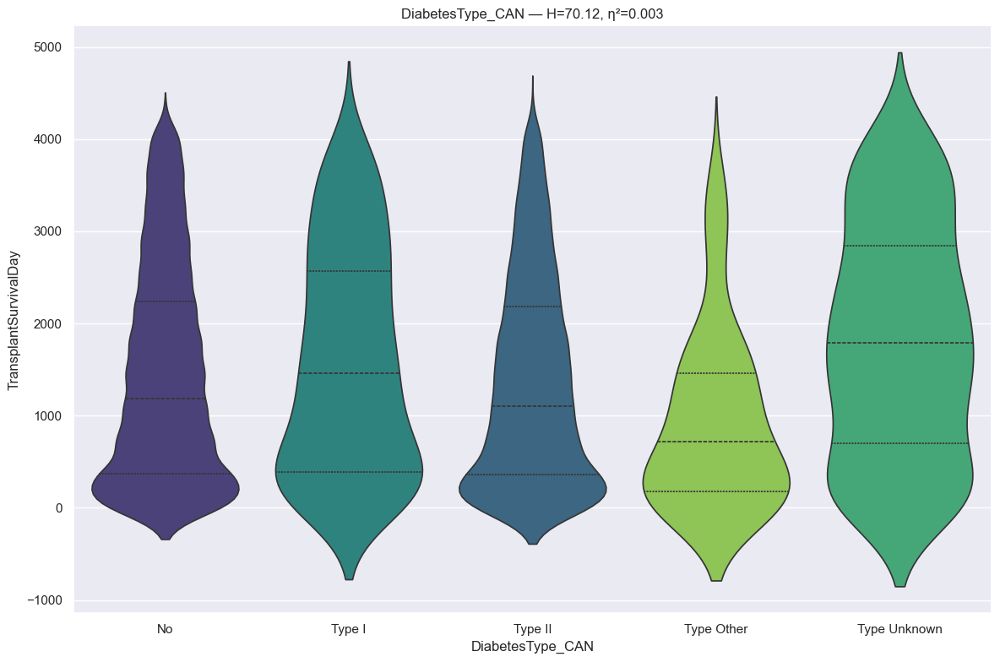

RANKING REPORT: DiabetesType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  15441 records
 * Type I                                            :    291 records
 * Type II                                           :   6158 records
 * Type Other                                        :     83 records
 * Type Unknown                                      :    226 records
BYPASSED CATEGORIES (n < min_n):
 * Diabetes Status Unknown                           :     20 records
 * Unknown                                           :     17 records
--------------------------------------------------------------------------------
Kruskal H: 70.1247 | P-value: 2.136296e-14 | Effect η²: 0.0030
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0050 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Type II      | p=1.5925e-08 | thr=0.0050 | r=-0.049 | *Sig*
Type Other   vs Typ

In [66]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [67]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: DiabetesType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  15441 records
 * Type I                                            :    291 records
 * Type II                                           :   6158 records
 * Type Other                                        :     83 records
 * Type Unknown                                      :    226 records
BYPASSED CATEGORIES (n < min_n):
 * Diabetes Status Unknown                           :     20 records
 * Unknown                                           :     17 records
--------------------------------------------------------------------------------
Kruskal H: 70.1247 | P-value: 2.136296e-14 | Effect η²: 0.0030
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 5 groups (excluding 'Other') ::::

In [68]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Dialysis Type Registration

In [69]:
# info
feature = u.get_feature_info(df, 'DialysisTypeRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                              count unique          top   freq
DialysisTypeRegistration_CAN  22236      6  No dialysis  21548

:::: NaN Count:
DialysisTypeRegistration_CAN    0 



{'DialysisTypeRegistration_CAN': CategoricalDtype(categories=['Dialysis - Unknown Type was performed',
                   'Dialysis Status Unknown', 'Hemodialysis', 'No dialysis',
                   'Peritoneal Dialysis', 'Unknown'],
 , ordered=False, categories_dtype=str)}

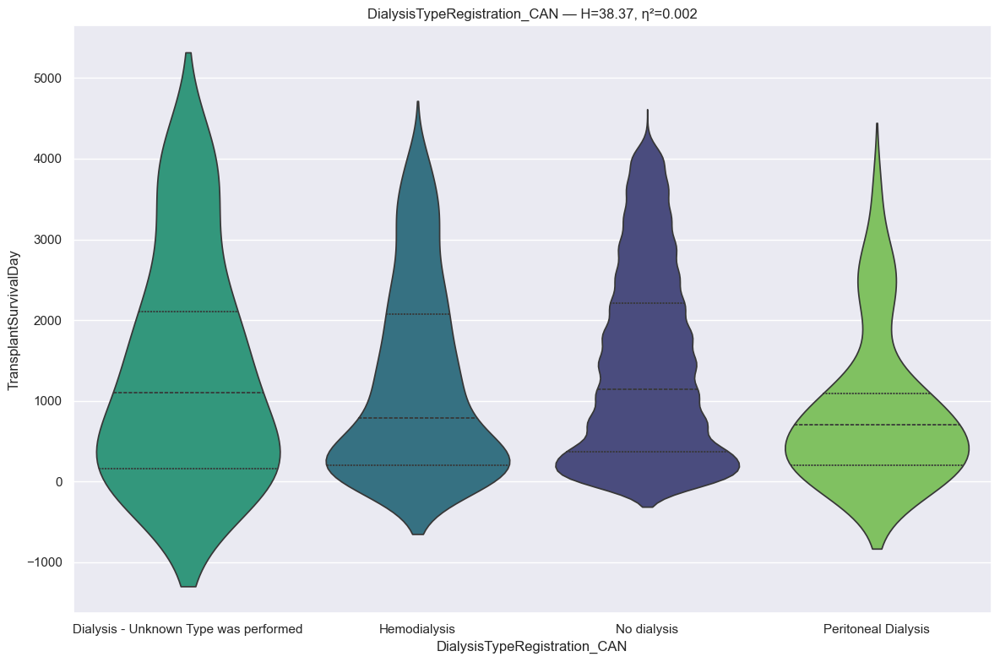

RANKING REPORT: DialysisTypeRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Dialysis - Unknown Type was performed             :     39 records
 * Hemodialysis                                      :    572 records
 * No dialysis                                       :  21548 records
 * Peritoneal Dialysis                               :     46 records
BYPASSED CATEGORIES (n < min_n):
 * Dialysis Status Unknown                           :     12 records
 * Unknown                                           :     19 records
--------------------------------------------------------------------------------
Kruskal H: 38.3699 | P-value: 2.360039e-08 | Effect η²: 0.0016
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Hemodialysis vs No dialysis  | p=5.7136e-07 | thr=0.0083 | r= 0.122 | *Sig*
No dialysis  vs Peritoneal Dialysis | p=3.9237e-04 | thr=0.0083 | r=-0.302 | 

In [70]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [71]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: DialysisTypeRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Dialysis - Unknown Type was performed             :     39 records
 * Hemodialysis                                      :    572 records
 * No dialysis                                       :  21548 records
 * Peritoneal Dialysis                               :     46 records
BYPASSED CATEGORIES (n < min_n):
 * Dialysis Status Unknown                           :     12 records
 * Unknown                                           :     19 records
--------------------------------------------------------------------------------
Kruskal H: 38.3699 | P-value: 2.360039e-08 | Effect η²: 0.0016
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::

In [72]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Cerebro Vascular Disease

In [73]:
# info
feature = u.get_feature_info(df, 'CerebroVascularDisease', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                            count unique top   freq
CerebroVascularDisease_CAN  22236      3  No  20670

:::: NaN Count:
CerebroVascularDisease_CAN    0 



{'CerebroVascularDisease_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

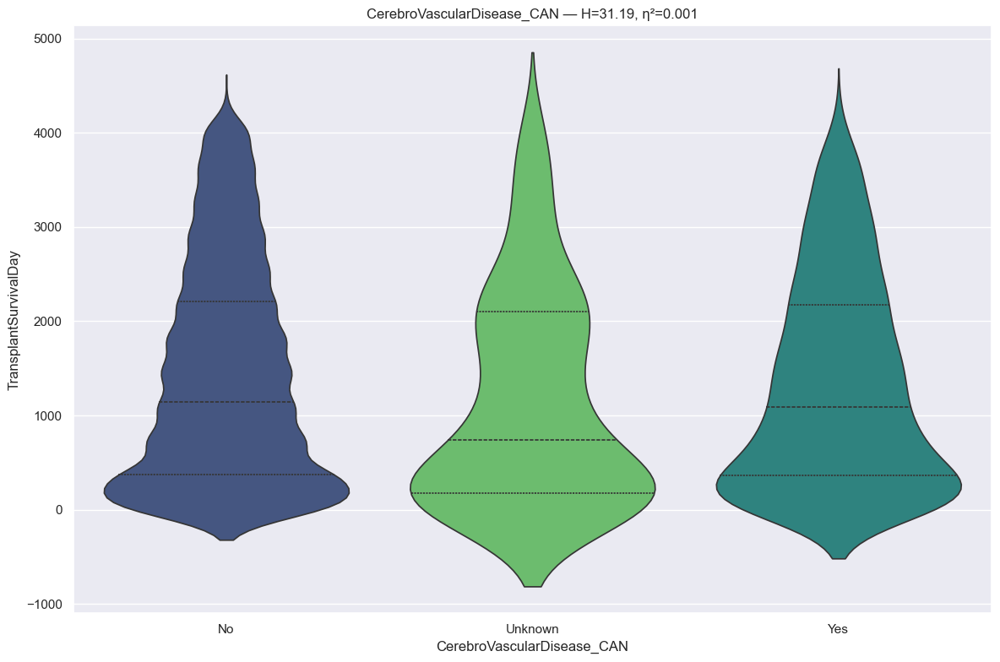

RANKING REPORT: CerebroVascularDisease_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  20670 records
 * Unknown                                           :    170 records
 * Yes                                               :   1396 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 31.1861 | P-value: 1.690546e-07 | Effect η²: 0.0013
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=3.9837e-05 | thr=0.0167 | r=-0.066 | *Sig*
No           vs Unknown      | p=1.1013e-04 | thr=0.0167 | r=-0.172 | *Sig*
Unknown      vs Yes          | p=1.4366e-02 | thr=0.0167 | r= 0.115 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> G

In [74]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [75]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Previous Malignancy

In [76]:
# info
feature = u.get_feature_info(df, 'PreviousMalignancy', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique top   freq
PreviousMalignancy_CAN  22236      3  No  20638

:::: NaN Count:
PreviousMalignancy_CAN    0 



{'PreviousMalignancy_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

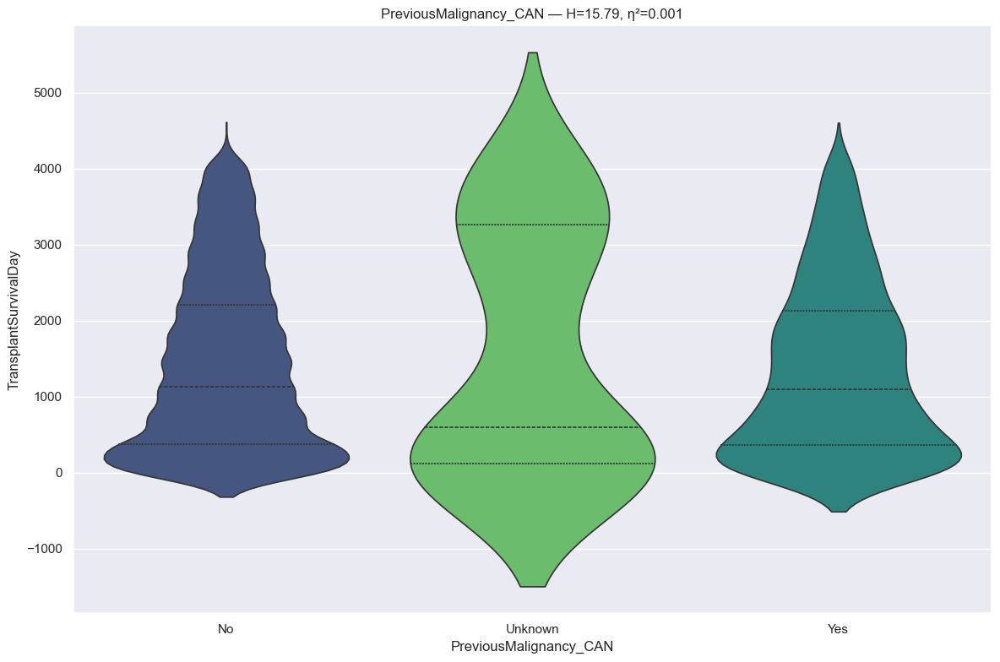

RANKING REPORT: PreviousMalignancy_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  20638 records
 * Unknown                                           :     42 records
 * Yes                                               :   1556 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 15.7947 | P-value: 3.717349e-04 | Effect η²: 0.0006
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=9.0094e-05 | thr=0.0167 | r=-0.059 | *Sig*
No           vs Unknown      | p=4.6873e-01 | thr=0.0167 | r=-0.065 | Not Sig
Unknown      vs Yes          | p=8.3200e-01 | thr=0.0167 | r= 0.019 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> G

In [77]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [78]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PreviousMalignancy_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  20638 records
 * Unknown                                           :     42 records
 * Yes                                               :   1556 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 15.7947 | P-value: 3.717349e-04 | Effect η²: 0.0006
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (2 categories)
  - Unknown
  - Yes



In [79]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Defibrillator Implant Registration

In [80]:
# info
feature = u.get_feature_info(df, 'DefibrillatorImplantRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                      count unique  top   freq
DefibrillatorImplantRegistration_CAN  22236      3  Yes  16772

:::: NaN Count:
DefibrillatorImplantRegistration_CAN    0 



{'DefibrillatorImplantRegistration_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

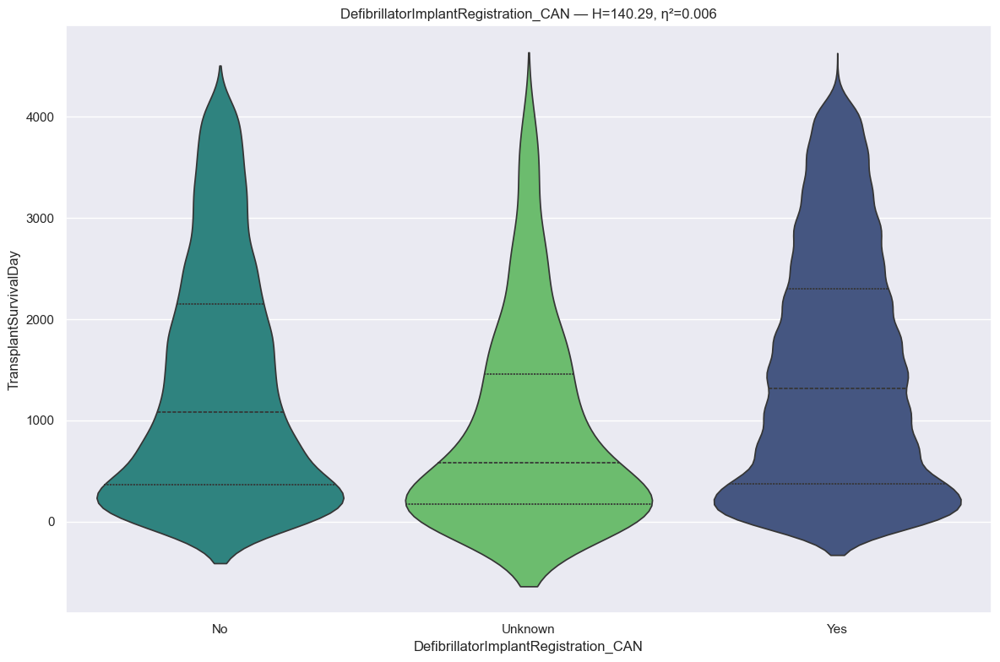

RANKING REPORT: DefibrillatorImplantRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   5192 records
 * Unknown                                           :    272 records
 * Yes                                               :  16772 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 140.2869 | P-value: 3.444147e-31 | Effect η²: 0.0062
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=6.4976e-19 | thr=0.0167 | r= 0.313 | *Sig*
No           vs Yes          | p=9.1425e-17 | thr=0.0167 | r= 0.076 | *Sig*
No           vs Unknown      | p=7.7199e-12 | thr=0.0167 | r=-0.246 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::

In [81]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [82]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropes Vasodilators Registration SYS

In [83]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsRegistration_SYS', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                           count unique top   freq
InotropesVasodilatorsRegistration_SYS_CAN  22236      3  No  12590

:::: NaN Count:
InotropesVasodilatorsRegistration_SYS_CAN    0 



{'InotropesVasodilatorsRegistration_SYS_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

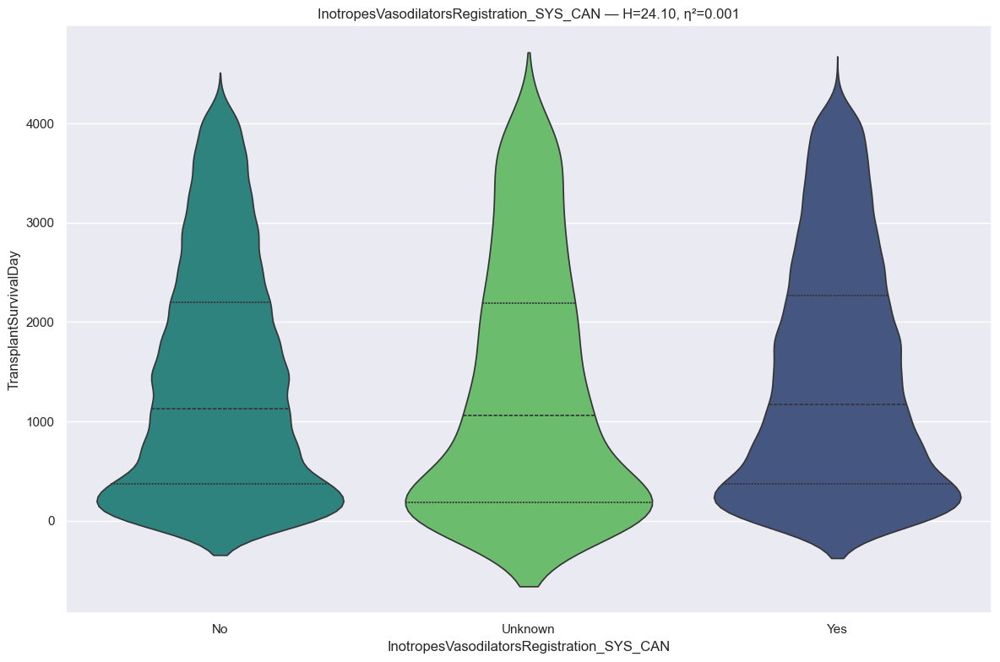

RANKING REPORT: InotropesVasodilatorsRegistration_SYS_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12590 records
 * Unknown                                           :    715 records
 * Yes                                               :   8931 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 24.0951 | P-value: 5.858923e-06 | Effect η²: 0.0010
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=3.9895e-06 | thr=0.0167 | r= 0.103 | *Sig*
No           vs Unknown      | p=1.6432e-04 | thr=0.0167 | r=-0.084 | *Sig*
No           vs Yes          | p=1.0300e-02 | thr=0.0167 | r= 0.020 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::

In [84]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [85]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropes Vasodilators Registration DIA

In [86]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsRegistration_DIA', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                           count unique top   freq
InotropesVasodilatorsRegistration_DIA_CAN  22236      3  No  12582

:::: NaN Count:
InotropesVasodilatorsRegistration_DIA_CAN    0 



{'InotropesVasodilatorsRegistration_DIA_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

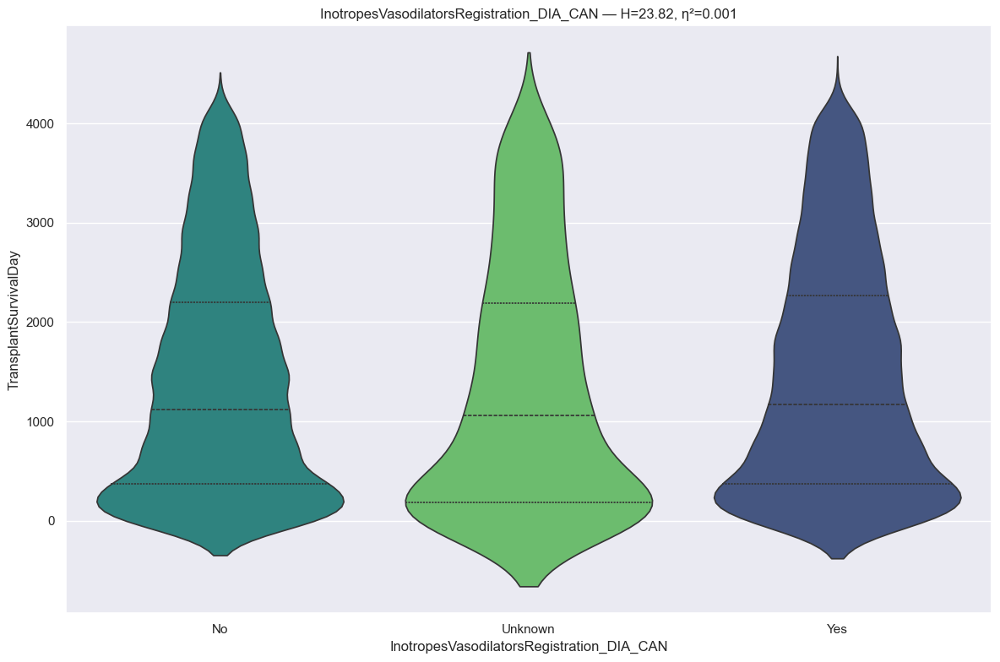

RANKING REPORT: InotropesVasodilatorsRegistration_DIA_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12582 records
 * Unknown                                           :    733 records
 * Yes                                               :   8921 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 23.8191 | P-value: 6.725866e-06 | Effect η²: 0.0010
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=4.8064e-06 | thr=0.0167 | r= 0.101 | *Sig*
No           vs Unknown      | p=2.0450e-04 | thr=0.0167 | r=-0.081 | *Sig*
No           vs Yes          | p=9.6261e-03 | thr=0.0167 | r= 0.021 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::

In [87]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [88]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropes Vasodilators Registratio MN

In [89]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsRegistration_MN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                          count unique top   freq
InotropesVasodilatorsRegistration_MN_CAN  22236      3  No  12440

:::: NaN Count:
InotropesVasodilatorsRegistration_MN_CAN    0 



{'InotropesVasodilatorsRegistration_MN_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

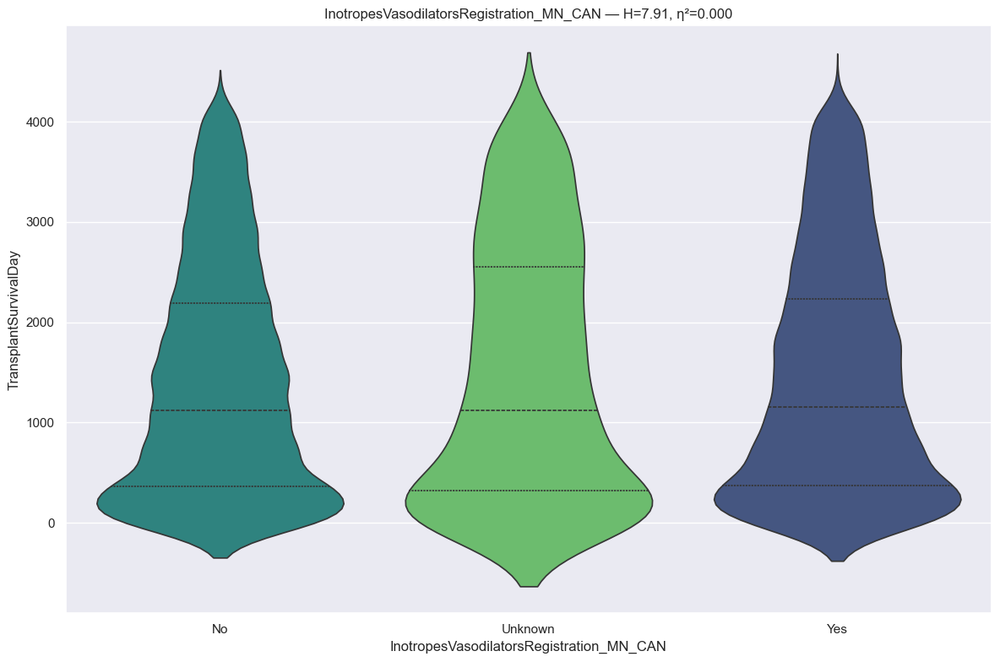

RANKING REPORT: InotropesVasodilatorsRegistration_MN_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12440 records
 * Unknown                                           :   1000 records
 * Yes                                               :   8796 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 7.9063 | P-value: 1.919424e-02 | Effect η²: 0.0003
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=5.1399e-03 | thr=0.0167 | r= 0.023 | *Sig*
Unknown      vs Yes          | p=3.3476e-01 | thr=0.0167 | r= 0.019 | Not Sig
No           vs Unknown      | p=8.5883e-01 | thr=0.0167 | r= 0.003 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::

In [90]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [91]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InotropesVasodilatorsRegistration_MN_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12440 records
 * Unknown                                           :   1000 records
 * Yes                                               :   8796 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 7.9063 | P-value: 1.919424e-02 | Effect η²: 0.0003
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (3 categories)
  - No
  - Unknown
  - Yes



In [92]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature is statistically significant but has an extremely low practical impact on survival.

#### Inotropes Vasodilators Registration PCW

In [93]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsRegistration_PCW', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                           count unique top   freq
InotropesVasodilatorsRegistration_PCW_CAN  22236      3  No  12347

:::: NaN Count:
InotropesVasodilatorsRegistration_PCW_CAN    0 



{'InotropesVasodilatorsRegistration_PCW_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

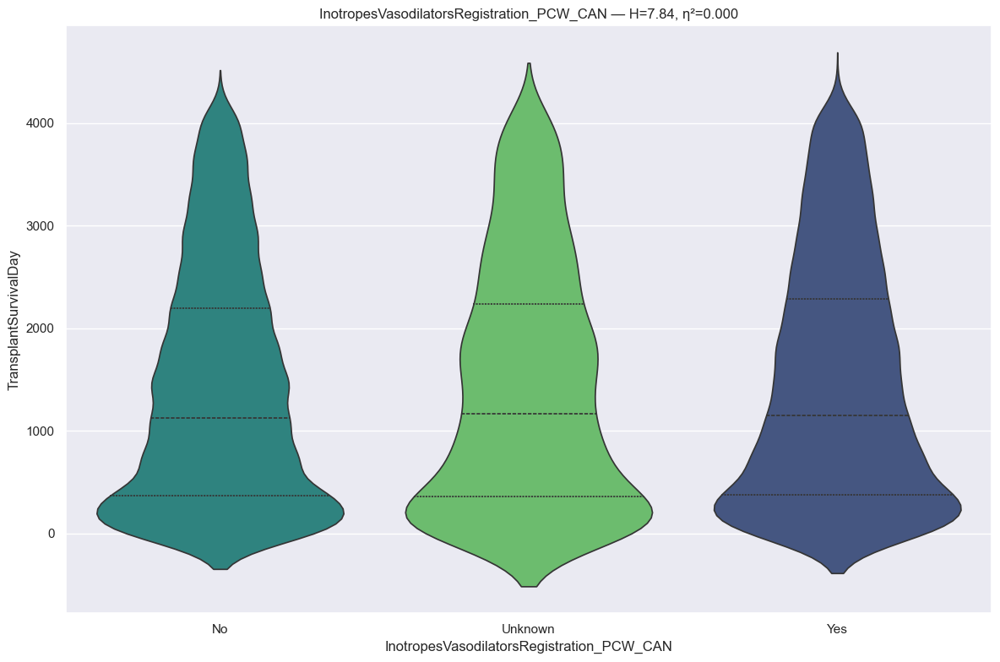

RANKING REPORT: InotropesVasodilatorsRegistration_PCW_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12347 records
 * Unknown                                           :   2089 records
 * Yes                                               :   7800 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 7.8403 | P-value: 1.983856e-02 | Effect η²: 0.0003
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=6.8732e-03 | thr=0.0167 | r= 0.023 | *Sig*
Unknown      vs Yes          | p=9.7884e-02 | thr=0.0167 | r= 0.024 | Not Sig
No           vs Unknown      | p=9.5250e-01 | thr=0.0167 | r=-0.001 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::

In [94]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [95]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature is statistically significant but has an extremely low practical impact on survival.

#### Inotropes Vasodilators Registration CO

In [96]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsRegistration_CO', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                          count unique top   freq
InotropesVasodilatorsRegistration_CO_CAN  22236      3  No  12353

:::: NaN Count:
InotropesVasodilatorsRegistration_CO_CAN    0 



{'InotropesVasodilatorsRegistration_CO_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

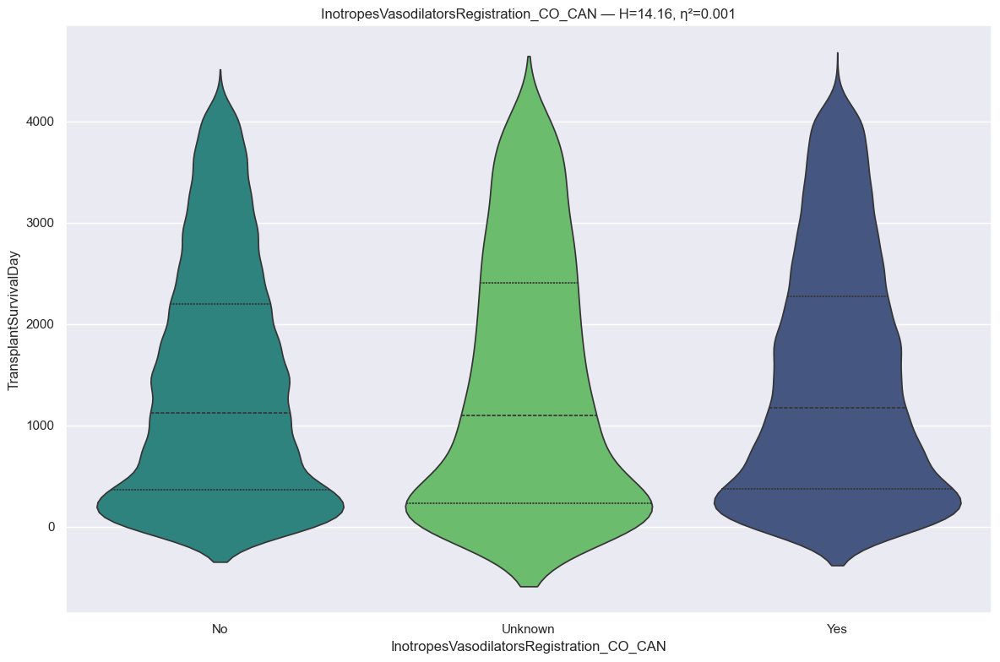

RANKING REPORT: InotropesVasodilatorsRegistration_CO_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12353 records
 * Unknown                                           :   1253 records
 * Yes                                               :   8630 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 14.1606 | P-value: 8.415173e-04 | Effect η²: 0.0005
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=1.6286e-03 | thr=0.0167 | r= 0.055 | *Sig*
No           vs Yes          | p=4.7954e-03 | thr=0.0167 | r= 0.023 | *Sig*
No           vs Unknown      | p=5.5623e-02 | thr=0.0167 | r=-0.033 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::::

In [97]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [98]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature is statistically significant but has an extremely low practical impact on survival.

#### Cigarette Use

In [99]:
# info
feature = u.get_feature_info(df, 'CigaretteUse', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                  count unique top   freq
CigaretteUse_CAN  22236      3  No  11556

:::: NaN Count:
CigaretteUse_CAN    0 



{'CigaretteUse_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

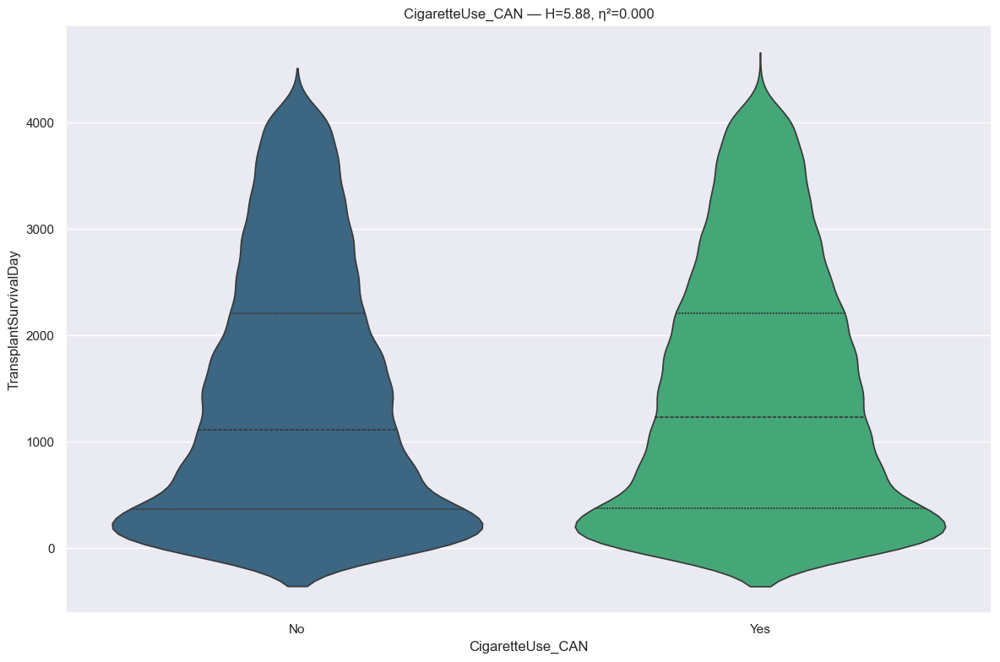

RANKING REPORT: CigaretteUse_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  11556 records
 * Yes                                               :  10655 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     25 records
--------------------------------------------------------------------------------
Kruskal H: 5.8780 | P-value: 1.533113e-02 | Effect η²: 0.0002
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.5331e-02 | thr=0.0500 | r= 0.019 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

>>> Other (1 categories)
  - Unknown

CigaretteUse_CAN  mean_survival_days  median_surviva

In [100]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [101]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Cigarette Abstinence

In [102]:
# info
feature = u.get_feature_info(df, 'CigaretteAbstinence', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                         count unique      top   freq
CigaretteAbstinence_CAN  22236     10  Unknown  11581

:::: NaN Count:
CigaretteAbstinence_CAN    0 



{'CigaretteAbstinence_CAN': CategoricalDtype(categories=['0-2 months', '13-24 months', '25-36 months', '3-12 months',
                   '37-48 months', '49-60 months', '>60 months',
                   'Continues to smoke', 'Unknown', 'Unknown duration'],
 , ordered=False, categories_dtype=str)}

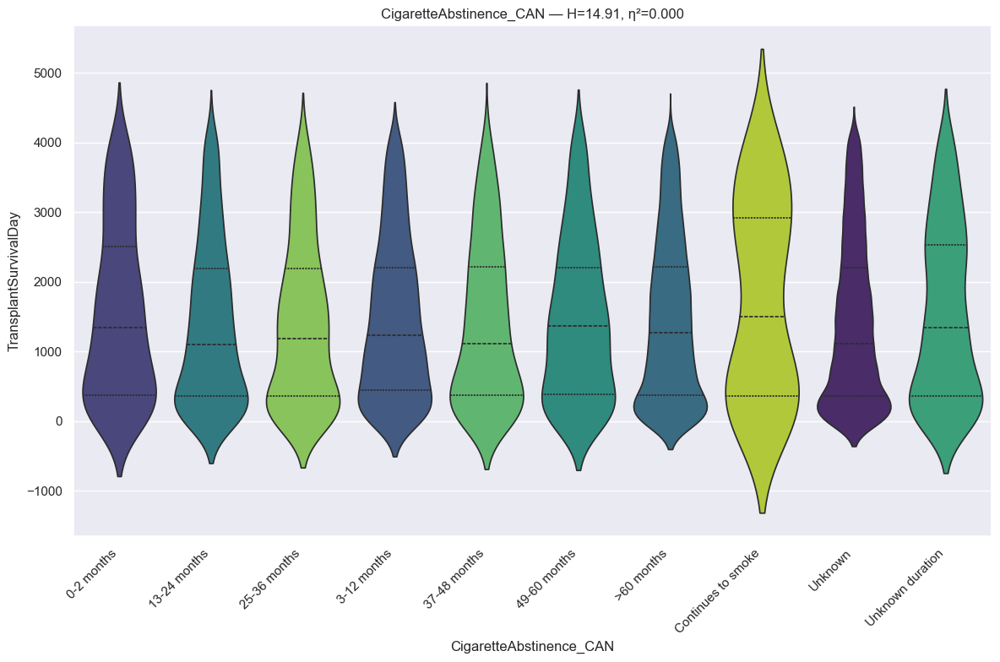

RANKING REPORT: CigaretteAbstinence_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 0-2 months                                        :    285 records
 * 13-24 months                                      :    821 records
 * 25-36 months                                      :    495 records
 * 3-12 months                                       :   1735 records
 * 37-48 months                                      :    404 records
 * 49-60 months                                      :    358 records
 * >60 months                                        :   6118 records
 * Continues to smoke                                :     45 records
 * Unknown                                           :  11581 records
 * Unknown duration                                  :    394 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 14.9054 | P-value: 9.356883e-02 | Effect η²: 0.0003
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni A

In [103]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [104]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Prior Cardiac Surgery

In [105]:
# info
feature = u.get_feature_info(df, 'PriorCardiacSurgery_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                         count unique top   freq
PriorCardiacSurgery_CAN  22236      3  No  12651

:::: NaN Count:
PriorCardiacSurgery_CAN    0 



{'PriorCardiacSurgery_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

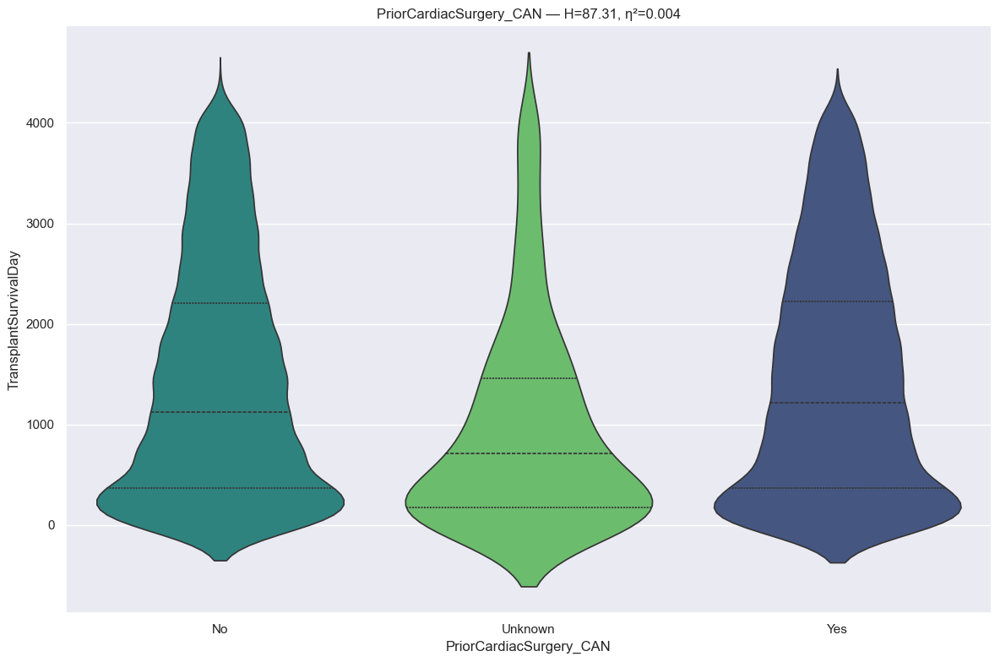

RANKING REPORT: PriorCardiacSurgery_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12651 records
 * Unknown                                           :    432 records
 * Yes                                               :   9153 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 87.3067 | P-value: 1.100499e-19 | Effect η²: 0.0038
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=6.9662e-21 | thr=0.0167 | r=-0.265 | *Sig*
Unknown      vs Yes          | p=1.0577e-19 | thr=0.0167 | r= 0.258 | *Sig*
No           vs Yes          | p=8.3093e-01 | thr=0.0167 | r=-0.002 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Gr

In [106]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [107]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Prior Cardiac Surgery Type

In [108]:
# info
feature = u.get_feature_info(df, 'PriorCardiacSurgeryType_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                             count unique      top   freq
PriorCardiacSurgeryType_CAN  22236     24  Unknown  13083

:::: NaN Count:
PriorCardiacSurgeryType_CAN    0 



{'PriorCardiacSurgeryType_CAN': CategoricalDtype(categories=['CABG', 'CABG; Congenital',
                   'CABG; Congenital; Other, specify',
                   'CABG; Left Vent. Remodeling',
                   'CABG; Left Vent. Remodeling; Other, specify',
                   'CABG; Other, specify', 'CABG; Valve Replace/Repair',
                   'CABG; Valve Replace/Repair; Congenital',
                   'CABG; Valve Replace/Repair; Left Vent. Remodeling',
                   'CABG; Valve Replace/Repair; Other, specify', 'Congenital',
                   'Congenital; Left Vent. Remodeling',
                   'Congenital; Other, specify', 'Left Vent. Remodeling',
                   'Left Vent. Remodeling; Other, specify', 'Other, specify',
                   'Unknown', 'Valve Replace/Repair',
                   'Valve Replace/Repair; Congenital',
                   'Valve Replace/Repair; Congenital; Left Vent. Remodeling',
                   'Valve Replace/Repair; Congenital; Other,

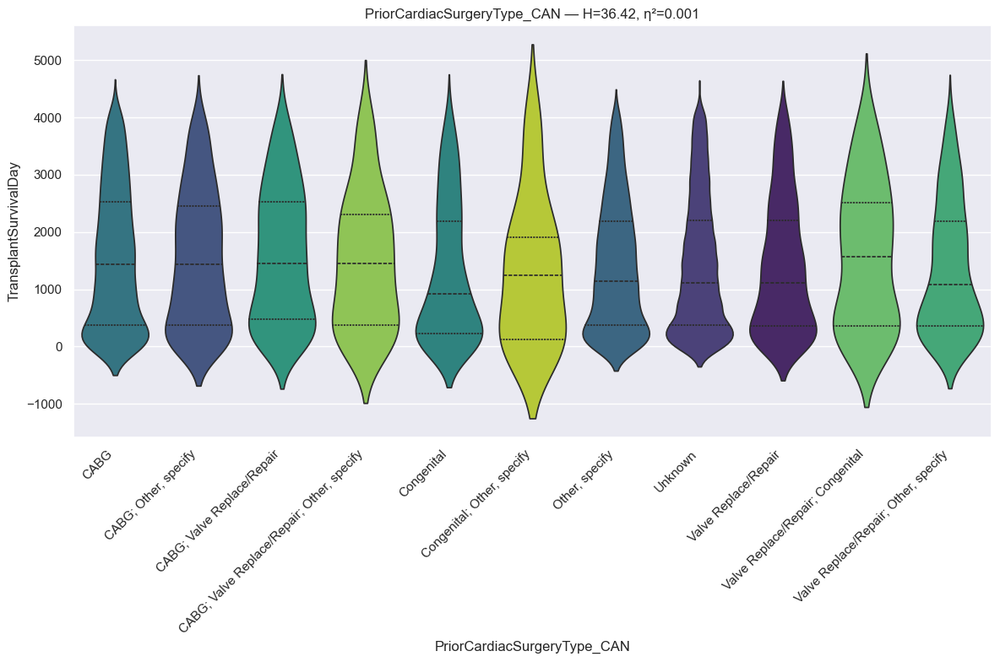

RANKING REPORT: PriorCardiacSurgeryType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * CABG                                              :   2673 records
 * CABG; Other, specify                              :    473 records
 * CABG; Valve Replace/Repair                        :    307 records
 * CABG; Valve Replace/Repair; Other, specify        :     73 records
 * Congenital                                        :    410 records
 * Congenital; Other, specify                        :     32 records
 * Other, specify                                    :   3882 records
 * Unknown                                           :  13083 records
 * Valve Replace/Repair                              :    882 records
 * Valve Replace/Repair; Congenital                  :     70 records
 * Valve Replace/Repair; Other, specify              :    270 records
BYPASSED CATEGORIES (n < min_n):
 * CABG; Congenital                                  :      3 records
 * CABG; Congenital; Other, specify                  

In [109]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [110]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PriorCardiacSurgeryType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * CABG                                              :   2673 records
 * CABG; Other, specify                              :    473 records
 * CABG; Valve Replace/Repair                        :    307 records
 * CABG; Valve Replace/Repair; Other, specify        :     73 records
 * Congenital                                        :    410 records
 * Congenital; Other, specify                        :     32 records
 * Other, specify                                    :   3882 records
 * Unknown                                           :  13083 records
 * Valve Replace/Repair                              :    882 records
 * Valve Replace/Repair; Congenital                  :     70 records
 * Valve Replace/Repair; Other, specify              :    270 records
BYPASSED CATEGORIES (n < min_n):
 * CABG; Congenital                                  :      3 records
 * CABG; Congenital; Other, specify                  

In [111]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Initial Waiting List Status Code

In [112]:
# info
feature = u.get_feature_info(df, 'InitialWaitingListStatusCode_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                  count unique            top  freq
InitialWaitingListStatusCode_CAN  22236     11  HR: Status 1B  7537

:::: NaN Count:
InitialWaitingListStatusCode_CAN    0 



{'InitialWaitingListStatusCode_CAN': CategoricalDtype(categories=['HR: Adult Status 1', 'HR: Adult Status 2',
                   'HR: Adult Status 3', 'HR: Adult Status 4',
                   'HR: Adult Status 5', 'HR: Adult Status 6',
                   'HR: Old Status 1', 'HR: Status 1A', 'HR: Status 1B',
                   'HR: Status 2', 'HR: Temporarily inactive'],
 , ordered=False, categories_dtype=str)}

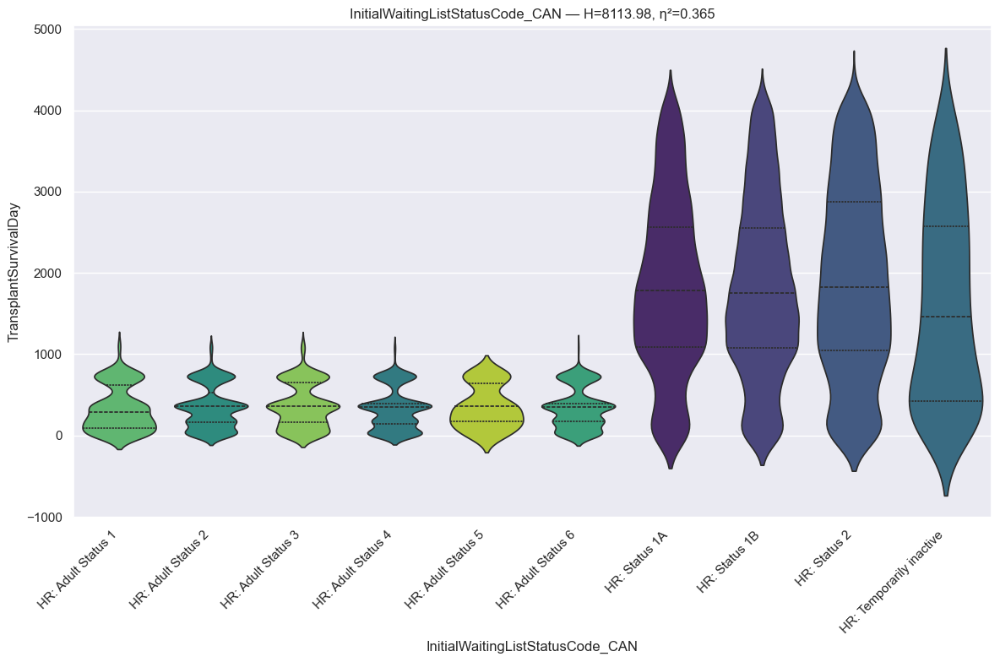

RANKING REPORT: InitialWaitingListStatusCode_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * HR: Adult Status 1                                :    362 records
 * HR: Adult Status 2                                :   1759 records
 * HR: Adult Status 3                                :    790 records
 * HR: Adult Status 4                                :   1894 records
 * HR: Adult Status 5                                :     94 records
 * HR: Adult Status 6                                :    952 records
 * HR: Status 1A                                     :   4190 records
 * HR: Status 1B                                     :   7537 records
 * HR: Status 2                                      :   4308 records
 * HR: Temporarily inactive                          :    348 records
BYPASSED CATEGORIES (n < min_n):
 * HR: Old Status 1                                  :      2 records
--------------------------------------------------------------------------------
Kruskal H: 8113.9814 | P-value: 0.000

In [113]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": True,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [114]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InitialWaitingListStatusCode_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * HR: Adult Status 1                                :    362 records
 * HR: Adult Status 2                                :   1759 records
 * HR: Adult Status 3                                :    790 records
 * HR: Adult Status 4                                :   1894 records
 * HR: Adult Status 5                                :     94 records
 * HR: Adult Status 6                                :    952 records
 * HR: Status 1A                                     :   4190 records
 * HR: Status 1B                                     :   7537 records
 * HR: Status 2                                      :   4308 records
 * HR: Temporarily inactive                          :    348 records
BYPASSED CATEGORIES (n < min_n):
 * HR: Old Status 1                                  :      2 records
--------------------------------------------------------------------------------
Kruskal H: 8113.9814 | P-value: 0.000

In [115]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Received Deceased Donor Tramsplant

In [116]:
# info
feature = u.get_feature_info(df, 'ReceivedDeceasedDonorTramsplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                     count unique  top   freq
ReceivedDeceasedDonorTramsplant_CAN  22236      1  Yes  22236

:::: NaN Count:
ReceivedDeceasedDonorTramsplant_CAN    0 



{'ReceivedDeceasedDonorTramsplant_CAN': <StringDtype(na_value=nan)>}

In [117]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

[WARNING] Cannot perform statistical comparison for ReceivedDeceasedDonorTramsplant_CAN
          Only 1 category has n ≥ 30.
          You can only compare MORE THAN ONE category since n < min_n.

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - Yes

ReceivedDeceasedDonorTramsplant_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                                Yes          1436.74964                1126.0                 4300.0                    0.0         22236


In [118]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Status At Transplant

In [119]:
# info
feature = u.get_feature_info(df, 'StatusAtTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique                                                                                                  top   freq
StatusAtTransplant_CAN  22236      8  Hypoplastic Left Heart Syndrome; Atrioventricular Septal Defect; Other left Heart Valvar/Structural  10192

:::: NaN Count:
StatusAtTransplant_CAN    0 



{'StatusAtTransplant_CAN': CategoricalDtype(categories=['Atrioventricular Septal Defect; Congenitally Corrected Transposition (L-TGA); Other',
                   'Hypoplastic Left Heart Syndrome; Atrioventricular Septal Defect; Other left Heart Valvar/Structural',
                   'Hypoplastic Left Heart Syndrome; Other left Heart Valvar/Structural Hypoplasia; Congenitally Correct',
                   'Hypoplastic Left Heart Syndrome; Transposition of the Great Arteries; Atrioventricular Septal Defect',
                   'Hypoplastic Left Heart Syndrome; Transposition of the Great Arteries; Truncus Arteriosus; Congenital',
                   'Other left Heart Valvar/Structural Hypoplasia; Truncus Arteriosus; Congenitally Corrected Transposition',
                   'Transposition of the Great Arteries; Atrioventricular Septal Defect; Other left Heart Valvar/Structural',
                   'Transposition of the Great Arteries; Truncus Arteriosus; Congenitally Corrected Transposition 

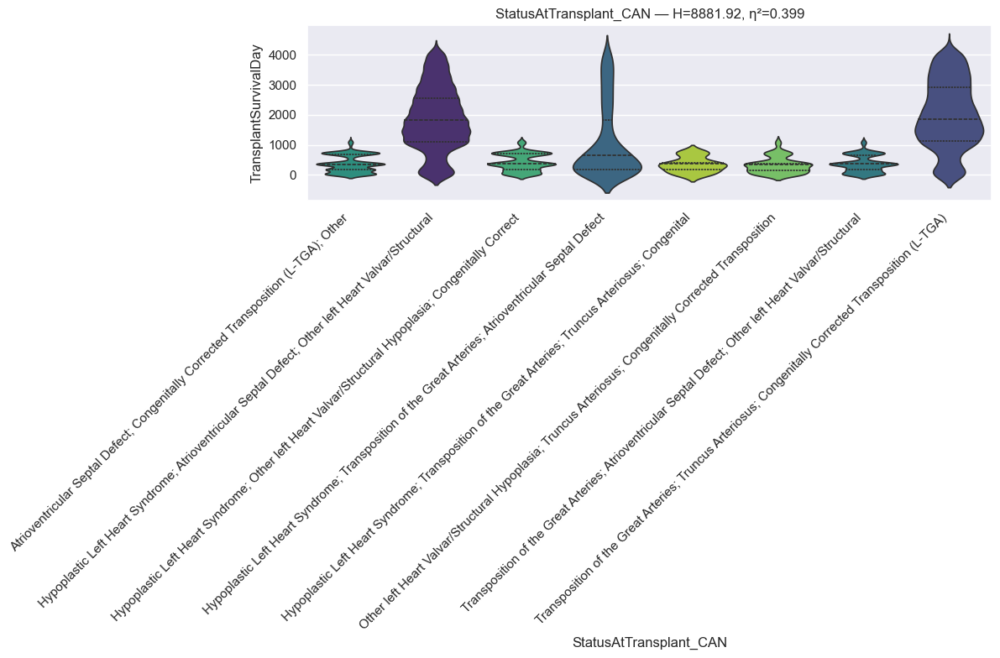

RANKING REPORT: StatusAtTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Atrioventricular Septal Defect; Congenitally Corrected Transposition (L-TGA); Other:   3535 records
 * Hypoplastic Left Heart Syndrome; Atrioventricular Septal Defect; Other left Heart Valvar/Structural:  10192 records
 * Hypoplastic Left Heart Syndrome; Other left Heart Valvar/Structural Hypoplasia; Congenitally Correct:   1315 records
 * Hypoplastic Left Heart Syndrome; Transposition of the Great Arteries; Atrioventricular Septal Defect:   1148 records
 * Hypoplastic Left Heart Syndrome; Transposition of the Great Arteries; Truncus Arteriosus; Congenital:     47 records
 * Other left Heart Valvar/Structural Hypoplasia; Truncus Arteriosus; Congenitally Corrected Transposition:    248 records
 * Transposition of the Great Arteries; Atrioventricular Septal Defect; Other left Heart Valvar/Structural:   1218 records
 * Transposition of the Great Arteries; Truncus Arteriosus; Congenitally Corrected Transposition (L-TGA

In [120]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [121]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: StatusAtTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Atrioventricular Septal Defect; Congenitally Corrected Transposition (L-TGA); Other:   3535 records
 * Hypoplastic Left Heart Syndrome; Atrioventricular Septal Defect; Other left Heart Valvar/Structural:  10192 records
 * Hypoplastic Left Heart Syndrome; Other left Heart Valvar/Structural Hypoplasia; Congenitally Correct:   1315 records
 * Hypoplastic Left Heart Syndrome; Transposition of the Great Arteries; Atrioventricular Septal Defect:   1148 records
 * Hypoplastic Left Heart Syndrome; Transposition of the Great Arteries; Truncus Arteriosus; Congenital:     47 records
 * Other left Heart Valvar/Structural Hypoplasia; Truncus Arteriosus; Congenitally Corrected Transposition:    248 records
 * Transposition of the Great Arteries; Atrioventricular Septal Defect; Other left Heart Valvar/Structural:   1218 records
 * Transposition of the Great Arteries; Truncus Arteriosus; Congenitally Corrected Transposition (L-TGA

In [122]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Registration

In [123]:
# info
feature = u.get_feature_info(df, 'LifeSupportRegistration_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                             count unique  top   freq
LifeSupportRegistration_CAN  22236      3  Yes  14400

:::: NaN Count:
LifeSupportRegistration_CAN    0 



{'LifeSupportRegistration_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

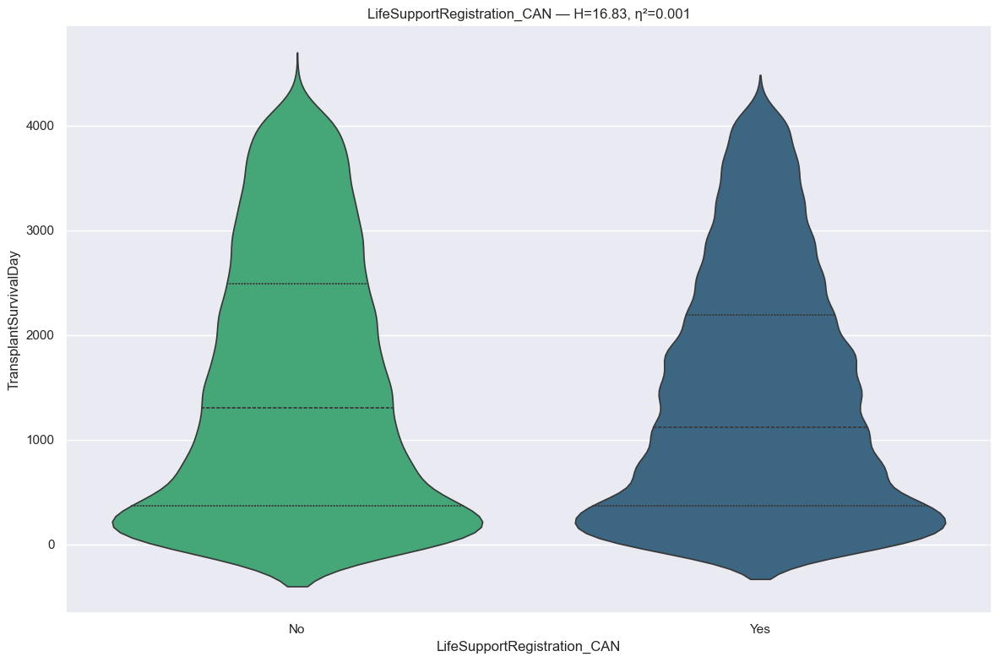

RANKING REPORT: LifeSupportRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7817 records
 * Yes                                               :  14400 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     19 records
--------------------------------------------------------------------------------
Kruskal H: 16.8282 | P-value: 4.092015e-05 | Effect η²: 0.0007
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=4.0920e-05 | thr=0.0500 | r=-0.033 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

>>> Other (1 categories)
  - Unknown

LifeSupportRegistration_CAN  mean_surviv

In [124]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [125]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: LifeSupportRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7817 records
 * Yes                                               :  14400 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     19 records
--------------------------------------------------------------------------------
Kruskal H: 16.8282 | P-value: 4.092015e-05 | Effect η²: 0.0007
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

>>> Other (1 categories)
  - Unknown



In [126]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Ethnicity

In [127]:
# info
feature = u.get_feature_info(df, 'Ethnicity', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique                  top   freq
Ethnicity_CAN  22236      7  White, Non-Hispanic  14555

:::: NaN Count:
Ethnicity_CAN    0 



{'Ethnicity_CAN': CategoricalDtype(categories=['Amer Ind/Alaska Native', 'Asian', 'Black', 'Hispanic',
                   'Multiracial', 'Native Hawaiian/other Pacific Islander',
                   'White, Non-Hispanic'],
 , ordered=False, categories_dtype=str)}

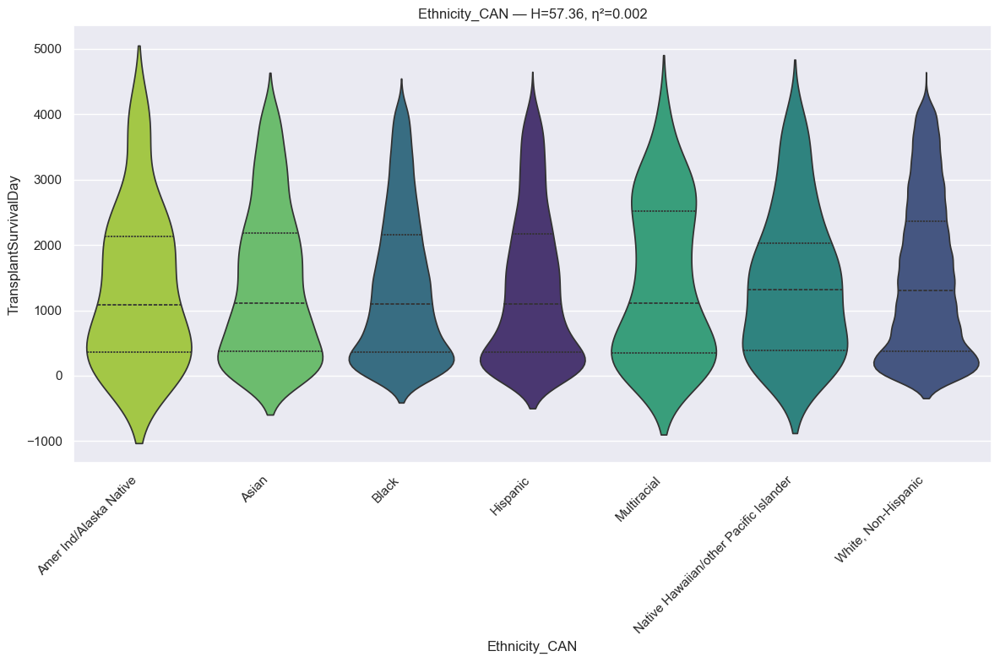

RANKING REPORT: Ethnicity_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Amer Ind/Alaska Native                            :     60 records
 * Asian                                             :    838 records
 * Black                                             :   4605 records
 * Hispanic                                          :   1959 records
 * Multiracial                                       :    123 records
 * Native Hawaiian/other Pacific Islander            :     96 records
 * White, Non-Hispanic                               :  14555 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 57.3643 | P-value: 1.541548e-10 | Effect η²: 0.0023
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0024 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Black        vs White, Non-Hispanic | p=6.1735e-09 | thr=0.0024 | r= 0.057 | *Sig*
Hispanic     vs White,

In [128]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [129]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: Ethnicity_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Amer Ind/Alaska Native                            :     60 records
 * Asian                                             :    838 records
 * Black                                             :   4605 records
 * Hispanic                                          :   1959 records
 * Multiracial                                       :    123 records
 * Native Hawaiian/other Pacific Islander            :     96 records
 * White, Non-Hispanic                               :  14555 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 57.3643 | P-value: 1.541548e-10 | Effect η²: 0.0023
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::

In [130]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature has a statistically significant but practically minimal impact on survival.

#### Ventilator Registration

In [131]:
# info
feature = u.get_feature_info(df, 'VentilatorRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                            count unique top   freq
VentilatorRegistration_CAN  22236      2  No  21918

:::: NaN Count:
VentilatorRegistration_CAN    0 



{'VentilatorRegistration_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

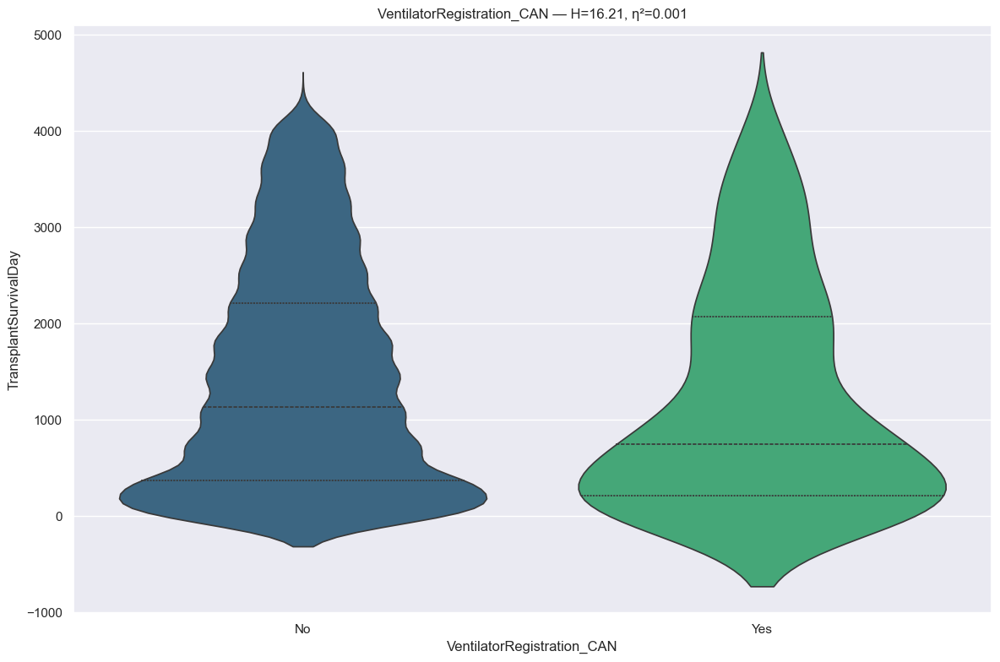

RANKING REPORT: VentilatorRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21918 records
 * Yes                                               :    318 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 16.2060 | P-value: 5.681350e-05 | Effect η²: 0.0007
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=5.6815e-05 | thr=0.0500 | r=-0.131 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

VentilatorRegistration_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                        No 

In [132]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [133]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Transplant Region

In [134]:
# info
feature = u.get_feature_info(df, 'TransplantRegion', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                      count unique       top  freq
TransplantRegion_CAN  22236     11  Region 5  3705

:::: NaN Count:
TransplantRegion_CAN    0 



{'TransplantRegion_CAN': CategoricalDtype(categories=['Region 1', 'Region 10', 'Region 11', 'Region 2', 'Region 3',
                   'Region 4', 'Region 5', 'Region 6', 'Region 7', 'Region 8',
                   'Region 9'],
 , ordered=False, categories_dtype=str)}

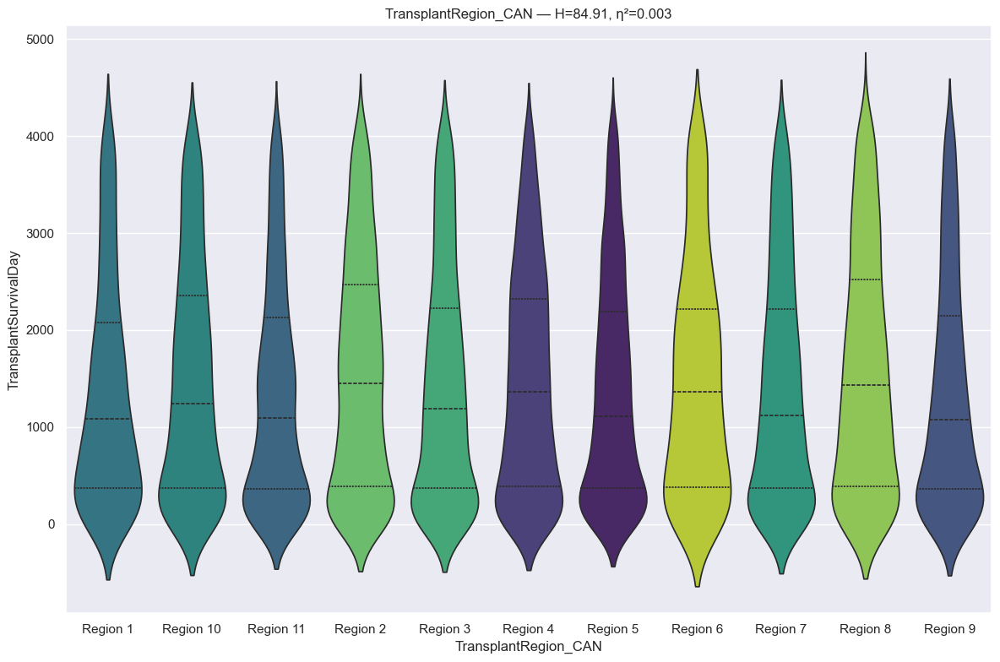

RANKING REPORT: TransplantRegion_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Region 1                                          :    988 records
 * Region 10                                         :   1716 records
 * Region 11                                         :   2752 records
 * Region 2                                          :   2551 records
 * Region 3                                          :   2509 records
 * Region 4                                          :   2396 records
 * Region 5                                          :   3705 records
 * Region 6                                          :    651 records
 * Region 7                                          :   2035 records
 * Region 8                                          :   1399 records
 * Region 9                                          :   1534 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 84.9098 | P-value: 5.437957e-14 | Effect η²: 

In [135]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [136]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed

# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: TransplantRegion_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Region 1                                          :    988 records
 * Region 10                                         :   1716 records
 * Region 11                                         :   2752 records
 * Region 2                                          :   2551 records
 * Region 3                                          :   2509 records
 * Region 4                                          :   2396 records
 * Region 5                                          :   3705 records
 * Region 6                                          :    651 records
 * Region 7                                          :   2035 records
 * Region 8                                          :   1399 records
 * Region 9                                          :   1534 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 84.9098 | P-value: 5.437957e-14 | Effect η²: 

In [137]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature has a statistically significant but practically minimal impact on survival.

#### Work Income Registration

In [138]:
# info
feature = u.get_feature_info(df, 'WorkIncomeRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                            count unique top   freq
WorkIncomeRegistration_CAN  22236      3  No  17612

:::: NaN Count:
WorkIncomeRegistration_CAN    0 



{'WorkIncomeRegistration_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

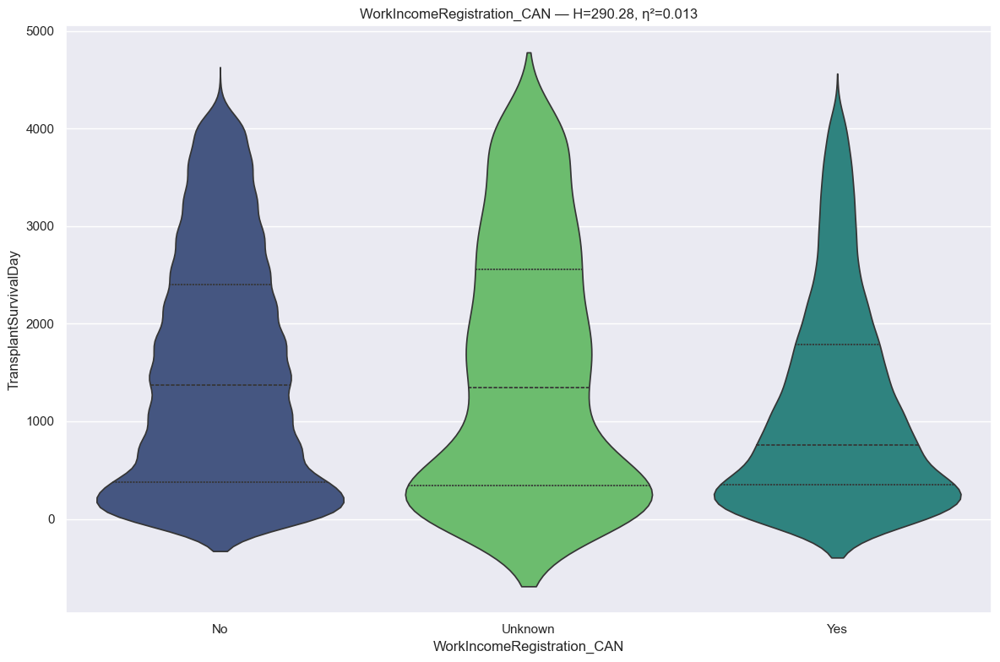

RANKING REPORT: WorkIncomeRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  17612 records
 * Unknown                                           :    733 records
 * Yes                                               :   3891 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 290.2792 | P-value: 9.261086e-64 | Effect η²: 0.0130
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.4558e-65 | thr=0.0167 | r=-0.175 | *Sig*
Unknown      vs Yes          | p=3.1009e-09 | thr=0.0167 | r=-0.138 | *Sig*
No           vs Unknown      | p=5.2580e-01 | thr=0.0167 | r=-0.014 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>

In [139]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [140]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: WorkIncomeRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  17612 records
 * Unknown                                           :    733 records
 * Yes                                               :   3891 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 290.2792 | P-value: 9.261086e-64 | Effect η²: 0.0130
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Unknown

>>> Group_2 (1 categories)
  - Yes



In [141]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen BW4
* The Bw4 antigen is a highly immunogenic, public HLA class I epitope (found on HLA-A and B) that can trigger Antibody-Mediated Rejection (ABMR) in transplant recipients. While not always causing poor long-term outcomes, Bw4 mismatching increases alloimmunization, and pre-formed anti-Bw4 antibodies can cause acute or hyperacute graft rejection.

In [142]:
# info
feature = u.get_feature_info(df, 'AntigenBW4', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique         top   freq
AntigenBW4_CAN  22236      4  No Antigen  15373

:::: NaN Count:
AntigenBW4_CAN    0 



{'AntigenBW4_CAN': CategoricalDtype(categories=['Negative', 'No Antigen', 'Not Done', 'Positive'], ordered=False, categories_dtype=str)}

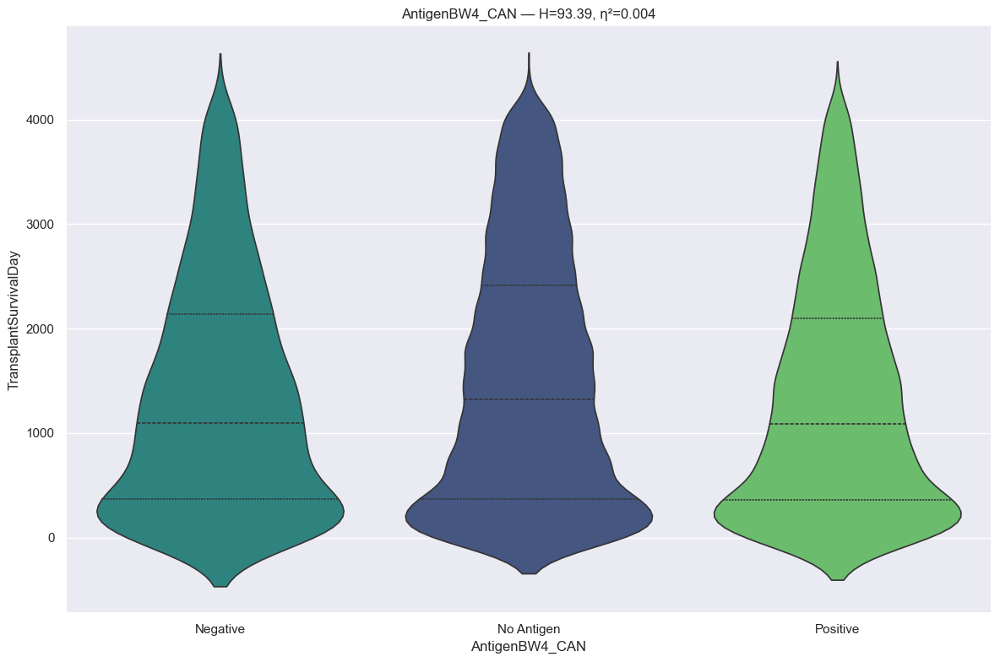

RANKING REPORT: AntigenBW4_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   2224 records
 * No Antigen                                        :  15373 records
 * Positive                                          :   4630 records
BYPASSED CATEGORIES (n < min_n):
 * Not Done                                          :      9 records
--------------------------------------------------------------------------------
Kruskal H: 93.3920 | P-value: 5.250279e-21 | Effect η²: 0.0041
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No Antigen   vs Positive     | p=9.0408e-19 | thr=0.0167 | r=-0.086 | *Sig*
Negative     vs No Antigen   | p=9.2726e-08 | thr=0.0167 | r= 0.070 | *Sig*
Negative     vs Positive     | p=2.6384e-01 | thr=0.0167 | r=-0.017 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

::::::::::::::::::::

In [143]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [144]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen BW6
* HLA-Bw4 and Bw6 are public epitopes on HLA-B antigens that serve as significant immunological barriers in transplantation, particularly when antibodies against them make a patient highly sensitized. Anti-Bw6 antibodies specifically can lead to a high calculated panel reactive antibody (cPRA) score (~85%), complicating donor matching. Although mismatches can trigger antibody-mediated rejection, studies suggest they do not always independently predict poor long-term graft survival. 

In [145]:
# info
feature = u.get_feature_info(df, 'AntigenBW6', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique         top   freq
AntigenBW6_CAN  22236      3  No Antigen  15110

:::: NaN Count:
AntigenBW6_CAN    0 



{'AntigenBW6_CAN': CategoricalDtype(categories=['Negative', 'No Antigen', 'Not Done', 'Positive'], ordered=False, categories_dtype=str)}

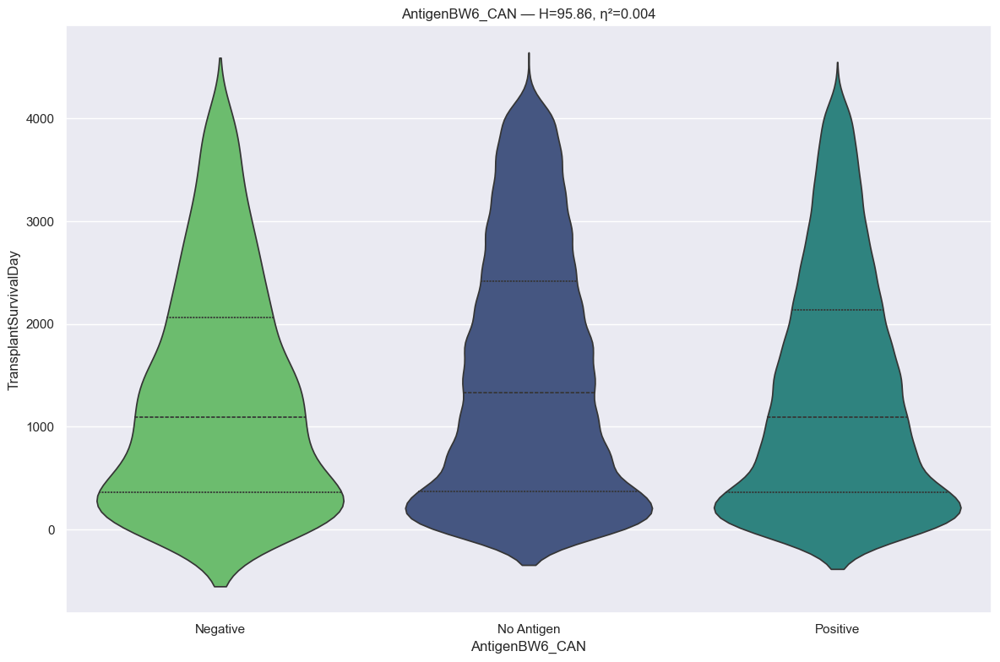

RANKING REPORT: AntigenBW6_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    902 records
 * No Antigen                                        :  15110 records
 * Positive                                          :   6224 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 95.8568 | P-value: 1.530915e-21 | Effect η²: 0.0042
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No Antigen   vs Positive     | p=2.3545e-20 | thr=0.0167 | r=-0.080 | *Sig*
Negative     vs No Antigen   | p=1.1709e-05 | thr=0.0167 | r= 0.087 | *Sig*
Negative     vs Positive     | p=7.9094e-01 | thr=0.0167 | r= 0.005 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 

In [146]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [147]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen C1
* C1-inhibitor (C1-INH) is used in transplantation to prevent antibody-mediated rejection (AMR) by reducing C1q+ HLA antibodies and inhibiting the complement cascade. It is particularly useful in sensitized patients to improve graft survival, reduce ischemia-reperfusion injury, and treat acute antibody-mediated rejection.

In [148]:
# info
feature = u.get_feature_info(df, 'AntigenC1', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique         top   freq
AntigenC1_CAN  22236     36  No Antigen  15358

:::: NaN Count:
AntigenC1_CAN    0 



{'AntigenC1_CAN': CategoricalDtype(categories=['01', '01:02', '02', '02:02', '02:10', '03', '03:02',
                   '03:03', '03:04', '03:06', '04', '04:01', '05', '05:01',
                   '06', '06:02', '07', '07:01', '07:02', '07:04', '07:18',
                   '08', '08:02', '08:04', '09', '10', '12', '12:03', '14',
                   '15', '15:05', '16', '16:01', '17', '17:01', '18',
                   'No Antigen'],
 , ordered=False, categories_dtype=str)}

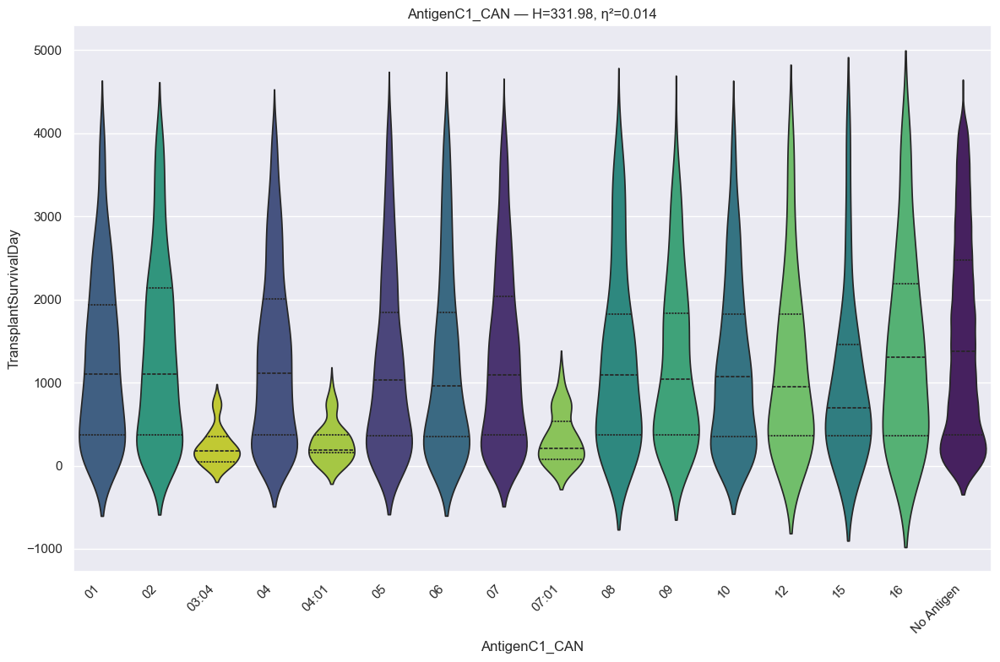

RANKING REPORT: AntigenC1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 01                                                :    429 records
 * 02                                                :    672 records
 * 03:04                                             :     46 records
 * 04                                                :   1410 records
 * 04:01                                             :     49 records
 * 05                                                :    660 records
 * 06                                                :    684 records
 * 07                                                :   1511 records
 * 07:01                                             :     43 records
 * 08                                                :    169 records
 * 09                                                :    269 records
 * 10                                                :    522 records
 * 12                                                :    108 records
 * 15                         

In [149]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [150]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenC1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 01                                                :    429 records
 * 02                                                :    672 records
 * 03:04                                             :     46 records
 * 04                                                :   1410 records
 * 04:01                                             :     49 records
 * 05                                                :    660 records
 * 06                                                :    684 records
 * 07                                                :   1511 records
 * 07:01                                             :     43 records
 * 08                                                :    169 records
 * 09                                                :    269 records
 * 10                                                :    522 records
 * 12                                                :    108 records
 * 15                         

In [151]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen C2
* Melanoma-associated antigen C2 (MAGEC2) is a cancer-testis antigen and oncoprotein frequently expressed in various tumors, including melanoma, triple-negative breast cancer, and lung cancer. As a tumor-specific antigen recognized by cytolytic T lymphocytes (CTLs), it is a target for immunotherapy.

In [152]:
# info
feature = u.get_feature_info(df, 'AntigenC2', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique         top   freq
AntigenC2_CAN  22236     42  No Antigen  16043

:::: NaN Count:
AntigenC2_CAN    0 



{'AntigenC2_CAN': CategoricalDtype(categories=['01', '01:02', '02', '02:02', '02:10', '03', '03:02',
                   '03:03', '03:04', '04', '04:01', '05', '05:01', '06',
                   '06:02', '07', '07:01', '07:02', '07:04', '07:18', '08',
                   '08:02', '08:03', '08:04', '09', '10', '12', '12:02',
                   '12:03', '14', '14:02', '15', '15:02', '15:05', '16',
                   '16:01', '16:02', '16:04', '17', '17:01', '17:03', '18',
                   '18:01', '18:02', 'No Antigen'],
 , ordered=False, categories_dtype=str)}

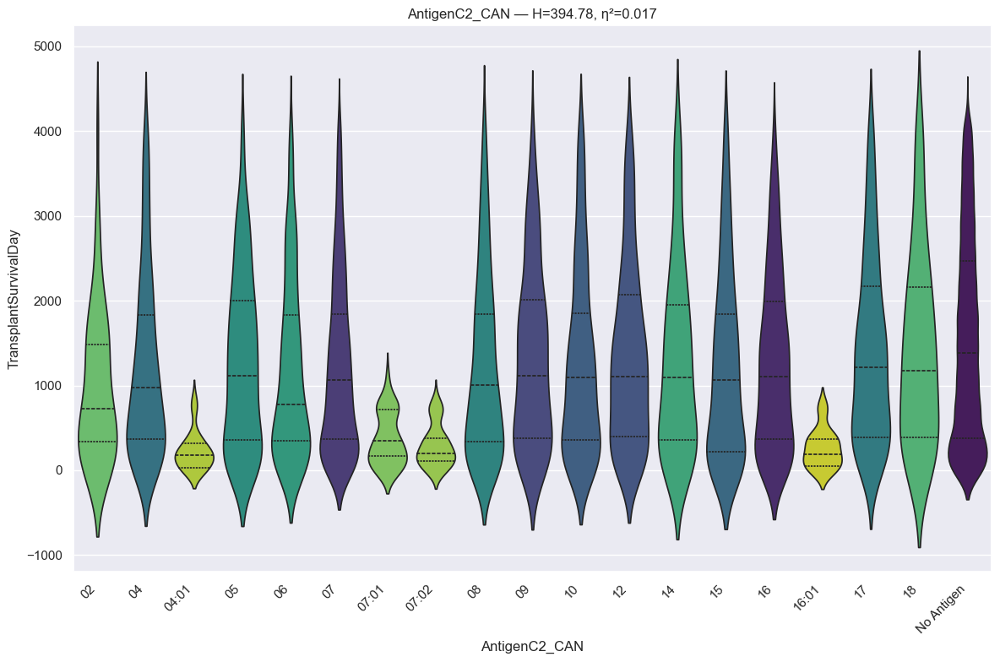

RANKING REPORT: AntigenC2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 02                                                :     56 records
 * 04                                                :    358 records
 * 04:01                                             :     30 records
 * 05                                                :    285 records
 * 06                                                :    442 records
 * 07                                                :   1785 records
 * 07:01                                             :     55 records
 * 07:02                                             :     57 records
 * 08                                                :    406 records
 * 09                                                :    224 records
 * 10                                                :    482 records
 * 12                                                :    465 records
 * 14                                                :    145 records
 * 15                         

In [153]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [154]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenC2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 02                                                :     56 records
 * 04                                                :    358 records
 * 04:01                                             :     30 records
 * 05                                                :    285 records
 * 06                                                :    442 records
 * 07                                                :   1785 records
 * 07:01                                             :     55 records
 * 07:02                                             :     57 records
 * 08                                                :    406 records
 * 09                                                :    224 records
 * 10                                                :    482 records
 * 12                                                :    465 records
 * 14                                                :    145 records
 * 15                         

In [155]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DR51
* HLA-DR51 is a minor Human Leukocyte Antigen (HLA) class II antigen encoded by the HLA-DRB5 locus, typically associated with DR2 haplotypes. It functions as an antigen-presenting molecule for T-cells and is highly relevant in transplantation, where anti-DR51 antibodies can indicate graft rejection, as well as in autoimmune studies.
* HLA Matching (The Numbers 0–6): In transplant medicine, these numbers typically represent the number of mismatches between you and a potential donor.
    * 0: A perfect match; the lowest risk for rejection.
    * 1–5: Increasing levels of genetic difference (mismatches) between you and the donor.
    * 6: The maximum number of mismatches for the primary HLA markers (A, B, and DR).
    * Antibody Status (Negative/Positive):
    * Negative: You do not have pre-formed antibodies against that specific antigen (DR51). This is the ideal result because it means your immune system is less likely to attack a donor heart that has that antigen.
    * Positive: You have antibodies against that antigen. If a donor heart has DR51, your immune system might recognize it as "foreign" and attack it, increasing the risk of antibody-mediated rejection (AMR). 

In [156]:
# info
feature = u.get_feature_info(df, 'AntigenDR51_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                 count unique         top   freq
AntigenDR51_CAN  22236      9  No Antigen  16270

:::: NaN Count:
AntigenDR51_CAN    0 



{'AntigenDR51_CAN': CategoricalDtype(categories=['1', '2', '3', '4', '5', 'Negative', 'No Antigen',
                   'Not Done', 'Positive'],
 , ordered=False, categories_dtype=str)}

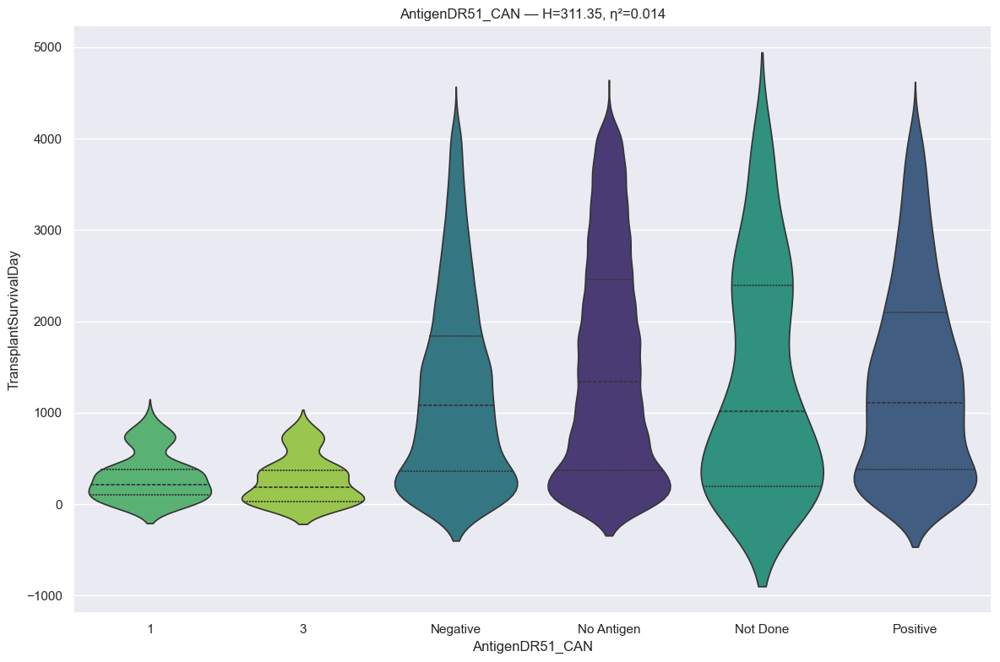

RANKING REPORT: AntigenDR51_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :     90 records
 * 3                                                 :     65 records
 * Negative                                          :   3818 records
 * No Antigen                                        :  16270 records
 * Not Done                                          :    131 records
 * Positive                                          :   1849 records
BYPASSED CATEGORIES (n < min_n):
 * 2                                                 :      5 records
 * 4                                                 :      5 records
 * 5                                                 :      3 records
--------------------------------------------------------------------------------
Kruskal H: 311.3483 | P-value: 3.634567e-65 | Effect η²: 0.0138
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0033 | r_threshold: 0.10)
------------------------------------

In [157]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [158]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDR51_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :     90 records
 * 3                                                 :     65 records
 * Negative                                          :   3818 records
 * No Antigen                                        :  16270 records
 * Not Done                                          :    131 records
 * Positive                                          :   1849 records
BYPASSED CATEGORIES (n < min_n):
 * 2                                                 :      5 records
 * 4                                                 :      5 records
 * 5                                                 :      3 records
--------------------------------------------------------------------------------
Kruskal H: 311.3483 | P-value: 3.634567e-65 | Effect η²: 0.0138
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
-----------------------------------

In [159]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DR51 2
* Anti-HLA-DR51/52/53 antibodies are donor-specific antibodies (DSAs) that can develop after organ transplantation, specifically the kidney, and may be associated with Antibody-Mediated Rejection (ABMR). While DR51/52/53 antigens are expressed at relatively low levels, they are highly immunogenic and can cause significant sensitization, making their monitoring important for detecting potential graft dysfunction.

In [160]:
# info
feature = u.get_feature_info(df, 'AntigenDR51_2_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                   count unique         top   freq
AntigenDR51_2_CAN  22236      8  No Antigen  21172

:::: NaN Count:
AntigenDR51_2_CAN    0 



{'AntigenDR51_2_CAN': CategoricalDtype(categories=['1', '2', '3', '5', 'Negative', 'No Antigen', 'Not Done',
                   'Positive'],
 , ordered=False, categories_dtype=str)}

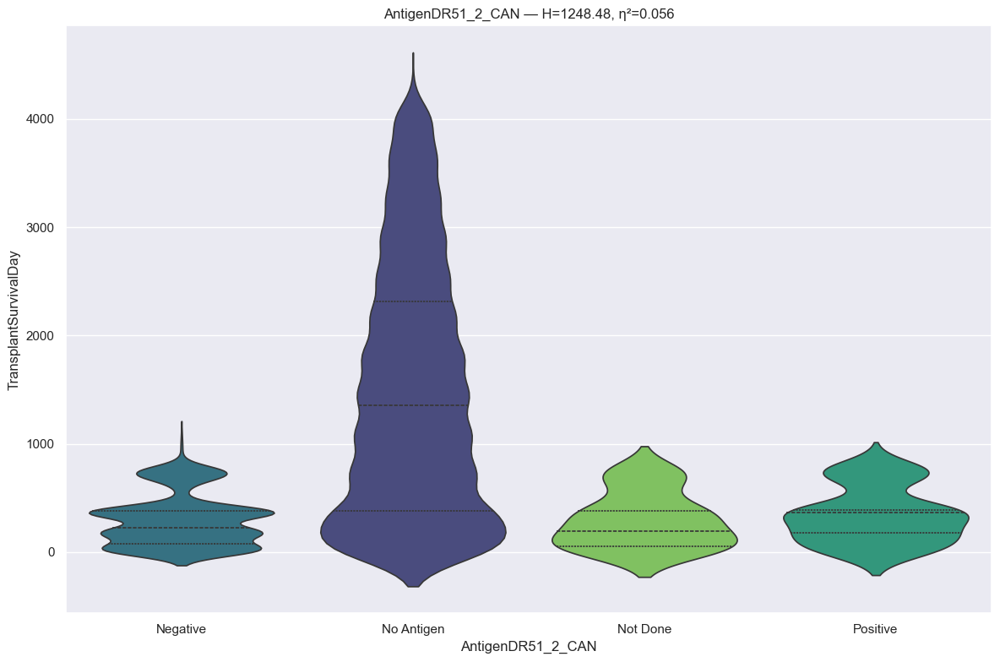

RANKING REPORT: AntigenDR51_2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    931 records
 * No Antigen                                        :  21172 records
 * Not Done                                          :     43 records
 * Positive                                          :     77 records
BYPASSED CATEGORIES (n < min_n):
 * 1                                                 :      6 records
 * 2                                                 :      2 records
 * 3                                                 :      3 records
 * 5                                                 :      2 records
--------------------------------------------------------------------------------
Kruskal H: 1248.4766 | P-value: 2.224528e-270 | Effect η²: 0.0561
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs No An

In [161]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [162]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDR51_2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    931 records
 * No Antigen                                        :  21172 records
 * Not Done                                          :     43 records
 * Positive                                          :     77 records
BYPASSED CATEGORIES (n < min_n):
 * 1                                                 :      6 records
 * 2                                                 :      2 records
 * 3                                                 :      3 records
 * 5                                                 :      2 records
--------------------------------------------------------------------------------
Kruskal H: 1248.4766 | P-value: 2.224528e-270 | Effect η²: 0.0561
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison

In [163]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DR52
* Anti-HLA-DR51, along with DR52 and DR53, are HLA-DR antigens that, when present as donor-specific antibodies (DSAs) after transplantation, can increase the risk of antibody-mediated rejection (ABMR) and graft damage. Despite their relatively weak expression, these antibodies are clinically relevant and are often identified in patients with sensitized systems using single-antigen bead assays, such as Luminex.

In [164]:
# info
feature = u.get_feature_info(df, 'AntigenDR52_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                 count unique         top   freq
AntigenDR52_CAN  22236     10  No Antigen  15817

:::: NaN Count:
AntigenDR52_CAN    0 



{'AntigenDR52_CAN': CategoricalDtype(categories=['1', '2', '3', '4', '5', '7', 'Negative', 'No Antigen',
                   'Not Done', 'Positive'],
 , ordered=False, categories_dtype=str)}

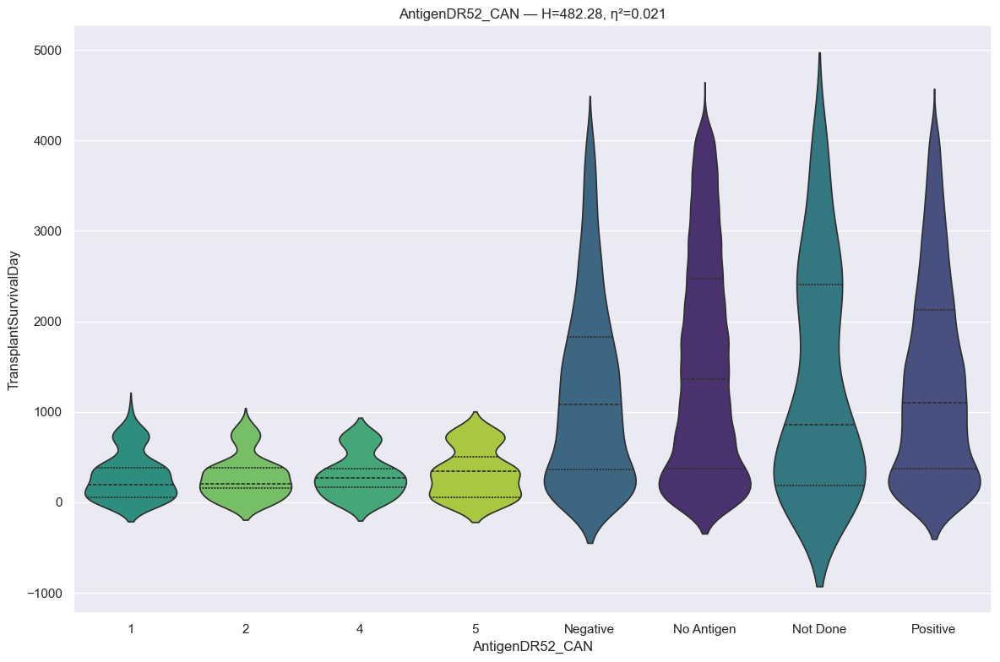

RANKING REPORT: AntigenDR52_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :     88 records
 * 2                                                 :     86 records
 * 4                                                 :     68 records
 * 5                                                 :     73 records
 * Negative                                          :   1927 records
 * No Antigen                                        :  15817 records
 * Not Done                                          :    123 records
 * Positive                                          :   4020 records
BYPASSED CATEGORIES (n < min_n):
 * 3                                                 :     13 records
 * 7                                                 :     21 records
--------------------------------------------------------------------------------
Kruskal H: 482.2798 | P-value: 5.162738e-100 | Effect η²: 0.0214
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni 

In [165]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [166]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDR52_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :     88 records
 * 2                                                 :     86 records
 * 4                                                 :     68 records
 * 5                                                 :     73 records
 * Negative                                          :   1927 records
 * No Antigen                                        :  15817 records
 * Not Done                                          :    123 records
 * Positive                                          :   4020 records
BYPASSED CATEGORIES (n < min_n):
 * 3                                                 :     13 records
 * 7                                                 :     21 records
--------------------------------------------------------------------------------
Kruskal H: 482.2798 | P-value: 5.162738e-100 | Effect η²: 0.0214
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 

In [167]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DR52 2
* HLA-DR52 (encoded by HLA-DRB3) is a class II antigen whose antibodies (DSAs) are linked to antibody-mediated rejection (ABMR) and reduced graft survival, despite weaker expression than DRB1. While traditionally not always matched, monitoring DR52 antibodies is vital for identifying the risk of transplant failure and flow crossmatch positivity.

In [168]:
# info
feature = u.get_feature_info(df, 'AntigenDR52_2_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                   count unique         top   freq
AntigenDR52_2_CAN  22236     10  No Antigen  21114

:::: NaN Count:
AntigenDR52_2_CAN    0 



{'AntigenDR52_2_CAN': CategoricalDtype(categories=['1', '2', '3', '4', '5', '7', 'Negative', 'No Antigen',
                   'Not Done', 'Positive'],
 , ordered=False, categories_dtype=str)}

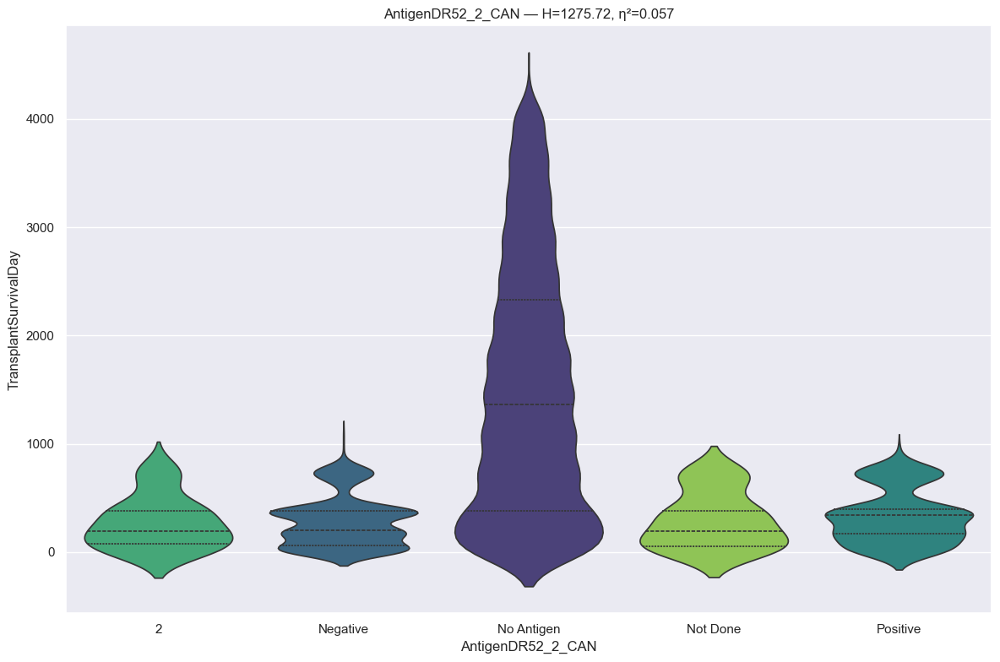

RANKING REPORT: AntigenDR52_2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 2                                                 :     33 records
 * Negative                                          :    722 records
 * No Antigen                                        :  21114 records
 * Not Done                                          :     45 records
 * Positive                                          :    260 records
BYPASSED CATEGORIES (n < min_n):
 * 1                                                 :      8 records
 * 3                                                 :     16 records
 * 4                                                 :      9 records
 * 5                                                 :     20 records
 * 7                                                 :      9 records
--------------------------------------------------------------------------------
Kruskal H: 1275.7202 | P-value: 6.113371e-275 | Effect η²: 0.0574
Correction Method: BONFERRONI
Pairwise Testing (Bonferro

In [169]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [170]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDR52_2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 2                                                 :     33 records
 * Negative                                          :    722 records
 * No Antigen                                        :  21114 records
 * Not Done                                          :     45 records
 * Positive                                          :    260 records
BYPASSED CATEGORIES (n < min_n):
 * 1                                                 :      8 records
 * 3                                                 :     16 records
 * 4                                                 :      9 records
 * 5                                                 :     20 records
 * 7                                                 :      9 records
--------------------------------------------------------------------------------
Kruskal H: 1275.7202 | P-value: 6.113371e-275 | Effect η²: 0.0574
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.

In [171]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DR53
* Antigen DR53 (part of the HLA-DRB4/5 system) is a supertypic HLA class II antigen that can induce donor-specific antibodies (DSAs), causing antibody-mediated rejection (AMR) in transplants. While mismatching is associated with potential graft damage, strong anti-DR53 antibodies do not always prohibit transplantation, requiring careful immunological assessment.

In [172]:
# info
feature = u.get_feature_info(df, 'AntigenDR53_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                 count unique         top   freq
AntigenDR53_CAN  22236      7  No Antigen  16071

:::: NaN Count:
AntigenDR53_CAN    0 



{'AntigenDR53_CAN': CategoricalDtype(categories=['1', '2', '3', 'Negative', 'No Antigen', 'Not Done',
                   'Positive'],
 , ordered=False, categories_dtype=str)}

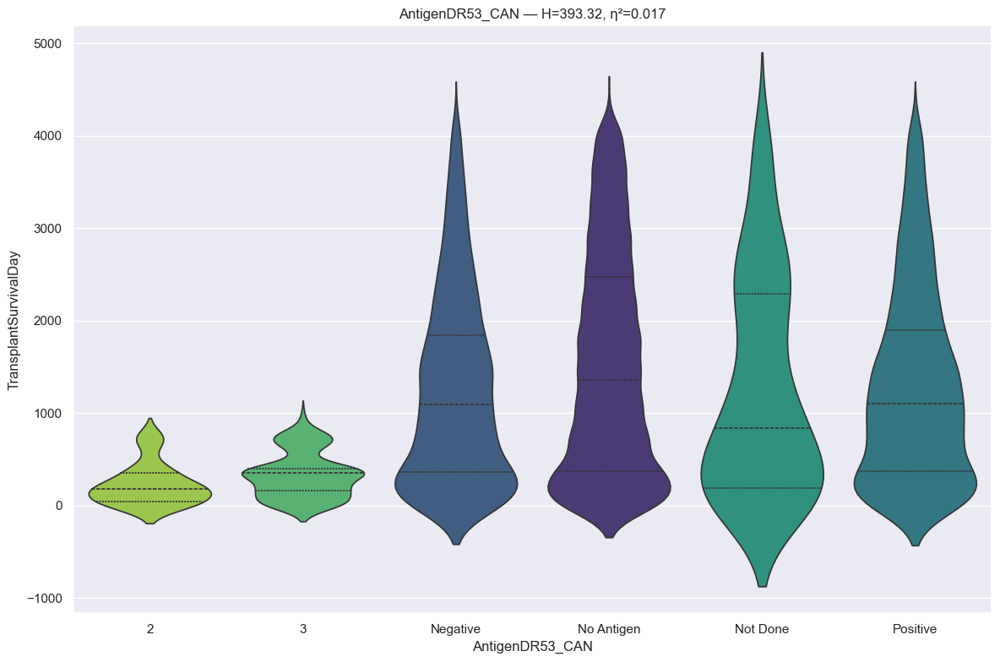

RANKING REPORT: AntigenDR53_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 2                                                 :     52 records
 * 3                                                 :    189 records
 * Negative                                          :   3008 records
 * No Antigen                                        :  16071 records
 * Not Done                                          :    131 records
 * Positive                                          :   2767 records
BYPASSED CATEGORIES (n < min_n):
 * 1                                                 :     18 records
--------------------------------------------------------------------------------
Kruskal H: 393.3205 | P-value: 8.161722e-83 | Effect η²: 0.0175
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0033 | r_threshold: 0.10)
--------------------------------------------------------------------------------
3            vs No Antigen   | p=5.8451e-46 | thr=0.0033 | r= 0.601 | *Sig*
3            vs Pos

In [173]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [174]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDR53_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 2                                                 :     52 records
 * 3                                                 :    189 records
 * Negative                                          :   3008 records
 * No Antigen                                        :  16071 records
 * Not Done                                          :    131 records
 * Positive                                          :   2767 records
BYPASSED CATEGORIES (n < min_n):
 * 1                                                 :     18 records
--------------------------------------------------------------------------------
Kruskal H: 393.3205 | P-value: 8.161722e-83 | Effect η²: 0.0175
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 5 groups (excluding 'Other') ::::

In [175]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### AntigenDR 53 2
* Anti-HLA-DR53 antibodies are donor-specific antibodies (DSAs) that can cause antibody-mediated rejection (AMR) in solid organ transplants, particularly kidneys, due to their role as class II HLA antigens. While strong pre-transplant DR53 antibodies usually indicate high risk, they do not always preclude transplantation if crossmatches are negative, though they still require careful monitoring due to the potential for AMR.

In [176]:
# info
feature = u.get_feature_info(df, 'AntigenDR53_2_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                   count unique         top   freq
AntigenDR53_2_CAN  22236      6  No Antigen  21168

:::: NaN Count:
AntigenDR53_2_CAN    0 



{'AntigenDR53_2_CAN': CategoricalDtype(categories=['2', '3', 'Negative', 'No Antigen', 'Not Done', 'Positive'], ordered=False, categories_dtype=str)}

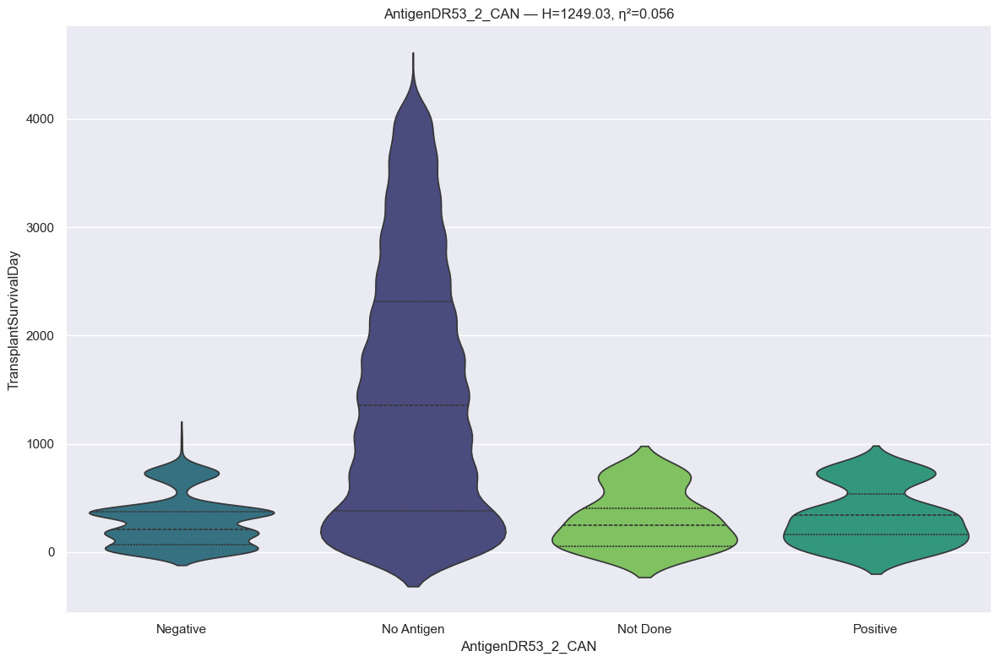

RANKING REPORT: AntigenDR53_2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    864 records
 * No Antigen                                        :  21168 records
 * Not Done                                          :     44 records
 * Positive                                          :    121 records
BYPASSED CATEGORIES (n < min_n):
 * 2                                                 :     11 records
 * 3                                                 :     28 records
--------------------------------------------------------------------------------
Kruskal H: 1249.0258 | P-value: 1.690678e-270 | Effect η²: 0.0561
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs No Antigen   | p=5.5433e-234 | thr=0.0083 | r= 0.655 | *Sig*
No Antigen   vs Positive     | p=9.6220e-33 | thr=0.0083 | r=-0.627 | *Sig*
No Antig

In [177]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [178]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DQ1
* HLA-DQ1 is a specific HLA-DQ haplotype (comprising DQA101 and DQB105/06 alleles) acting as a Class II antigen in transplants. Mismatches at the HLA-DQ locus are highly immunogenic, often leading to de novo donor-specific antibodies (dnDSAs), which can cause antibody-mediated rejection (AMR), chronic lung allograft dysfunction (CLAD), and reduced graft survival.

In [179]:
# info
feature = u.get_feature_info(df, 'AntigenDQ1_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique         top   freq
AntigenDQ1_CAN  22236     24  No Antigen  15112

:::: NaN Count:
AntigenDQ1_CAN    0 



{'AntigenDQ1_CAN': CategoricalDtype(categories=['02:01', '02:02', '03:01', '03:02', '03:03', '03:19',
                   '04:01', '04:02', '05:01', '05:02', '05:03', '06:02',
                   '06:03', '06:04', '06:09', '1', '2', '3', '4', '5', '6', '7',
                   '8', '9', 'No Antigen'],
 , ordered=False, categories_dtype=str)}

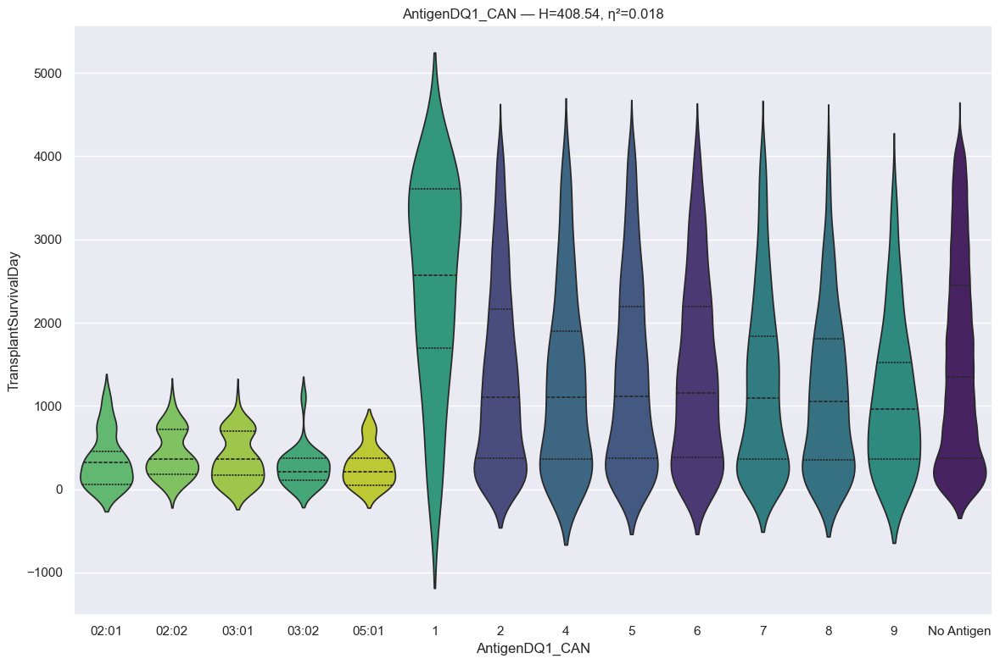

RANKING REPORT: AntigenDQ1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 02:01                                             :     77 records
 * 02:02                                             :     65 records
 * 03:01                                             :     73 records
 * 03:02                                             :     42 records
 * 05:01                                             :     31 records
 * 1                                                 :     35 records
 * 2                                                 :   2310 records
 * 4                                                 :    373 records
 * 5                                                 :   1229 records
 * 6                                                 :   1063 records
 * 7                                                 :   1174 records
 * 8                                                 :    403 records
 * 9                                                 :    152 records
 * No Antigen                

In [180]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [181]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDQ1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 02:01                                             :     77 records
 * 02:02                                             :     65 records
 * 03:01                                             :     73 records
 * 03:02                                             :     42 records
 * 05:01                                             :     31 records
 * 1                                                 :     35 records
 * 2                                                 :   2310 records
 * 4                                                 :    373 records
 * 5                                                 :   1229 records
 * 6                                                 :   1063 records
 * 7                                                 :   1174 records
 * 8                                                 :    403 records
 * 9                                                 :    152 records
 * No Antigen                

In [182]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DQ2
* HLA-DQ antigen matching in transplantation is crucial for long-term graft survival. Mismatches can lead to de novo donor-specific antibodies (dnDSAs), which are commonly linked to chronic rejection and graft failure. Anti-HLA-DQ antibodies, particularly Class II, are resistant to desensitization, making their monitoring essential.

In [183]:
# info
feature = u.get_feature_info(df, 'AntigenDQ2_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique         top   freq
AntigenDQ2_CAN  22236     25  No Antigen  16012

:::: NaN Count:
AntigenDQ2_CAN    0 



{'AntigenDQ2_CAN': CategoricalDtype(categories=['02:01', '02:02', '03:01', '03:02', '03:03', '03:19',
                   '04:02', '05:01', '05:02', '05:03', '06:01', '06:02',
                   '06:03', '06:04', '06:09', '1', '2', '3', '4', '5', '6', '7',
                   '8', '9', 'No Antigen'],
 , ordered=False, categories_dtype=str)}

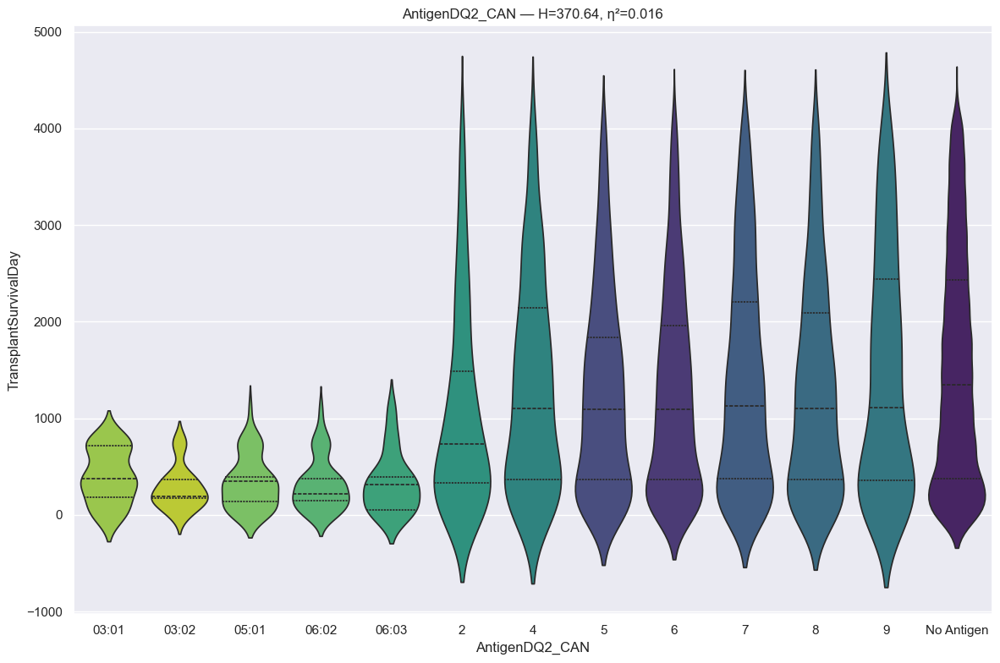

RANKING REPORT: AntigenDQ2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 03:01                                             :     33 records
 * 03:02                                             :     37 records
 * 05:01                                             :     53 records
 * 06:02                                             :     91 records
 * 06:03                                             :     36 records
 * 2                                                 :    223 records
 * 4                                                 :    249 records
 * 5                                                 :    984 records
 * 6                                                 :   1979 records
 * 7                                                 :   1265 records
 * 8                                                 :    784 records
 * 9                                                 :    361 records
 * No Antigen                                        :  16012 records
BYPASSED CATEGORIES (n < min_

In [184]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [185]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDQ2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 03:01                                             :     33 records
 * 03:02                                             :     37 records
 * 05:01                                             :     53 records
 * 06:02                                             :     91 records
 * 06:03                                             :     36 records
 * 2                                                 :    223 records
 * 4                                                 :    249 records
 * 5                                                 :    984 records
 * 6                                                 :   1979 records
 * 7                                                 :   1265 records
 * 8                                                 :    784 records
 * 9                                                 :    361 records
 * No Antigen                                        :  16012 records
BYPASSED CATEGORIES (n < min_

In [186]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Functional Status Transplant

In [187]:
# info
feature = u.get_feature_info(df, 'FunctionalStatusTransplant_CAN', cat=True)

                                count unique top  freq
FunctionalStatusTransplant_CAN  22236     10  20  7331

:::: NaN Count:
FunctionalStatusTransplant_CAN    0 

--- FunctionalStatusTransplant_CAN ---
dtype: category
Categories: ['10', '100', '20', '30', '40', '50', '60', '70', '80', '90']
Ordered: False



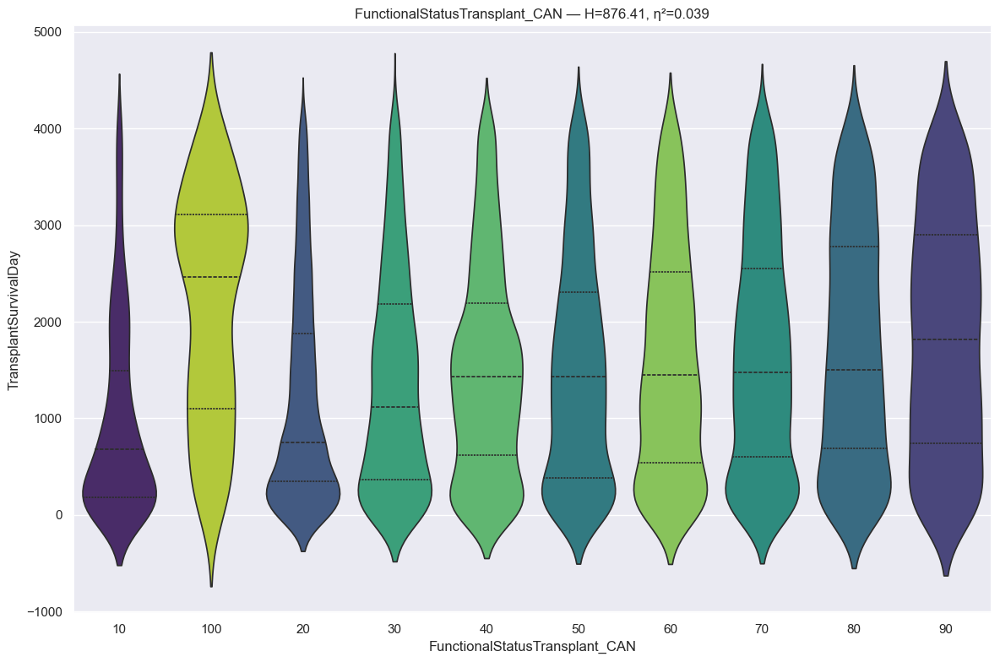

RANKING REPORT: FunctionalStatusTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 10                                                :    903 records
 * 100                                               :    316 records
 * 20                                                :   7331 records
 * 30                                                :   2046 records
 * 40                                                :   2792 records
 * 50                                                :   2052 records
 * 60                                                :   2008 records
 * 70                                                :   2336 records
 * 80                                                :   1607 records
 * 90                                                :    845 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 876.4115 | P-value: 7.470608e-183 | Effect η²: 0.0390
Correction Method: BONFERRONI
Pairwise Testing (Bon

In [188]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [189]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: FunctionalStatusTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 10                                                :    903 records
 * 100                                               :    316 records
 * 20                                                :   7331 records
 * 30                                                :   2046 records
 * 40                                                :   2792 records
 * 50                                                :   2052 records
 * 60                                                :   2008 records
 * 70                                                :   2336 records
 * 80                                                :   1607 records
 * 90                                                :    845 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 876.4115 | P-value: 7.470608e-183 | Effect η²: 0.0390
Correction Method: HOLM
Pairwise Testing (Base Alph

In [190]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Medical Condition Transplant

In [191]:
# info
feature = u.get_feature_info(df, 'MedicalConditionTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                count unique               top   freq
MedicalConditionTransplant_CAN  22236      4  Not Hospitalized  10561

:::: NaN Count:
MedicalConditionTransplant_CAN    0 



{'MedicalConditionTransplant_CAN': CategoricalDtype(categories=['Hospitalized Not in ICU', 'In Intensive Care Unit',
                   'Not Hospitalized', 'Unknown'],
 , ordered=False, categories_dtype=str)}

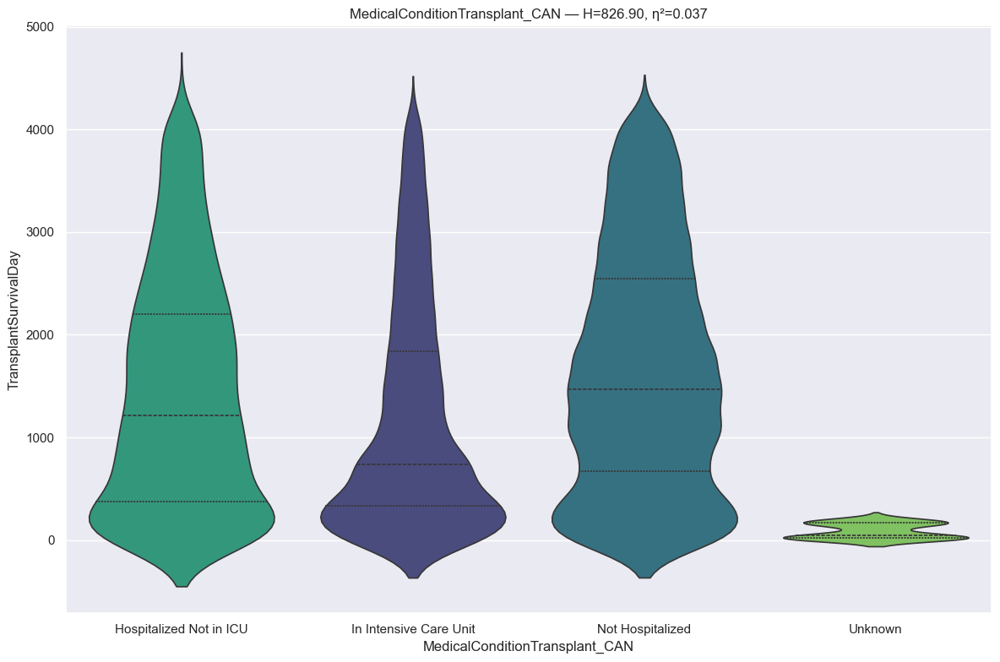

RANKING REPORT: MedicalConditionTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Hospitalized Not in ICU                           :   3399 records
 * In Intensive Care Unit                            :   8245 records
 * Not Hospitalized                                  :  10561 records
 * Unknown                                           :     31 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 826.9011 | P-value: 6.337278e-179 | Effect η²: 0.0371
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
In Intensive Care Unit vs Not Hospitalized | p=2.3859e-168 | thr=0.0083 | r= 0.235 | *Sig*
Hospitalized Not in ICU vs In Intensive Care Unit | p=4.6289e-33 | thr=0.0083 | r=-0.141 | *Sig*
Hospitalized Not in ICU vs Not Hospitalized | p=1.3874e-16 | thr=0.0083 | r= 0.094 | *Sig*
Not Hospitalized 

In [192]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [193]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Primary Payment Transplant

In [194]:
# info
feature = u.get_feature_info(df, 'PrimaryPaymentTransplant_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                              count unique                top   freq
PrimaryPaymentTransplant_CAN  22236     12  Private insurance  10439

:::: NaN Count:
PrimaryPaymentTransplant_CAN    0 



{'PrimaryPaymentTransplant_CAN': CategoricalDtype(categories=['Donation', 'Foreign Government Specify', 'Free Care',
                   'Missing', 'Private insurance',
                   'Public insurance - CHIP (Children's Health Insurance Program)',
                   'Public insurance - Department of VA',
                   'Public insurance - Medicaid',
                   'Public insurance - Medicare & Choice',
                   'Public insurance - Medicare FFS (Fee for Service)',
                   'Public insurance - Other government', 'Self'],
 , ordered=False, categories_dtype=str)}

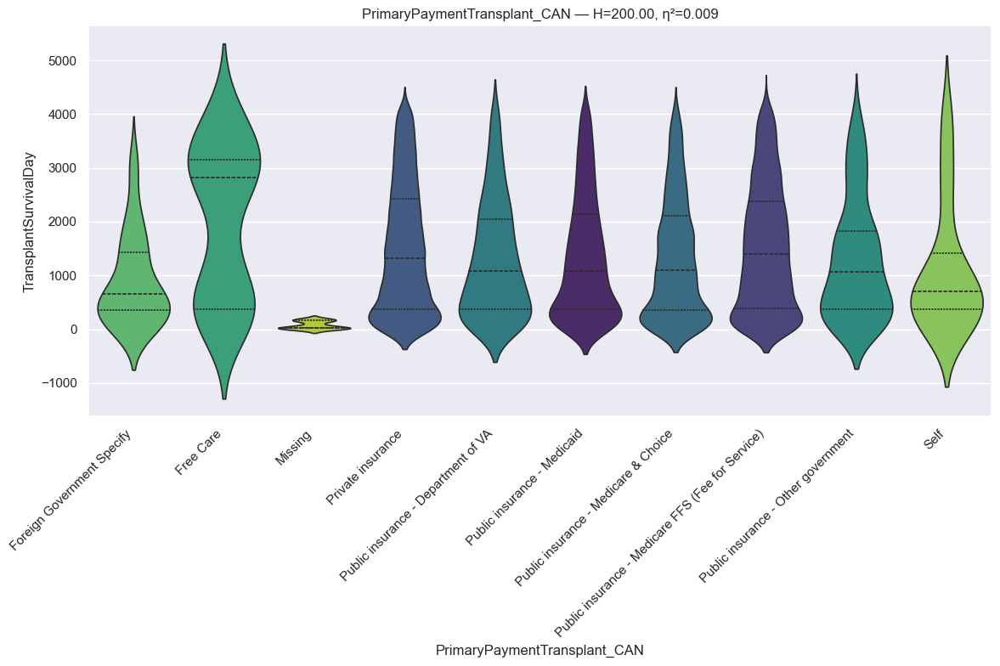

RANKING REPORT: PrimaryPaymentTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Foreign Government Specify                        :     55 records
 * Free Care                                         :     45 records
 * Missing                                           :     34 records
 * Private insurance                                 :  10439 records
 * Public insurance - Department of VA               :    520 records
 * Public insurance - Medicaid                       :   2660 records
 * Public insurance - Medicare & Choice              :   3631 records
 * Public insurance - Medicare FFS (Fee for Service) :   4554 records
 * Public insurance - Other government               :    240 records
 * Self                                              :     49 records
BYPASSED CATEGORIES (n < min_n):
 * Donation                                          :      3 records
 * Public insurance - CHIP (Children's Health Insurance Program):      6 records
-----------------------------------------

In [195]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [196]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PrimaryPaymentTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Foreign Government Specify                        :     55 records
 * Free Care                                         :     45 records
 * Missing                                           :     34 records
 * Private insurance                                 :  10439 records
 * Public insurance - Department of VA               :    520 records
 * Public insurance - Medicaid                       :   2660 records
 * Public insurance - Medicare & Choice              :   3631 records
 * Public insurance - Medicare FFS (Fee for Service) :   4554 records
 * Public insurance - Other government               :    240 records
 * Self                                              :     49 records
BYPASSED CATEGORIES (n < min_n):
 * Donation                                          :      3 records
 * Public insurance - CHIP (Children's Health Insurance Program):      6 records
-----------------------------------------

In [197]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Transplant ECMO

In [198]:
# info
feature = u.get_feature_info(df, 'LifeSupportTransplant_ECMO', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                count unique top   freq
LifeSupportTransplant_ECMO_CAN  22236      2  No  21713

:::: NaN Count:
LifeSupportTransplant_ECMO_CAN    0 



{'LifeSupportTransplant_ECMO_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

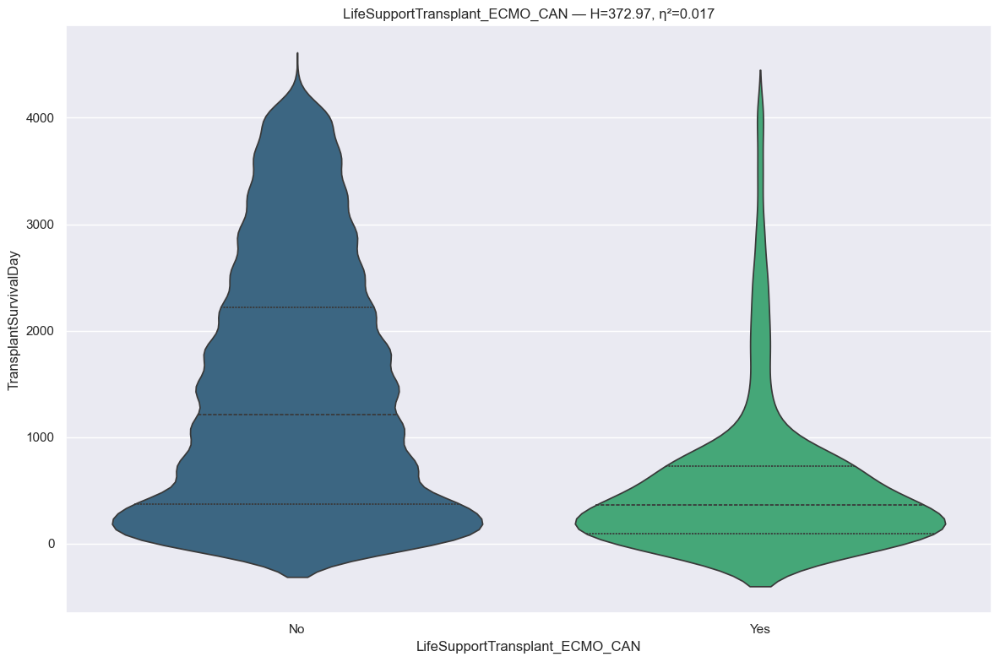

RANKING REPORT: LifeSupportTransplant_ECMO_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21713 records
 * Yes                                               :    523 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 372.9679 | P-value: 4.226558e-83 | Effect η²: 0.0167
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=4.2268e-83 | thr=0.0500 | r=-0.493 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

LifeSupportTransplant_ECMO_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                  

In [199]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [200]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Residency State Transplant

In [201]:
# info
feature = u.get_feature_info(df, 'ResidencyStateTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                              count unique top  freq
ResidencyStateTransplant_CAN  22236     55  CA  2654

:::: NaN Count:
ResidencyStateTransplant_CAN    0 



{'ResidencyStateTransplant_CAN': CategoricalDtype(categories=['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL',
                   'GA', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA',
                   'MD', 'ME', 'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE',
                   'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'PR',
                   'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'Unknown', 'VA', 'VI',
                   'VT', 'WA', 'WI', 'WV', 'WY', 'ZZ'],
 , ordered=False, categories_dtype=str)}

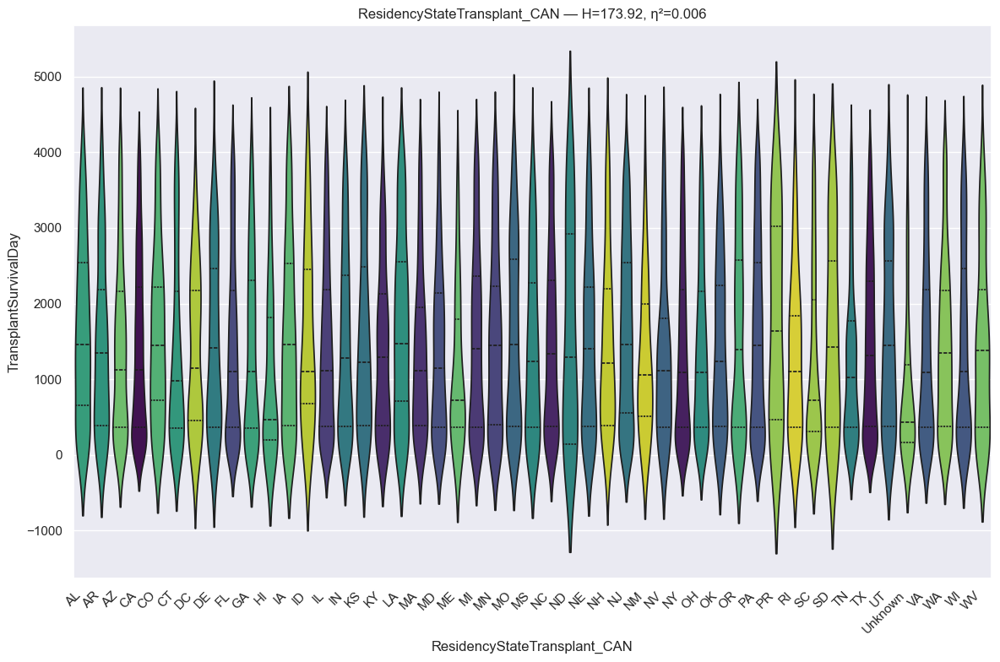

RANKING REPORT: ResidencyStateTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * AL                                                :    191 records
 * AR                                                :    163 records
 * AZ                                                :    385 records
 * CA                                                :   2654 records
 * CO                                                :    234 records
 * CT                                                :    383 records
 * DC                                                :     43 records
 * DE                                                :     77 records
 * FL                                                :   1454 records
 * GA                                                :    503 records
 * HI                                                :     54 records
 * IA                                                :    205 records
 * ID                                                :     66 records
 * IL          

In [202]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [203]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: ResidencyStateTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * AL                                                :    191 records
 * AR                                                :    163 records
 * AZ                                                :    385 records
 * CA                                                :   2654 records
 * CO                                                :    234 records
 * CT                                                :    383 records
 * DC                                                :     43 records
 * DE                                                :     77 records
 * FL                                                :   1454 records
 * GA                                                :    503 records
 * HI                                                :     54 records
 * IA                                                :    205 records
 * ID                                                :     66 records
 * IL          

In [204]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Work Income Transplant

In [205]:
# info
feature = u.get_feature_info(df, 'WorkIncomeTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                          count unique top   freq
WorkIncomeTransplant_CAN  22236      3  No  18749

:::: NaN Count:
WorkIncomeTransplant_CAN    0 



{'WorkIncomeTransplant_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

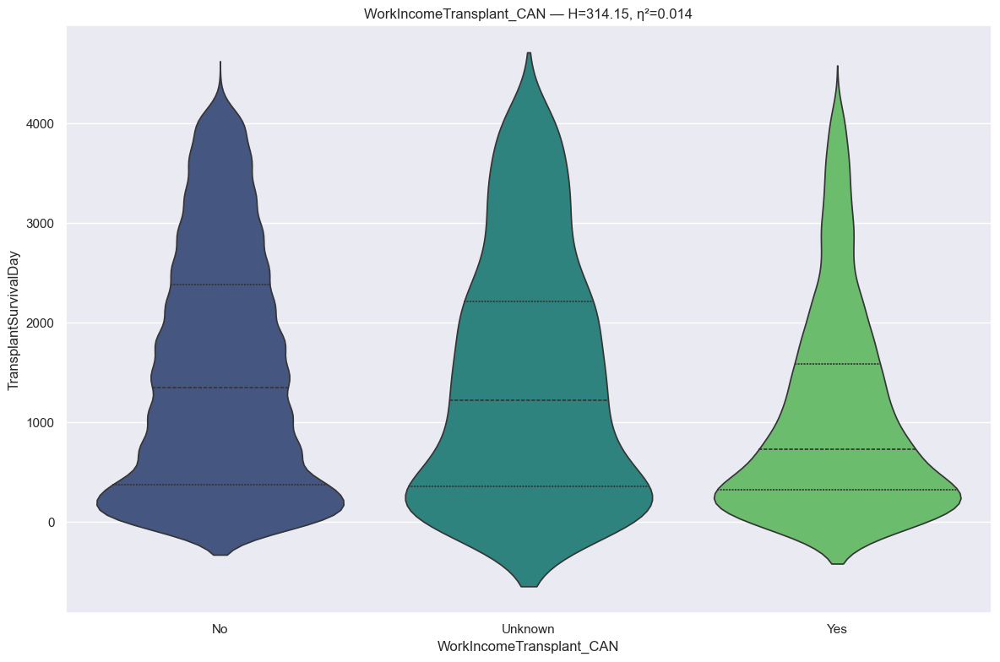

RANKING REPORT: WorkIncomeTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  18749 records
 * Unknown                                           :    745 records
 * Yes                                               :   2742 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 314.1480 | P-value: 6.076001e-69 | Effect η²: 0.0140
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.5851e-70 | thr=0.0167 | r=-0.210 | *Sig*
Unknown      vs Yes          | p=4.3250e-12 | thr=0.0167 | r=-0.165 | *Sig*
No           vs Unknown      | p=1.3213e-01 | thr=0.0167 | r=-0.032 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> 

In [206]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [207]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: WorkIncomeTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  18749 records
 * Unknown                                           :    745 records
 * Yes                                               :   2742 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 314.1480 | P-value: 6.076001e-69 | Effect η²: 0.0140
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Unknown

>>> Group_2 (1 categories)
  - Yes



In [208]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Transplant PGE

In [209]:
# info
feature = u.get_feature_info(df, 'LifeSupportTransplant_PGE', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                               count unique top   freq
LifeSupportTransplant_PGE_CAN  22236      2  No  22174

:::: NaN Count:
LifeSupportTransplant_PGE_CAN    0 



{'LifeSupportTransplant_PGE_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

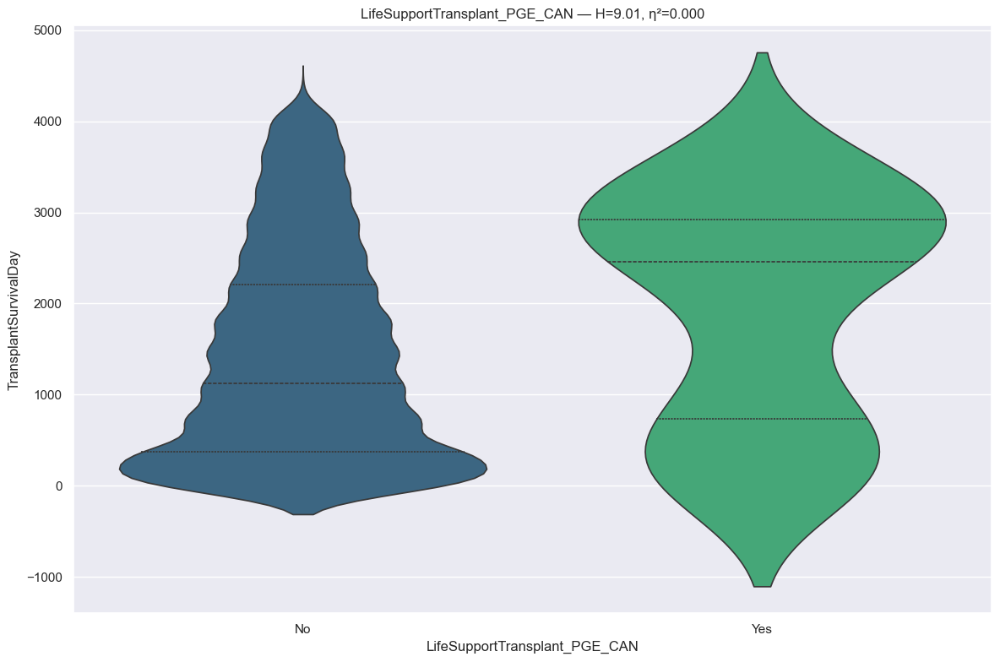

RANKING REPORT: LifeSupportTransplant_PGE_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  22174 records
 * Yes                                               :     62 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 9.0128 | P-value: 2.680982e-03 | Effect η²: 0.0004
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=2.6811e-03 | thr=0.0500 | r= 0.220 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

LifeSupportTransplant_PGE_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                      

In [210]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [211]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Dialysis Between Registration Transplant

In [212]:
# info
feature = u.get_feature_info(df, 'DialysisBetweenRegistrationTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                           count unique top   freq
DialysisBetweenRegistrationTransplant_CAN  22236      3  No  21114

:::: NaN Count:
DialysisBetweenRegistrationTransplant_CAN    0 



{'DialysisBetweenRegistrationTransplant_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

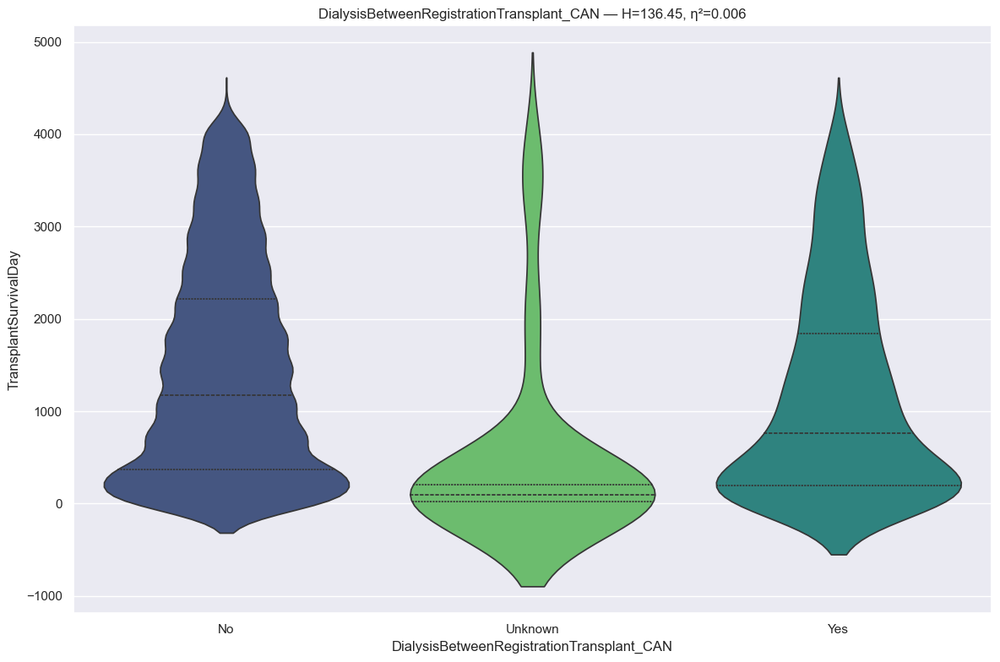

RANKING REPORT: DialysisBetweenRegistrationTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21114 records
 * Unknown                                           :     63 records
 * Yes                                               :   1059 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 136.4481 | P-value: 2.347824e-30 | Effect η²: 0.0060
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=3.7177e-17 | thr=0.0167 | r=-0.153 | *Sig*
No           vs Unknown      | p=2.9983e-16 | thr=0.0167 | r=-0.595 | *Sig*
Unknown      vs Yes          | p=9.1880e-11 | thr=0.0167 | r= 0.485 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::::

In [213]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [214]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### LifeSupportTransplant IABP

In [215]:
# info
feature = u.get_feature_info(df, 'LifeSupportTransplant_IABP', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                count unique top   freq
LifeSupportTransplant_IABP_CAN  22236      2  No  19203

:::: NaN Count:
LifeSupportTransplant_IABP_CAN    0 



{'LifeSupportTransplant_IABP_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

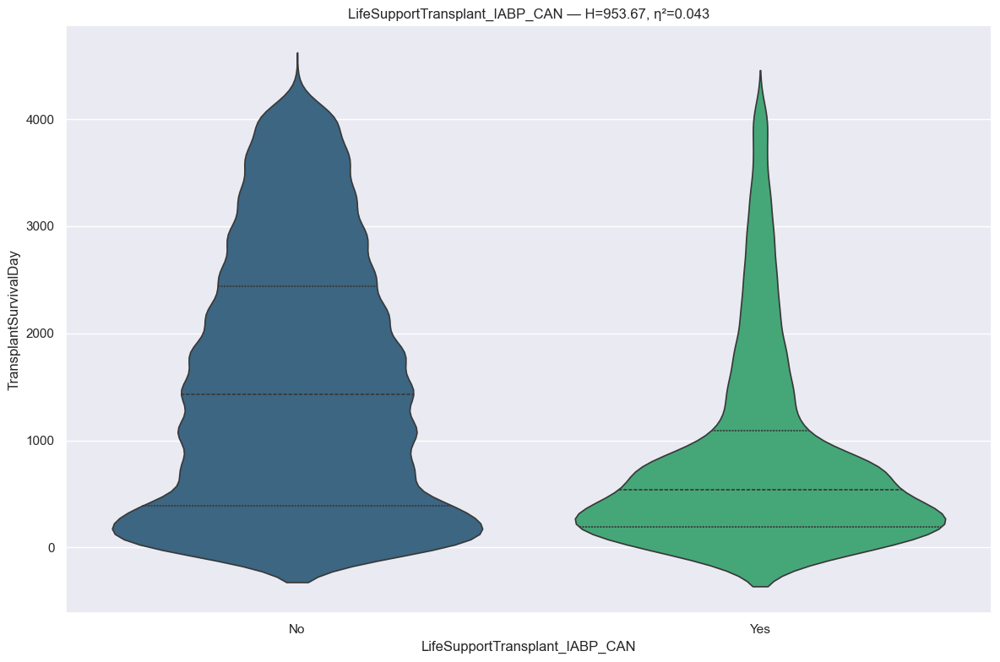

RANKING REPORT: LifeSupportTransplant_IABP_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  19203 records
 * Yes                                               :   3033 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 953.6726 | P-value: 2.110598e-209 | Effect η²: 0.0428
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=2.1107e-209 | thr=0.0500 | r=-0.348 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

LifeSupportTransplant_IABP_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                

In [216]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [217]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Infection Therapy IV

In [218]:
# info
feature = u.get_feature_info(df, 'InfectionTherapyIV', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique top   freq
InfectionTherapyIV_CAN  22236      3  No  19523

:::: NaN Count:
InfectionTherapyIV_CAN    0 



{'InfectionTherapyIV_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

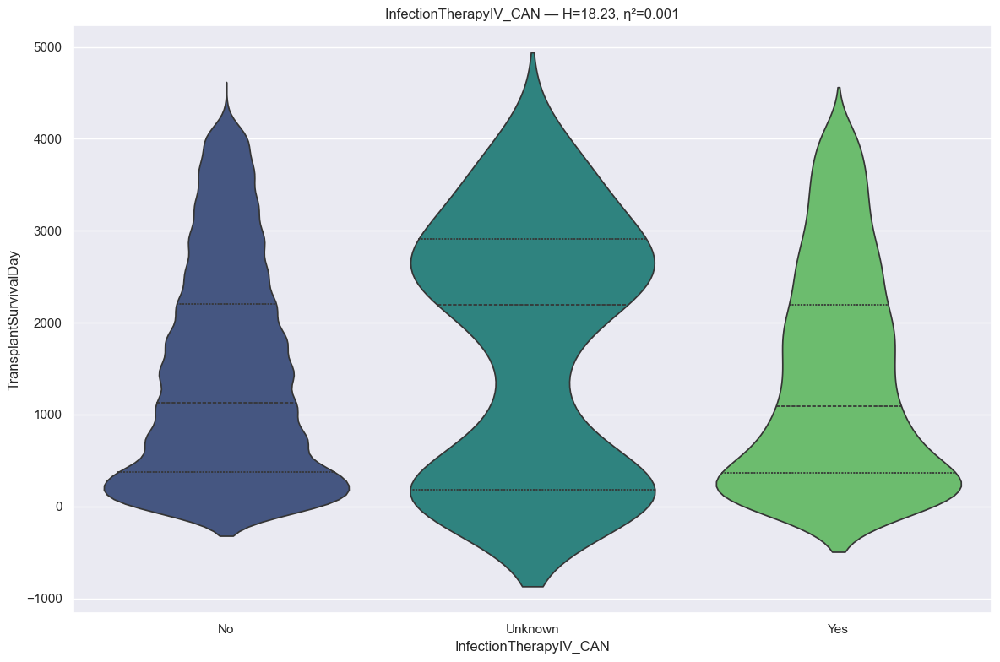

RANKING REPORT: InfectionTherapyIV_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  19523 records
 * Unknown                                           :    288 records
 * Yes                                               :   2425 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 18.2331 | P-value: 1.098352e-04 | Effect η²: 0.0007
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=3.7880e-04 | thr=0.0167 | r=-0.128 | *Sig*
No           vs Unknown      | p=1.6437e-03 | thr=0.0167 | r= 0.108 | *Sig*
No           vs Yes          | p=4.7197e-03 | thr=0.0167 | r=-0.035 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group

In [219]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [220]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropes IV Transplant

In [221]:
# info
feature = u.get_feature_info(df, 'InotropesIVTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                           count unique top   freq
InotropesIVTransplant_CAN  22236      2  No  14182

:::: NaN Count:
InotropesIVTransplant_CAN    0 



{'InotropesIVTransplant_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

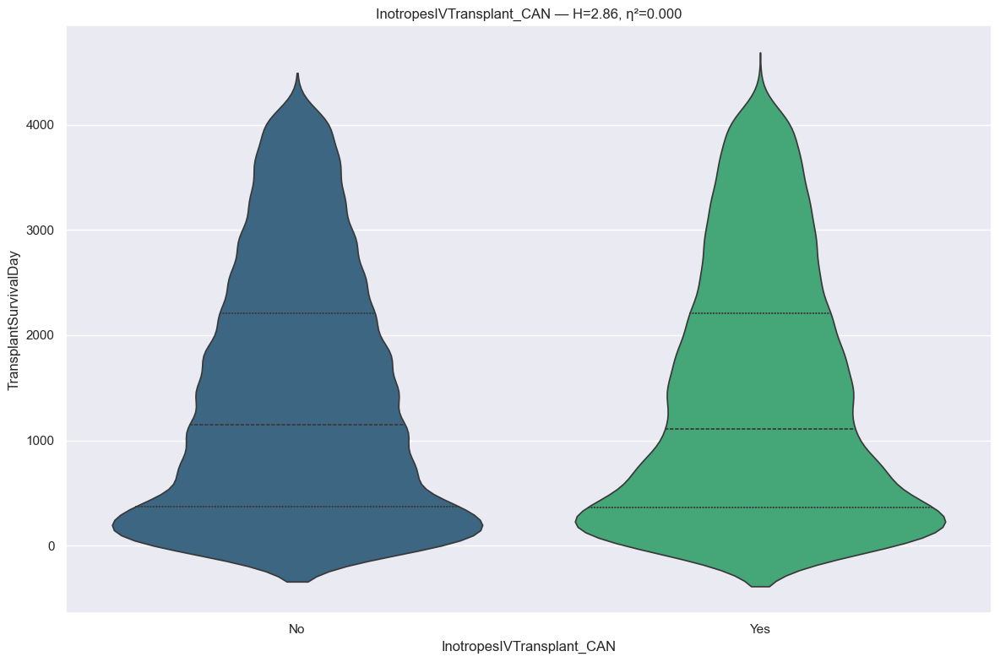

RANKING REPORT: InotropesIVTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  14182 records
 * Yes                                               :   8054 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 2.8616 | P-value: 9.071761e-02 | Effect η²: 0.0001
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=9.0718e-02 | thr=0.0500 | r=-0.014 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

InotropesIVTransplant_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                       No         1445.151742           

In [222]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [223]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature is not statistically significant and has an extremely minimal impact on survival.

#### Inotropes Vasodilators Transplant CO

In [224]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsTransplant_CO', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                        count unique top   freq
InotropesVasodilatorsTransplant_CO_CAN  22236      3  No  12237

:::: NaN Count:
InotropesVasodilatorsTransplant_CO_CAN    0 



{'InotropesVasodilatorsTransplant_CO_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

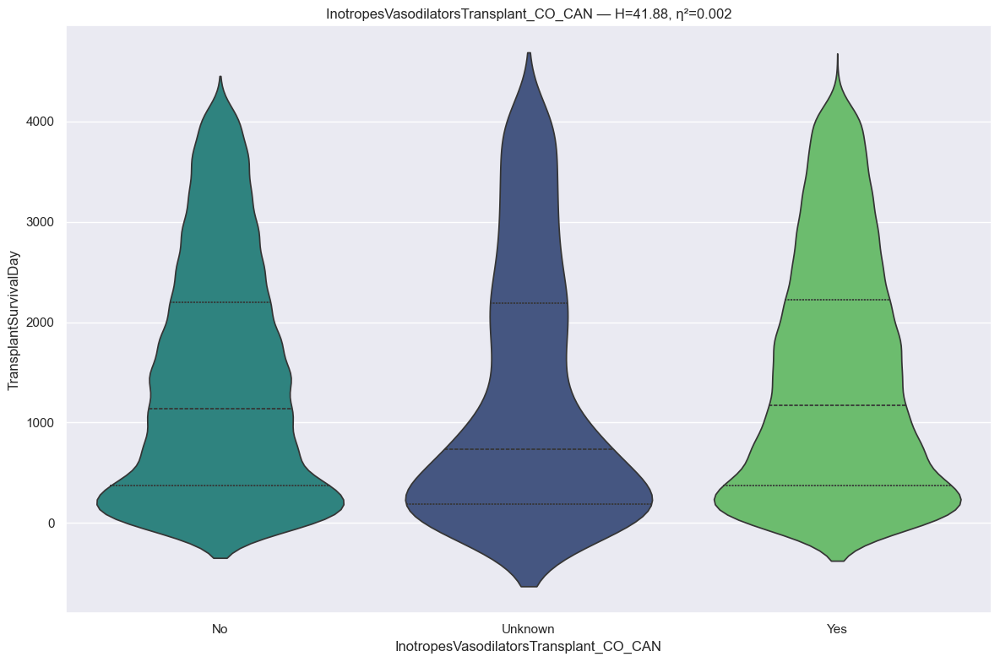

RANKING REPORT: InotropesVasodilatorsTransplant_CO_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12237 records
 * Unknown                                           :    977 records
 * Yes                                               :   9022 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 41.8758 | P-value: 8.068346e-10 | Effect η²: 0.0018
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=1.0717e-10 | thr=0.0167 | r= 0.126 | *Sig*
No           vs Unknown      | p=3.6779e-09 | thr=0.0167 | r=-0.113 | *Sig*
No           vs Yes          | p=1.0896e-01 | thr=0.0167 | r= 0.013 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::::::

In [225]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [226]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InotropesVasodilatorsTransplant_CO_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12237 records
 * Unknown                                           :    977 records
 * Yes                                               :   9022 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 41.8758 | P-value: 8.068346e-10 | Effect η²: 0.0018
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Group_2 (1 categories)
  - Unknown



In [227]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropes Vasodilators Transplant DIA

In [228]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsTransplant_DIA', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                         count unique top   freq
InotropesVasodilatorsTransplant_DIA_CAN  22236      3  No  12371

:::: NaN Count:
InotropesVasodilatorsTransplant_DIA_CAN    0 



{'InotropesVasodilatorsTransplant_DIA_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

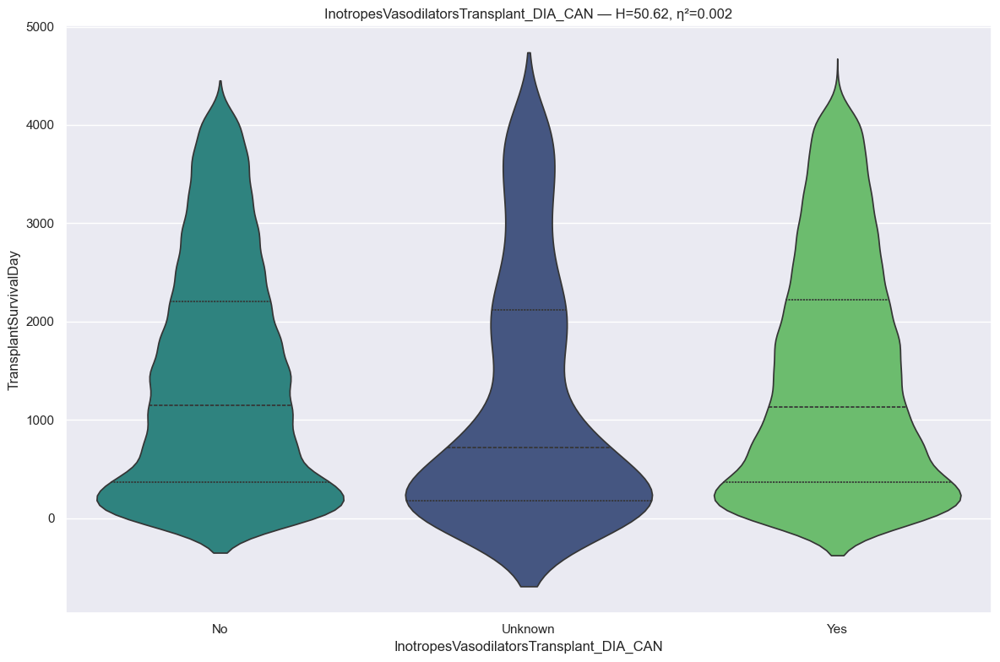

RANKING REPORT: InotropesVasodilatorsTransplant_DIA_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12371 records
 * Unknown                                           :    604 records
 * Yes                                               :   9261 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 50.6188 | P-value: 1.019221e-11 | Effect η²: 0.0022
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=1.0132e-12 | thr=0.0167 | r= 0.173 | *Sig*
No           vs Unknown      | p=1.0019e-11 | thr=0.0167 | r=-0.164 | *Sig*
No           vs Yes          | p=3.0111e-01 | thr=0.0167 | r= 0.008 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::

In [229]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [230]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InotropesVasodilatorsTransplant_DIA_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12371 records
 * Unknown                                           :    604 records
 * Yes                                               :   9261 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 50.6188 | P-value: 1.019221e-11 | Effect η²: 0.0022
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Group_2 (1 categories)
  - Unknown



In [231]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropes Vasodilators Transplant MN

In [232]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsTransplant_MN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                        count unique top   freq
InotropesVasodilatorsTransplant_MN_CAN  22236      3  No  12250

:::: NaN Count:
InotropesVasodilatorsTransplant_MN_CAN    0 



{'InotropesVasodilatorsTransplant_MN_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

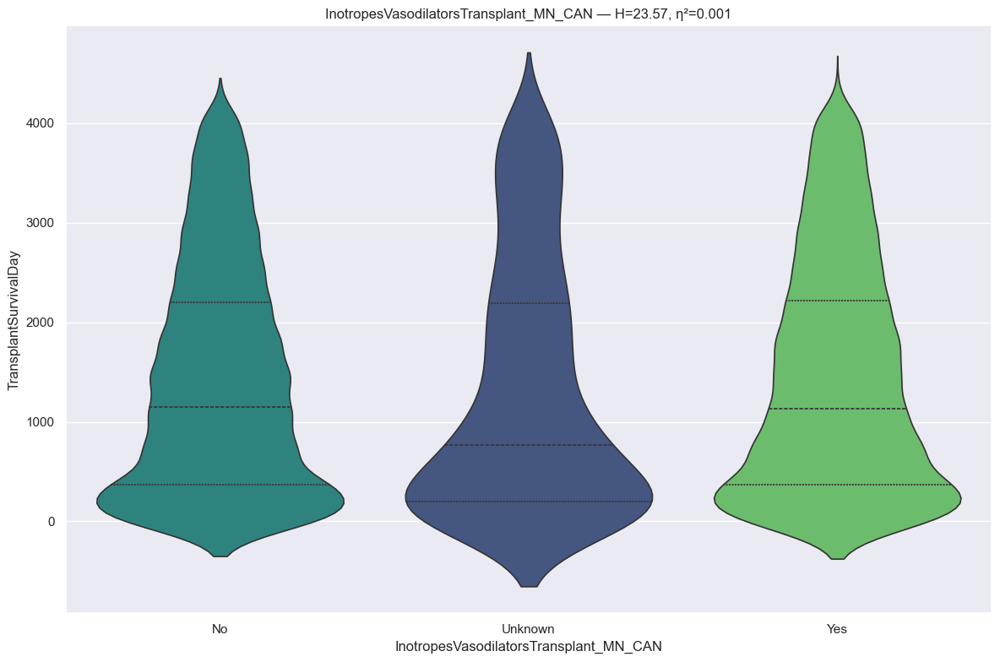

RANKING REPORT: InotropesVasodilatorsTransplant_MN_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12250 records
 * Unknown                                           :    839 records
 * Yes                                               :   9147 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 23.5659 | P-value: 7.633530e-06 | Effect η²: 0.0010
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=1.1482e-06 | thr=0.0167 | r= 0.101 | *Sig*
No           vs Unknown      | p=5.4801e-06 | thr=0.0167 | r=-0.094 | *Sig*
No           vs Yes          | p=3.6910e-01 | thr=0.0167 | r= 0.007 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::::::

In [233]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [234]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InotropesVasodilatorsTransplant_MN_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12250 records
 * Unknown                                           :    839 records
 * Yes                                               :   9147 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 23.5659 | P-value: 7.633530e-06 | Effect η²: 0.0010
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Group_2 (1 categories)
  - Unknown



In [235]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropes Vasodilators Transplant PCW

In [236]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsTransplant_PCW', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                         count unique top   freq
InotropesVasodilatorsTransplant_PCW_CAN  22236      3  No  12211

:::: NaN Count:
InotropesVasodilatorsTransplant_PCW_CAN    0 



{'InotropesVasodilatorsTransplant_PCW_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

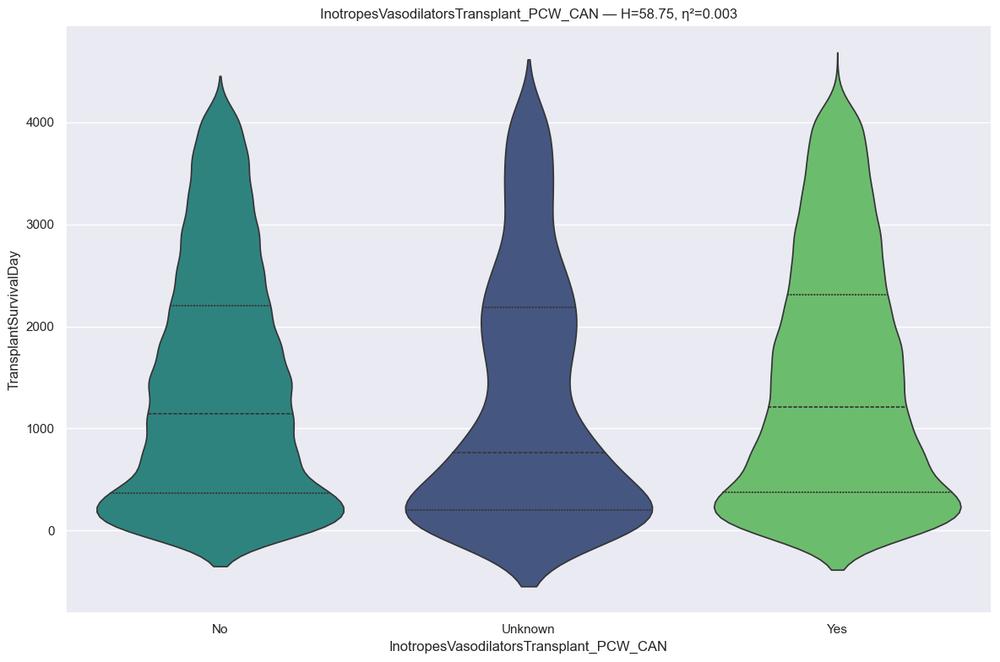

RANKING REPORT: InotropesVasodilatorsTransplant_PCW_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12211 records
 * Unknown                                           :   1617 records
 * Yes                                               :   8408 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 58.7450 | P-value: 1.752605e-13 | Effect η²: 0.0026
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=2.0323e-14 | thr=0.0167 | r= 0.120 | *Sig*
No           vs Unknown      | p=1.8702e-11 | thr=0.0167 | r=-0.103 | *Sig*
No           vs Yes          | p=3.0890e-02 | thr=0.0167 | r= 0.018 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::

In [237]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [238]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InotropesVasodilatorsTransplant_PCW_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12211 records
 * Unknown                                           :   1617 records
 * Yes                                               :   8408 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 58.7450 | P-value: 1.752605e-13 | Effect η²: 0.0026
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Unknown

>>> Group_3 (1 categories)
  - Yes



In [239]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropes Vasodilators Transplant SYS

In [240]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsTransplant_SYS', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                         count unique top   freq
InotropesVasodilatorsTransplant_SYS_CAN  22236      3  No  12382

:::: NaN Count:
InotropesVasodilatorsTransplant_SYS_CAN    0 



{'InotropesVasodilatorsTransplant_SYS_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

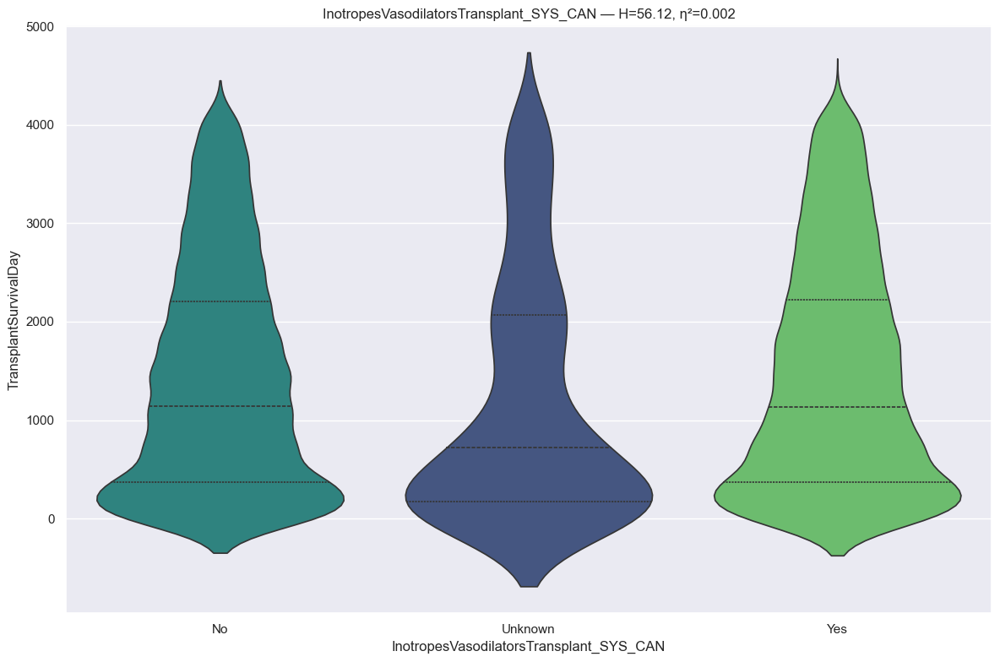

RANKING REPORT: InotropesVasodilatorsTransplant_SYS_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12382 records
 * Unknown                                           :    587 records
 * Yes                                               :   9267 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 56.1241 | P-value: 6.498435e-13 | Effect η²: 0.0024
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=6.1943e-14 | thr=0.0167 | r= 0.184 | *Sig*
No           vs Unknown      | p=7.2733e-13 | thr=0.0167 | r=-0.175 | *Sig*
No           vs Yes          | p=2.7724e-01 | thr=0.0167 | r= 0.009 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::

In [241]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [242]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InotropesVasodilatorsTransplant_SYS_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12382 records
 * Unknown                                           :    587 records
 * Yes                                               :   9267 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 56.1241 | P-value: 6.498435e-13 | Effect η²: 0.0024
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Group_2 (1 categories)
  - Unknown



In [243]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Mechanism Transplant OTHER

In [244]:
# info
feature = u.get_feature_info(df, 'LifeSupportMechanismTransplant_OTHER', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                          count unique top   freq
LifeSupportMechanismTransplant_OTHER_CAN  22236      2  No  20527

:::: NaN Count:
LifeSupportMechanismTransplant_OTHER_CAN    0 



{'LifeSupportMechanismTransplant_OTHER_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

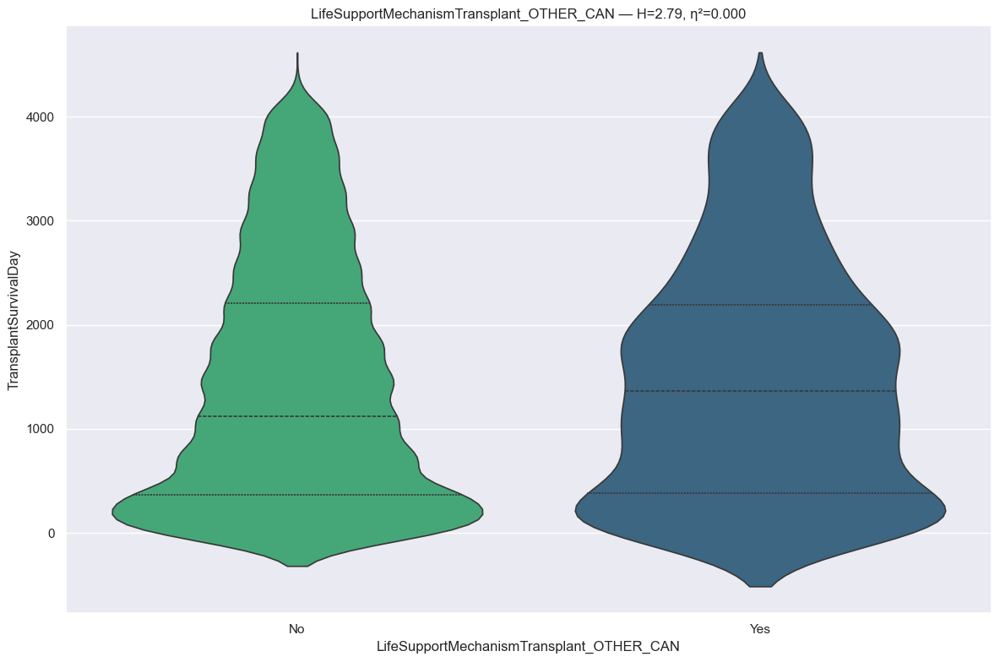

RANKING REPORT: LifeSupportMechanismTransplant_OTHER_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  20527 records
 * Yes                                               :   1709 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 2.7905 | P-value: 9.482613e-02 | Effect η²: 0.0001
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=9.4827e-02 | thr=0.0500 | r= 0.024 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

LifeSupportMechanismTransplant_OTHER_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                          

In [245]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [246]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Prior Lung Surgery After Registration

In [247]:
# info
feature = u.get_feature_info(df, 'PriorLungSurgeryAfterRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                       count unique top   freq
PriorLungSurgeryAfterRegistration_CAN  22236      3  No  22014

:::: NaN Count:
PriorLungSurgeryAfterRegistration_CAN    0 



{'PriorLungSurgeryAfterRegistration_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

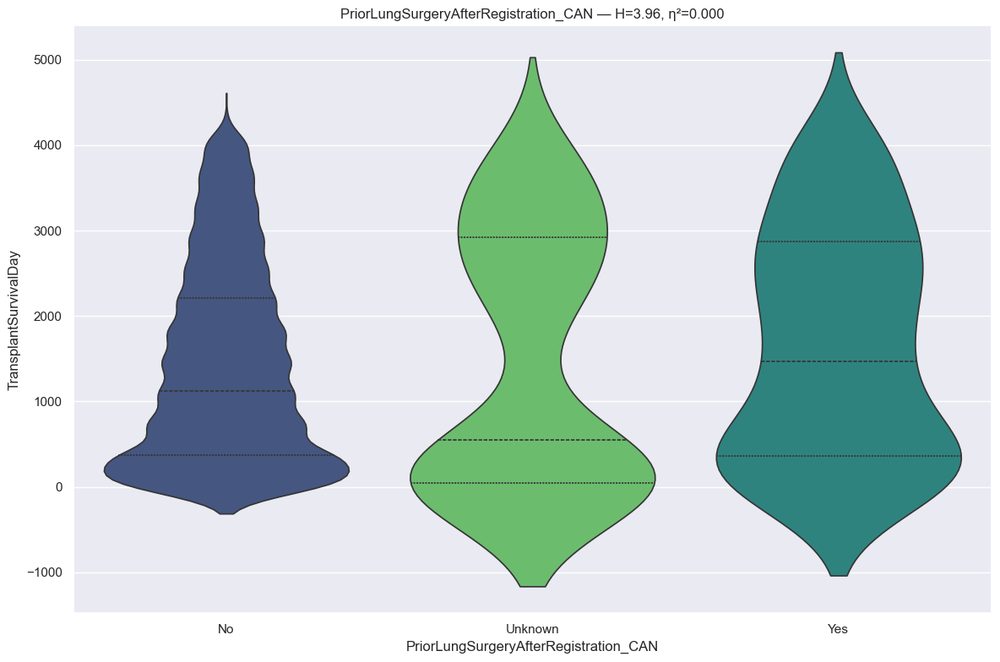

RANKING REPORT: PriorLungSurgeryAfterRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  22014 records
 * Unknown                                           :    108 records
 * Yes                                               :    114 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 3.9607 | P-value: 1.380212e-01 | Effect η²: 0.0001
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=9.2990e-02 | thr=0.0167 | r= 0.131 | Not Sig
No           vs Unknown      | p=1.1141e-01 | thr=0.0167 | r=-0.089 | Not Sig
No           vs Yes          | p=2.3357e-01 | thr=0.0167 | r= 0.065 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::::

In [248]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [249]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PriorLungSurgeryAfterRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  22014 records
 * Unknown                                           :    108 records
 * Yes                                               :    114 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 3.9607 | P-value: 1.380212e-01 | Effect η²: 0.0001
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Unknown

>>> Group_3 (1 categories)
  - Yes



In [250]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Steroids Use

In [251]:
# info
feature = u.get_feature_info(df, 'SteroidsUse', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                 count unique top   freq
SteroidsUse_CAN  22236      3  No  20508

:::: NaN Count:
SteroidsUse_CAN    0 



{'SteroidsUse_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

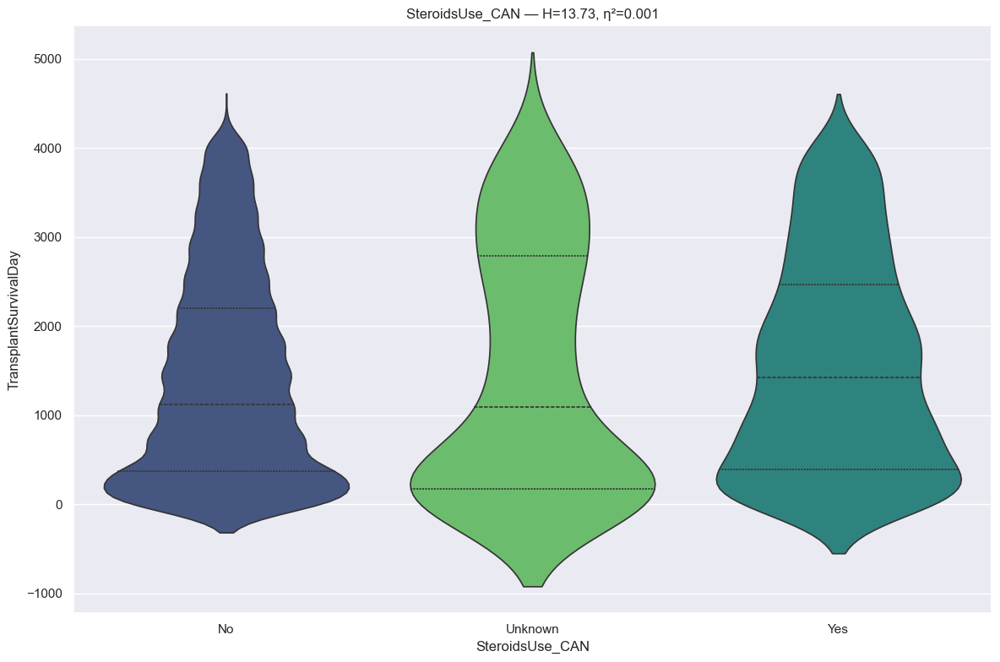

RANKING REPORT: SteroidsUse_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  20508 records
 * Unknown                                           :    233 records
 * Yes                                               :   1495 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 13.7325 | P-value: 1.042381e-03 | Effect η²: 0.0005
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=5.7653e-04 | thr=0.0167 | r= 0.053 | *Sig*
Unknown      vs Yes          | p=2.2907e-02 | thr=0.0167 | r= 0.093 | Not Sig
No           vs Unknown      | p=1.8907e-01 | thr=0.0167 | r=-0.050 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 

In [252]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [253]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: SteroidsUse_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  20508 records
 * Unknown                                           :    233 records
 * Yes                                               :   1495 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 13.7325 | P-value: 1.042381e-03 | Effect η²: 0.0005
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Unknown

>>> Group_3 (1 categories)
  - Yes



In [254]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Transfusion After Registration

In [255]:
# info
feature = u.get_feature_info(df, 'TransfusionAfterRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                  count unique top   freq
TransfusionAfterRegistration_CAN  22236      3  No  17029

:::: NaN Count:
TransfusionAfterRegistration_CAN    0 



{'TransfusionAfterRegistration_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

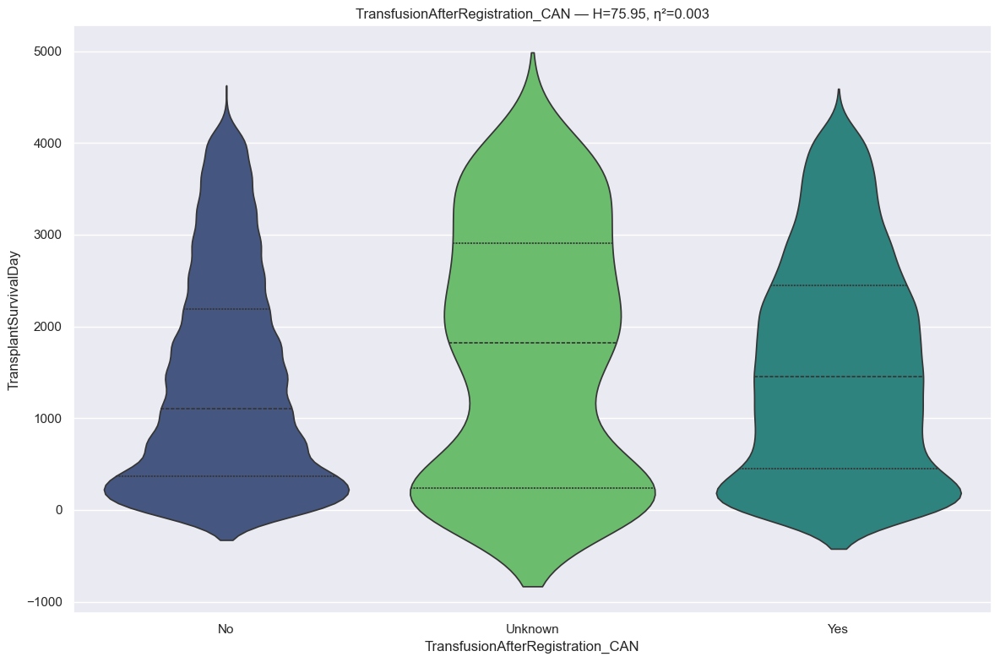

RANKING REPORT: TransfusionAfterRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  17029 records
 * Unknown                                           :    352 records
 * Yes                                               :   4855 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 75.9548 | P-value: 3.210922e-17 | Effect η²: 0.0033
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=3.7171e-16 | thr=0.0167 | r= 0.077 | *Sig*
No           vs Unknown      | p=3.5804e-04 | thr=0.0167 | r= 0.111 | *Sig*
Unknown      vs Yes          | p=7.1656e-02 | thr=0.0167 | r=-0.057 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::::::::::::

In [256]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [257]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: TransfusionAfterRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  17029 records
 * Unknown                                           :    352 records
 * Yes                                               :   4855 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 75.9548 | P-value: 3.210922e-17 | Effect η²: 0.0033
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Unknown

>>> Group_3 (1 categories)
  - Yes



In [258]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Ventricular Device Type Transplant

In [259]:
# info
feature = u.get_feature_info(df, 'VentricularDeviceTypeTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                     count unique   top   freq
VentricularDeviceTypeTransplant_CAN  22236      6  None  11947

:::: NaN Count:
VentricularDeviceTypeTransplant_CAN    0 



{'VentricularDeviceTypeTransplant_CAN': CategoricalDtype(categories=['Lvad', 'Lvad+Rvad', 'None', 'Rvad', 'Tah', 'Unknown'], ordered=False, categories_dtype=str)}

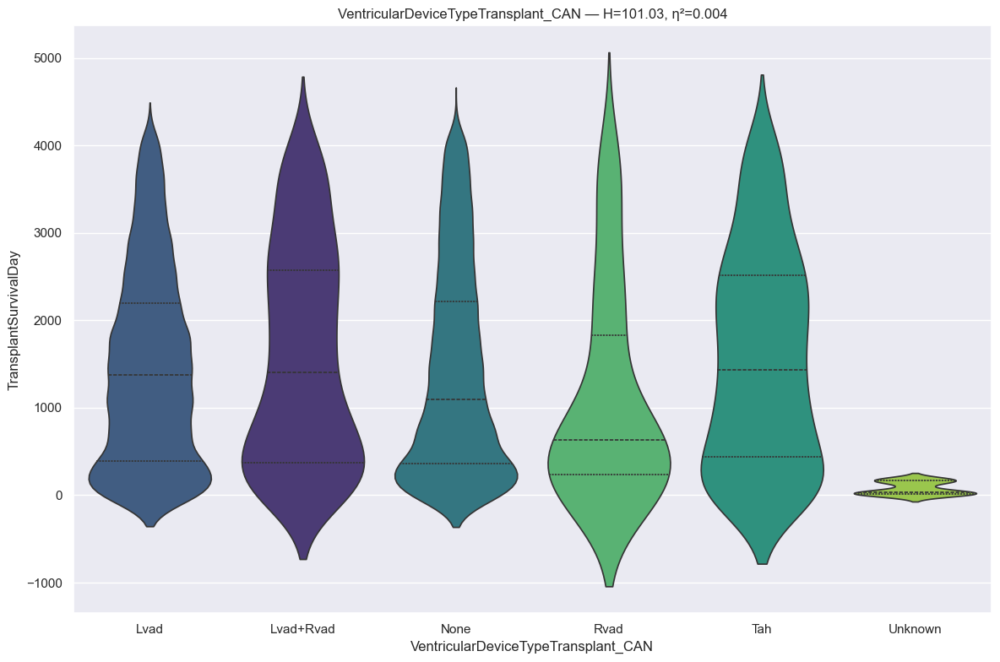

RANKING REPORT: VentricularDeviceTypeTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Lvad                                              :   9459 records
 * Lvad+Rvad                                         :    447 records
 * None                                              :  11947 records
 * Rvad                                              :     63 records
 * Tah                                               :    288 records
 * Unknown                                           :     32 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 101.0323 | P-value: 3.202315e-20 | Effect η²: 0.0043
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0033 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Lvad         vs Unknown      | p=1.5690e-16 | thr=0.0033 | r=-0.844 | *Sig*
None         vs Unknown      | p=3.6797e-16 | thr=0.0033 | r=-0.833 | *Sig*


In [260]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [261]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: VentricularDeviceTypeTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Lvad                                              :   9459 records
 * Lvad+Rvad                                         :    447 records
 * None                                              :  11947 records
 * Rvad                                              :     63 records
 * Tah                                               :    288 records
 * Unknown                                           :     32 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 101.0323 | P-value: 3.202315e-20 | Effect η²: 0.0043
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 4 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::

In [262]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Ventricular Device Brand Transplant

In [263]:
# info
feature = u.get_feature_info(df, 'VentricularDeviceBrandTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                      count unique      top   freq
VentricularDeviceBrandTransplant_CAN  22236     29  Unknown  11987

:::: NaN Count:
VentricularDeviceBrandTransplant_CAN    0 



{'VentricularDeviceBrandTransplant_CAN': CategoricalDtype(categories=['AbioCor', 'Abiomed AB5000', 'Abiomed BVS 5000',
                   'Berlin Heart EXCOR', 'Biomedicus',
                   'Cardiac Assist Protek Duo', 'Cardiac Assist Tandem Heart',
                   'CentriMag (Thoratec/Levitronix)', 'Evaheart',
                   'HeartMate III', 'Heartmate II', 'Heartmate XVE',
                   'Heartsaver VAD', 'Heartware HVAD', 'Impella CP',
                   'Impella RP', 'Impella Recover 2.5', 'Impella Recover 5.0',
                   'Jarvik 2000', 'Maquet Jostra Rotaflow', 'Other, Specify',
                   'SynCardia CardioWest', 'Terumo DuraHeart', 'Thoratec',
                   'Thoratec IVAD', 'Thoratec PVAD', 'Toyobo', 'Unknown',
                   'Ventracor VentrAssist', 'Worldheart Levacor'],
 , ordered=False, categories_dtype=str)}

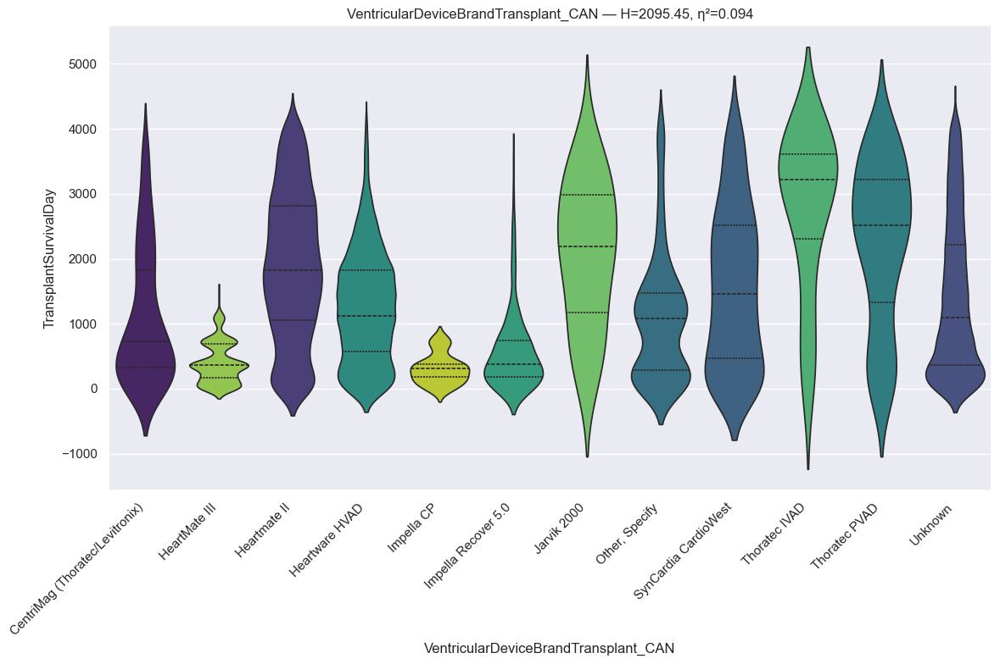

RANKING REPORT: VentricularDeviceBrandTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * CentriMag (Thoratec/Levitronix)                   :    192 records
 * HeartMate III                                     :   1075 records
 * Heartmate II                                      :   4999 records
 * Heartware HVAD                                    :   2486 records
 * Impella CP                                        :     56 records
 * Impella Recover 5.0                               :    279 records
 * Jarvik 2000                                       :     34 records
 * Other, Specify                                    :    625 records
 * SynCardia CardioWest                              :    271 records
 * Thoratec IVAD                                     :     30 records
 * Thoratec PVAD                                     :     76 records
 * Unknown                                           :  11987 records
BYPASSED CATEGORIES (n < min_n):
 * AbioCor                                  

In [264]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [265]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: VentricularDeviceBrandTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * CentriMag (Thoratec/Levitronix)                   :    192 records
 * HeartMate III                                     :   1075 records
 * Heartmate II                                      :   4999 records
 * Heartware HVAD                                    :   2486 records
 * Impella CP                                        :     56 records
 * Impella Recover 5.0                               :    279 records
 * Jarvik 2000                                       :     34 records
 * Other, Specify                                    :    625 records
 * SynCardia CardioWest                              :    271 records
 * Thoratec IVAD                                     :     30 records
 * Thoratec PVAD                                     :     76 records
 * Unknown                                           :  11987 records
BYPASSED CATEGORIES (n < min_n):
 * AbioCor                                  

In [266]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Ventilatory Support
* Ventilator support is a life-saving, temporary medical intervention for patients unable to breathe effectively on their own, often used in cases of severe respiratory failure, surgery, or underlying illness. It provides oxygen to the lungs and removes carbon dioxide using either a face mask (noninvasive) or a breathing tube (invasive).

In [267]:
# info
feature = u.get_feature_info(df, 'VentilatorySupport_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique top   freq
VentilatorySupport_CAN  22236      3  No  17638

:::: NaN Count:
VentilatorySupport_CAN    0 



{'VentilatorySupport_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

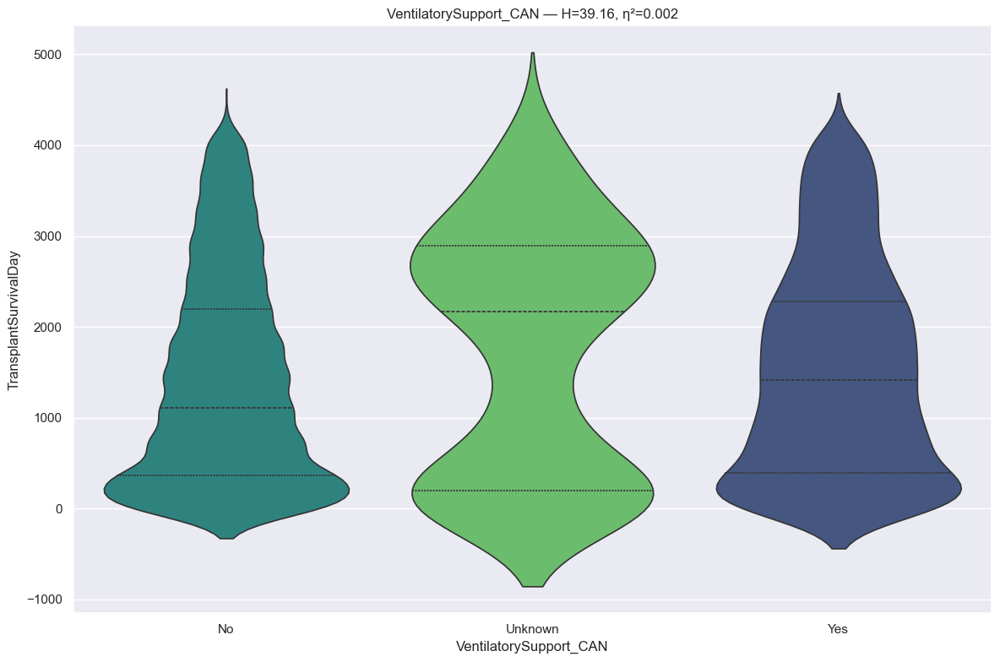

RANKING REPORT: VentilatorySupport_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  17638 records
 * Unknown                                           :    297 records
 * Yes                                               :   4301 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 39.1562 | P-value: 3.143004e-09 | Effect η²: 0.0017
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=7.2899e-08 | thr=0.0167 | r= 0.053 | *Sig*
No           vs Unknown      | p=6.3065e-04 | thr=0.0167 | r= 0.115 | *Sig*
Unknown      vs Yes          | p=1.6397e-02 | thr=0.0167 | r=-0.083 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group

In [268]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [269]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Ventilator Transplant
* Ventilator support is a life-saving, temporary medical intervention for patients unable to breathe effectively on their own, often used in cases of severe respiratory failure, surgery, or underlying illness. It provides oxygen to the lungs and removes carbon dioxide using either a face mask (noninvasive) or a breathing tube (invasive).

In [270]:
# info
feature = u.get_feature_info(df, 'VentilatorTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                          count unique top   freq
VentilatorTransplant_CAN  22236      2  No  21887

:::: NaN Count:
VentilatorTransplant_CAN    0 



{'VentilatorTransplant_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

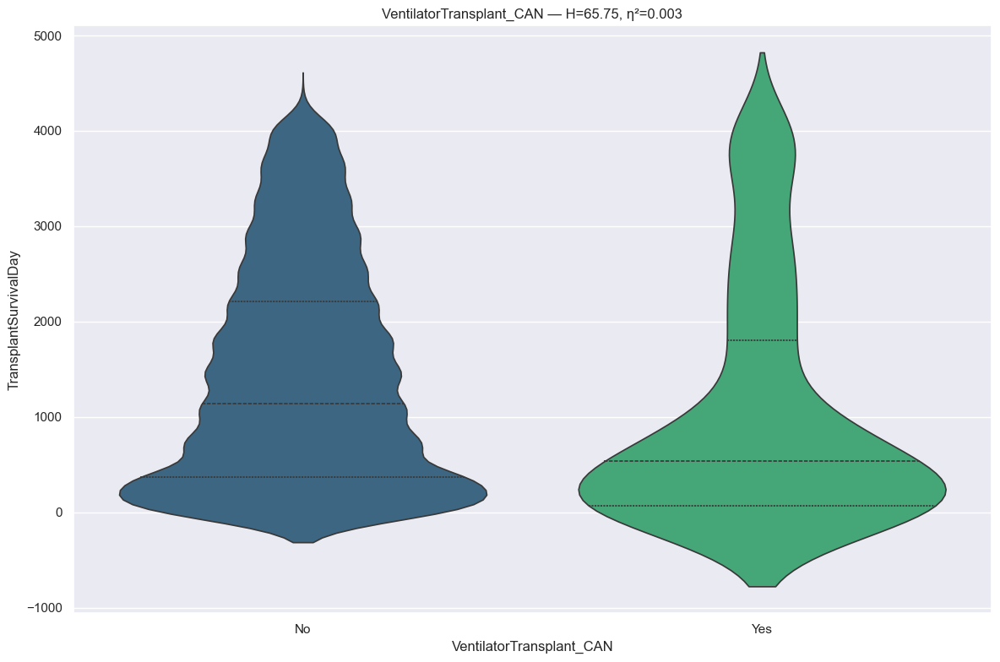

RANKING REPORT: VentilatorTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21887 records
 * Yes                                               :    349 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 65.7516 | P-value: 5.114936e-16 | Effect η²: 0.0029
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=5.1151e-16 | thr=0.0500 | r=-0.253 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

VentilatorTransplant_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                      No       

In [271]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [272]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Prior Cardiac Surgery Type List And Transplant

In [273]:
# info
feature = u.get_feature_info(df, 'PriorCardiacSurgeryTypeListAndTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                              count unique      top   freq
PriorCardiacSurgeryTypeListAndTransplant_CAN  22236     21  Unknown  16677

:::: NaN Count:
PriorCardiacSurgeryTypeListAndTransplant_CAN    0 



{'PriorCardiacSurgeryTypeListAndTransplant_CAN': CategoricalDtype(categories=['CABG', 'CABG; Congenital',
                   'CABG; Congenital; Other, specify',
                   'CABG; Left Vent. Remodeling', 'CABG; Other, specify',
                   'CABG; Valve Replace/Repair',
                   'CABG; Valve Replace/Repair; Congenital',
                   'CABG; Valve Replace/Repair; Congenital; Left Vent. Remodeling',
                   'CABG; Valve Replace/Repair; Other, specify', 'Congenital',
                   'Congenital; Left Vent. Remodeling; Other, specify',
                   'Congenital; Other, specify', 'Left Vent. Remodeling',
                   'Left Vent. Remodeling; Other, specify', 'Other, specify',
                   'Unknown', 'Valve Replace/Repair',
                   'Valve Replace/Repair; Congenital',
                   'Valve Replace/Repair; Congenital; Other, specify',
                   'Valve Replace/Repair; Left Vent. Remodeling',
                   'Va

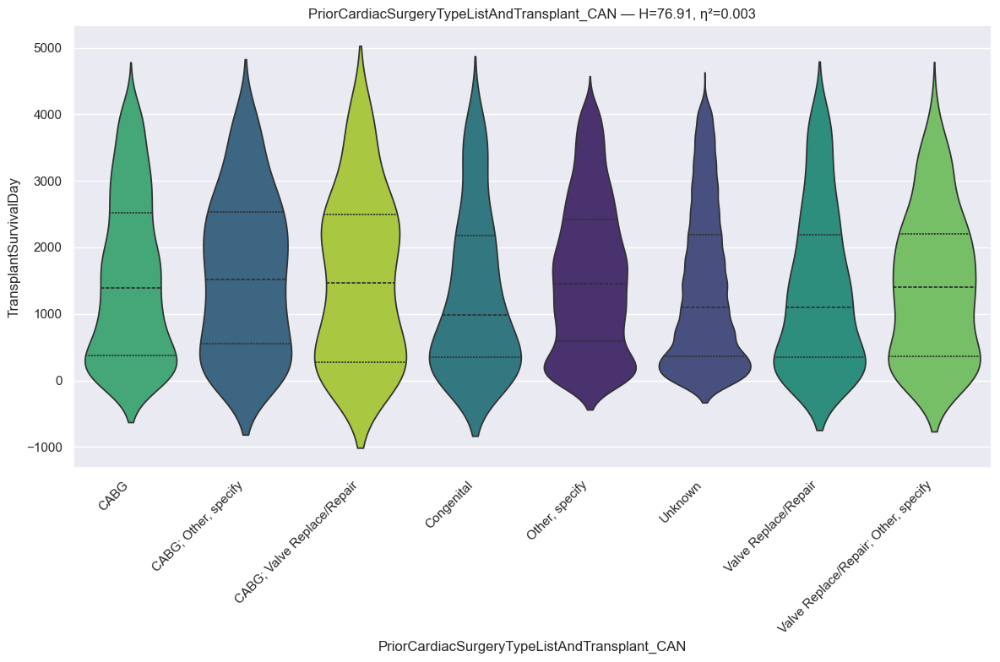

RANKING REPORT: PriorCardiacSurgeryTypeListAndTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * CABG                                              :    835 records
 * CABG; Other, specify                              :    182 records
 * CABG; Valve Replace/Repair                        :     83 records
 * Congenital                                        :    181 records
 * Other, specify                                    :   3675 records
 * Unknown                                           :  16677 records
 * Valve Replace/Repair                              :    322 records
 * Valve Replace/Repair; Other, specify              :    174 records
BYPASSED CATEGORIES (n < min_n):
 * CABG; Congenital                                  :      2 records
 * CABG; Congenital; Other, specify                  :      2 records
 * CABG; Left Vent. Remodeling                       :      1 records
 * CABG; Valve Replace/Repair; Congenital            :      2 records
 * CABG; Valve Replace/Repair; Conge

In [274]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [275]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PriorCardiacSurgeryTypeListAndTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * CABG                                              :    835 records
 * CABG; Other, specify                              :    182 records
 * CABG; Valve Replace/Repair                        :     83 records
 * Congenital                                        :    181 records
 * Other, specify                                    :   3675 records
 * Unknown                                           :  16677 records
 * Valve Replace/Repair                              :    322 records
 * Valve Replace/Repair; Other, specify              :    174 records
BYPASSED CATEGORIES (n < min_n):
 * CABG; Congenital                                  :      2 records
 * CABG; Congenital; Other, specify                  :      2 records
 * CABG; Left Vent. Remodeling                       :      1 records
 * CABG; Valve Replace/Repair; Congenital            :      2 records
 * CABG; Valve Replace/Repair; Conge

In [276]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Hepatitis B CoreAntibody
* A positive Hepatitis B core antibody (HBcAb or anti-HBc) test indicates exposure to the hepatitis B virus (HBV), either from a current or past infection. Unlike surface antibodies, it does not provide immunity. It is a critical marker for diagnosing acute, chronic, or resolved hepatitis B. 

In [277]:
# info
feature = u.get_feature_info(df, 'Hepatitis_B_CoreAntibody', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                              count unique       top   freq
Hepatitis_B_CoreAntibody_CAN  22236      4  Negative  20062

:::: NaN Count:
Hepatitis_B_CoreAntibody_CAN    0 



{'Hepatitis_B_CoreAntibody_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

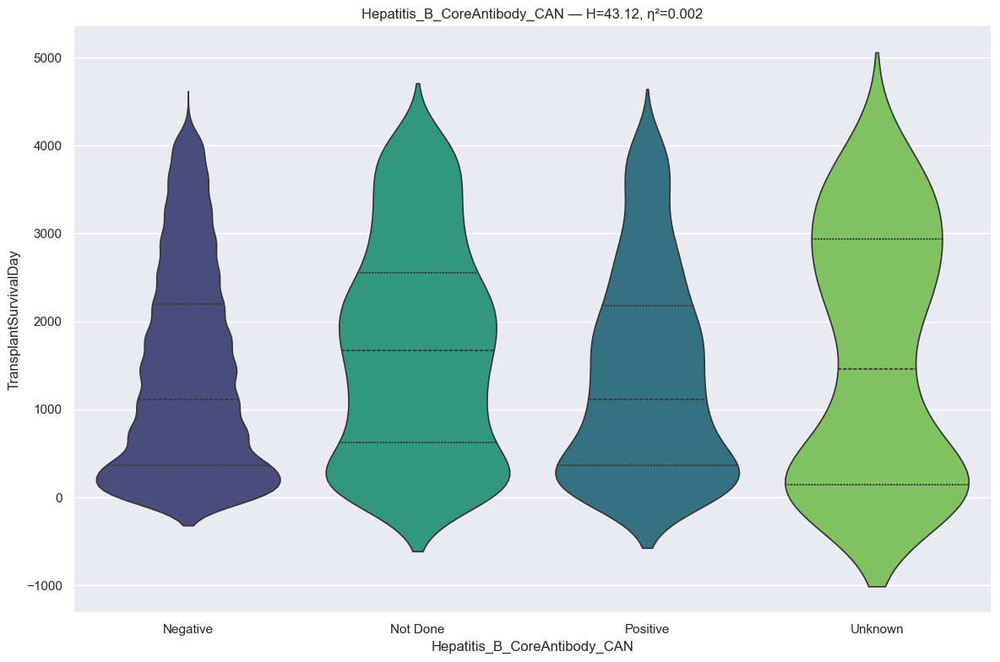

RANKING REPORT: Hepatitis_B_CoreAntibody_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  20062 records
 * Not Done                                          :    979 records
 * Positive                                          :   1033 records
 * Unknown                                           :    162 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 43.1167 | P-value: 2.324535e-09 | Effect η²: 0.0018
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Not Done     | p=9.8921e-11 | thr=0.0083 | r= 0.122 | *Sig*
Not Done     vs Positive     | p=1.2691e-07 | thr=0.0083 | r=-0.136 | *Sig*
Not Done     vs Unknown      | p=2.1311e-01 | thr=0.0083 | r=-0.061 | Not Sig
Positive     vs Unknown      | p=3.8901e-01 | thr=0.0083 | r= 0.042 | 

In [278]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [279]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: Hepatitis_B_CoreAntibody_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  20062 records
 * Not Done                                          :    979 records
 * Positive                                          :   1033 records
 * Unknown                                           :    162 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 43.1167 | P-value: 2.324535e-09 | Effect η²: 0.0018
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (3 categories)
  - Negative
  - Positive
  - Unknown

>>> Group_2 (1 categories)
  - Not Done



In [280]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Surface Antigen HEP B
* Hepatitis B surface antigen (HBsAg) is a protein on the surface of the hepatitis B virus, found in the blood during acute or chronic infections. A positive/reactive HBsAg test indicates an active Hepatitis B virus (HBV) infection, which can be transmitted through bodily fluids. It is often the first sign of infection and, if persistent for over 6 months, indicates chronic infection.

In [281]:
# info
feature = u.get_feature_info(df, 'SurfaceAntigenHEP_B', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                         count unique       top   freq
SurfaceAntigenHEP_B_CAN  22236      4  Negative  21465

:::: NaN Count:
SurfaceAntigenHEP_B_CAN    0 



{'SurfaceAntigenHEP_B_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

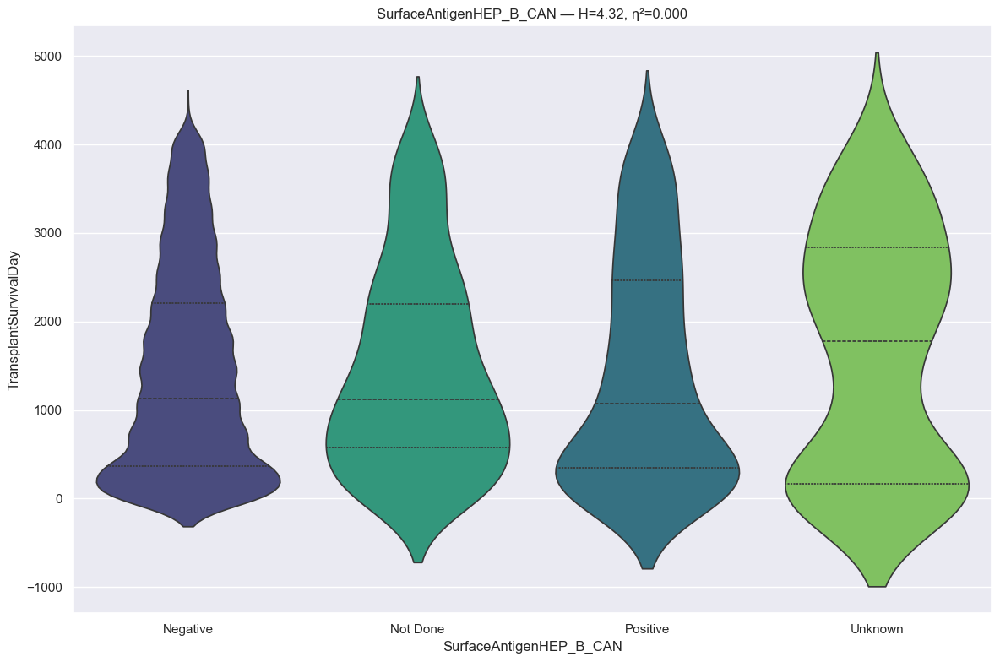

RANKING REPORT: SurfaceAntigenHEP_B_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  21465 records
 * Not Done                                          :    305 records
 * Positive                                          :    314 records
 * Unknown                                           :    152 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 4.3216 | P-value: 2.287663e-01 | Effect η²: 0.0001
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Not Done     vs Positive     | p=8.2971e-02 | thr=0.0083 | r=-0.081 | Not Sig
Negative     vs Positive     | p=9.5743e-02 | thr=0.0083 | r=-0.055 | Not Sig
Positive     vs Unknown      | p=2.2517e-01 | thr=0.0083 | r= 0.069 | Not Sig
Negative     vs Unknown      | p=2.9678e-01 | thr=0.0083 | r= 0.049 | No

In [282]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [283]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: SurfaceAntigenHEP_B_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  21465 records
 * Not Done                                          :    305 records
 * Positive                                          :    314 records
 * Unknown                                           :    152 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 4.3216 | P-value: 2.287663e-01 | Effect η²: 0.0001
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (3 categories)
  - Negative
  - Not Done
  - Unknown

>>> Group_2 (1 categories)
  - Positive



In [284]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Surface HBV Antibody Total Transplant
* The Hepatitis B Surface Antibody (anti-HBs or HBsAb) test measures immunity to the Hepatitis B virus (HBV) from vaccination or recovery. A level indicates protective immunity. Levels indicate susceptibility or lack of a response to vaccination.

In [285]:
# info
feature = u.get_feature_info(df, 'SurfaceHBVAntibodyTotalTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                       count unique       top   freq
SurfaceHBVAntibodyTotalTransplant_CAN  22236      4  Negative  10042

:::: NaN Count:
SurfaceHBVAntibodyTotalTransplant_CAN    0 



{'SurfaceHBVAntibodyTotalTransplant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

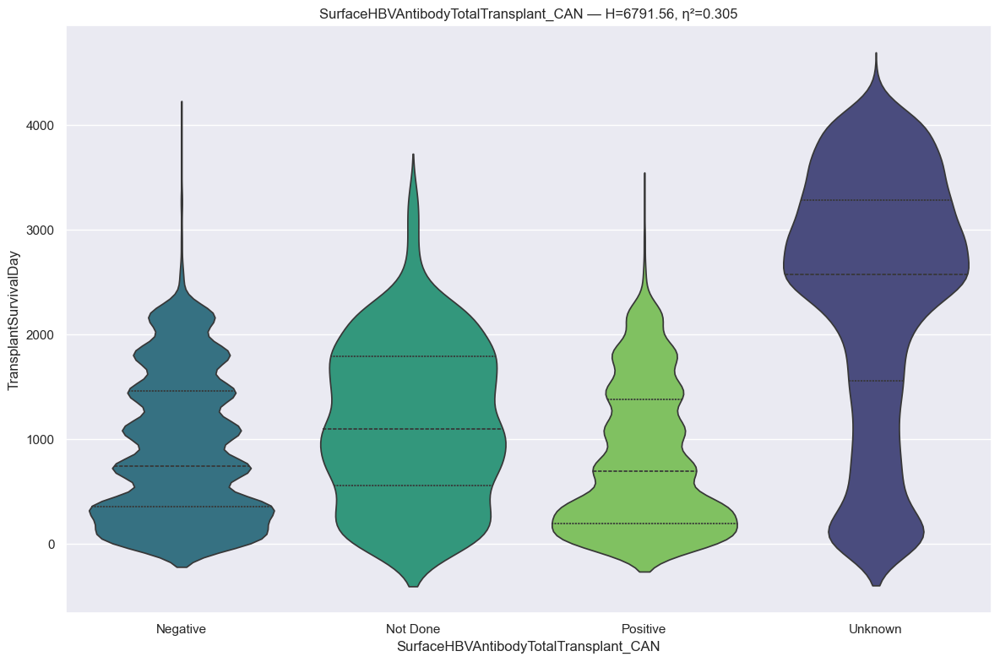

RANKING REPORT: SurfaceHBVAntibodyTotalTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  10042 records
 * Not Done                                          :    650 records
 * Positive                                          :   3360 records
 * Unknown                                           :   8184 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 6791.5609 | P-value: 0.000000e+00 | Effect η²: 0.3054
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Unknown      | p=0.0000e+00 | thr=0.0083 | r= 0.653 | *Sig*
Positive     vs Unknown      | p=0.0000e+00 | thr=0.0083 | r= 0.685 | *Sig*
Not Done     vs Unknown      | p=8.3892e-136 | thr=0.0083 | r= 0.584 | *Sig*
Not Done     vs Positive     | p=3.8019e-30 | thr=0.0083 | r

In [286]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [287]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### CMV Status Transplant
* CMV status indicates whether a person has been infected with Cytomegalovirus (CMV), a common herpes virus, measured by antibodies in the blood. CMV Positive (IgG+) means past or present infection, while CMV Negative (IgG-) means never infected. It is critical in pregnancy and transplants, as active infection (IgM+) can cause birth defects.

In [288]:
# info
feature = u.get_feature_info(df, 'CMVStatus_Transplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                          count unique       top   freq
CMVStatus_Transplant_CAN  22236      4  Positive  11915

:::: NaN Count:
CMVStatus_Transplant_CAN    0 



{'CMVStatus_Transplant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

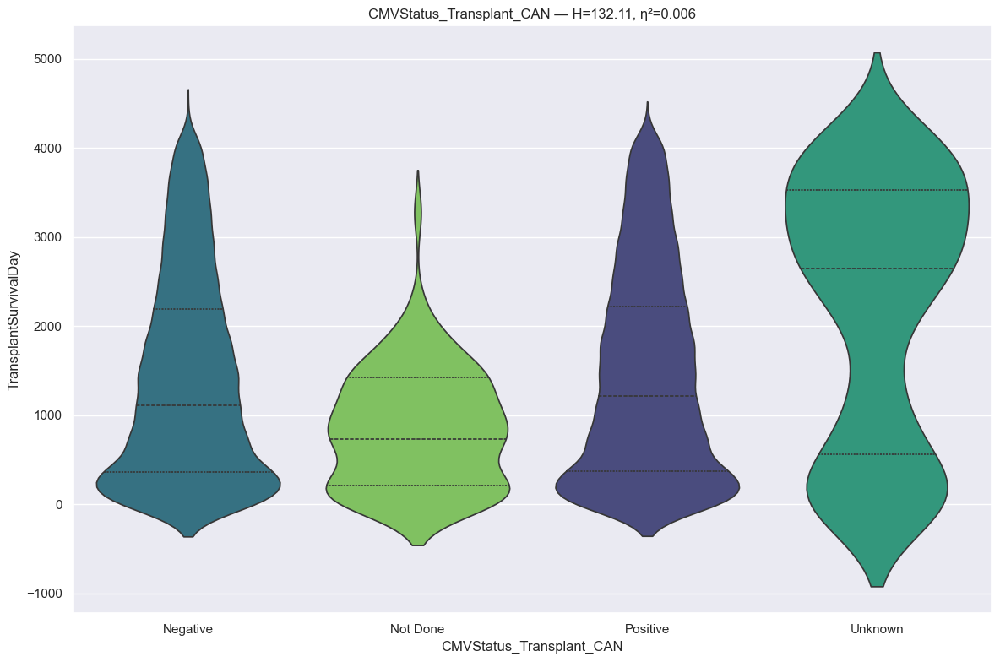

RANKING REPORT: CMVStatus_Transplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   9818 records
 * Not Done                                          :    177 records
 * Positive                                          :  11915 records
 * Unknown                                           :    326 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 132.1051 | P-value: 1.902758e-28 | Effect η²: 0.0058
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Unknown      | p=4.8470e-20 | thr=0.0083 | r= 0.298 | *Sig*
Not Done     vs Unknown      | p=1.5727e-18 | thr=0.0083 | r= 0.474 | *Sig*
Positive     vs Unknown      | p=3.6852e-18 | thr=0.0083 | r= 0.282 | *Sig*
Not Done     vs Positive     | p=7.4138e-11 | thr=0.0083 | r= 0.285 | *Sig*

In [289]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [290]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: CMVStatus_Transplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   9818 records
 * Not Done                                          :    177 records
 * Positive                                          :  11915 records
 * Unknown                                           :    326 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 132.1051 | P-value: 1.902758e-28 | Effect η²: 0.0058
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 4 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - Negative

>>> Group_2 (1 categories)
  - Not Done

>>> Group_3 (1 categories)
  - Positive



In [291]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### HIV Sero Status Transplant
* HIV serostatus is an individual's HIV infection status, classified as seropositive (having antibodies or antigens) or seronegative (not having them). Disclosure of serostatus to partners is a key prevention strategy that often increases social support, improves treatment adherence, and reduces transmission risks.

In [292]:
# info
feature = u.get_feature_info(df, 'HIV_SeroStatusTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                              count unique       top   freq
HIV_SeroStatusTransplant_CAN  22236      4  Negative  21534

:::: NaN Count:
HIV_SeroStatusTransplant_CAN    0 



{'HIV_SeroStatusTransplant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

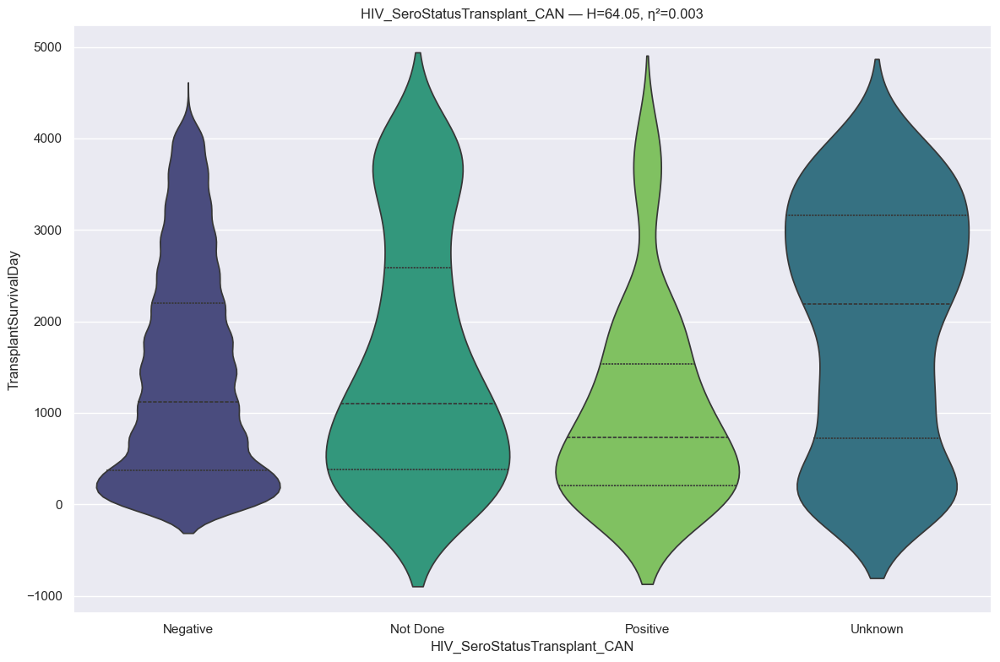

RANKING REPORT: HIV_SeroStatusTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  21534 records
 * Not Done                                          :    241 records
 * Positive                                          :     88 records
 * Unknown                                           :    373 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 64.0500 | P-value: 8.008388e-14 | Effect η²: 0.0027
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Unknown      | p=4.9632e-13 | thr=0.0083 | r= 0.218 | *Sig*
Positive     vs Unknown      | p=7.8810e-08 | thr=0.0083 | r= 0.368 | *Sig*
Negative     vs Positive     | p=9.4042e-04 | thr=0.0083 | r=-0.204 | *Sig*
Not Done     vs Unknown      | p=2.9635e-03 | thr=0.0083 | r= 0.142 | *S

In [293]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [294]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### HEP C Serostatus Status
* Hepatitis C (HCV) serostatus indicates whether a person has antibodies to the virus (seropositive) or not (seronegative). A positive antibody test suggests past or present infection, requiring a follow-up HCV RNA test to confirm current infection. While not always reflecting active disease, antibody status helps guide treatment. 

In [295]:
# info
feature = u.get_feature_info(df, 'HEP_C_SerostatusStatus', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                            count unique       top   freq
HEP_C_SerostatusStatus_CAN  22236      4  Negative  21218

:::: NaN Count:
HEP_C_SerostatusStatus_CAN    0 



{'HEP_C_SerostatusStatus_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

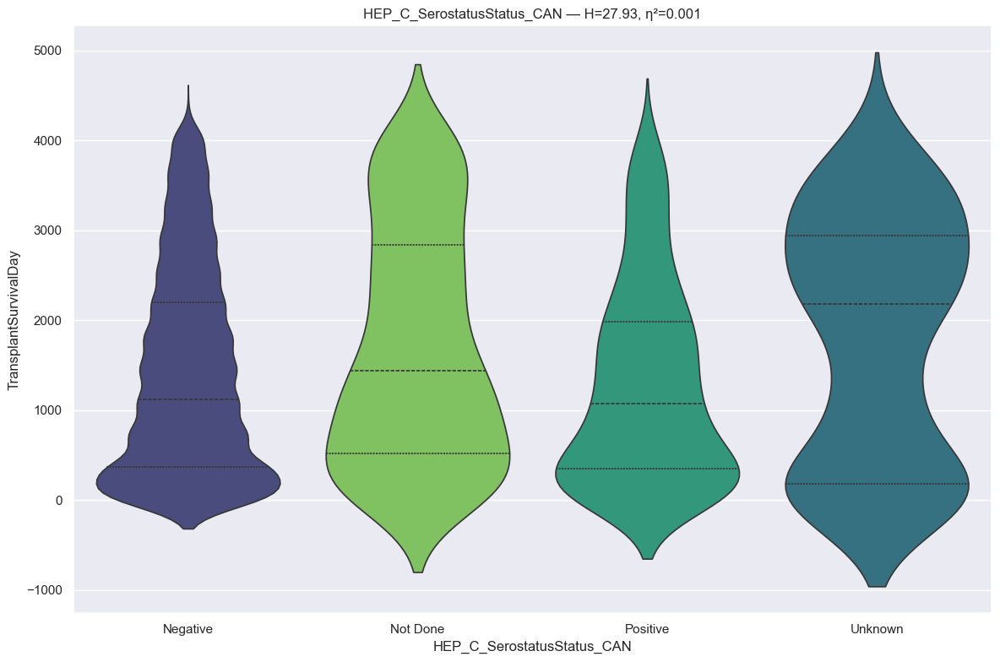

RANKING REPORT: HEP_C_SerostatusStatus_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  21218 records
 * Not Done                                          :    360 records
 * Positive                                          :    478 records
 * Unknown                                           :    180 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 27.9311 | P-value: 3.754943e-06 | Effect η²: 0.0011
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Not Done     vs Positive     | p=2.3285e-05 | thr=0.0083 | r=-0.171 | *Sig*
Positive     vs Unknown      | p=2.4762e-04 | thr=0.0083 | r= 0.185 | *Sig*
Negative     vs Not Done     | p=1.1133e-03 | thr=0.0083 | r= 0.100 | *Sig*
Negative     vs Unknown      | p=2.4903e-03 | thr=0.0083 | r= 0.131 | *Sig

In [296]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [297]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: HEP_C_SerostatusStatus_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  21218 records
 * Not Done                                          :    360 records
 * Positive                                          :    478 records
 * Unknown                                           :    180 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 27.9311 | P-value: 3.754943e-06 | Effect η²: 0.0011
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - Negative

>>> Group_2 (2 categories)
  - Not Done
  - Unknown

>>> Group_3 (1 categories)
 

In [298]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Epstein Barr Sero Status Transplant
* Epstein-Barr virus (EBV) serostatus indicates whether a person has been infected with EBV, which causes infectious mononucleosis and remains latent in the body. Over 90% of adults are seropositive, meaning they have antibodies (VCA or EBNA) from a past infection. Seronegative individuals are susceptible, while positive results define acute (IgM) or past (IgG) infection.

In [299]:
# info
feature = u.get_feature_info(df, 'EpsteinBarrSeroStatusTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                     count unique       top   freq
EpsteinBarrSeroStatusTransplant_CAN  22236      4  Positive  18187

:::: NaN Count:
EpsteinBarrSeroStatusTransplant_CAN    0 



{'EpsteinBarrSeroStatusTransplant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

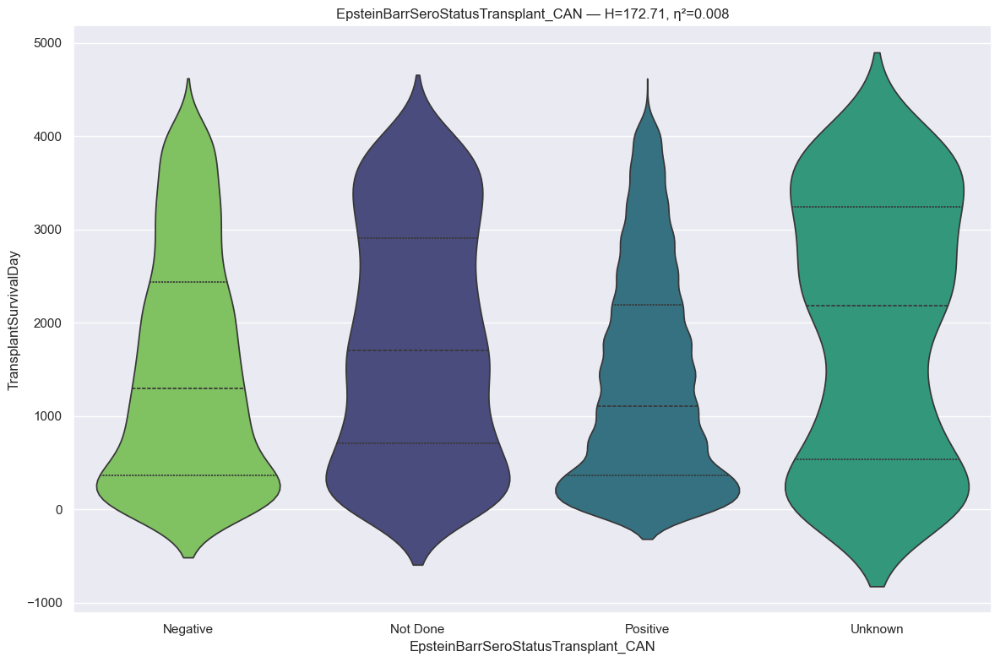

RANKING REPORT: EpsteinBarrSeroStatusTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   2283 records
 * Not Done                                          :   1345 records
 * Positive                                          :  18187 records
 * Unknown                                           :    421 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 172.7113 | P-value: 3.306062e-37 | Effect η²: 0.0076
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Not Done     vs Positive     | p=7.0163e-27 | thr=0.0083 | r=-0.175 | *Sig*
Positive     vs Unknown      | p=1.8365e-14 | thr=0.0083 | r= 0.218 | *Sig*
Negative     vs Not Done     | p=3.4065e-10 | thr=0.0083 | r= 0.125 | *Sig*
Negative     vs Unknown      | p=2.7590e-08 | thr=0.0083 | r= 0.

In [300]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [301]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: EpsteinBarrSeroStatusTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   2283 records
 * Not Done                                          :   1345 records
 * Positive                                          :  18187 records
 * Unknown                                           :    421 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 172.7113 | P-value: 3.306062e-37 | Effect η²: 0.0076
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 4 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - Negative

>>> Group_2 (1 categories)
  - Not Done

>>> Group_3 (1 categories)
  -

In [302]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### HIV NAT Pre Transplant
* HIV Nucleic Acid Testing (NAT) is highly recommended as part of baseline (pre) testing before starting HIV Pre-Exposure Prophylaxis (PrEP) to detect acute infection earlier than standard antibody/antigen tests, typically within 7–10 days of exposure. While often used at baseline, routine NAT is less commonly used for ongoing monitoring due to costs, but is essential for confirming negative status before starting oral or injectable PrEP to avoid potential drug resistance. 

In [303]:
# info
feature = u.get_feature_info(df, 'HIV_NAT_PreTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                           count unique      top   freq
HIV_NAT_PreTransplant_CAN  22236      4  Unknown  12782

:::: NaN Count:
HIV_NAT_PreTransplant_CAN    0 



{'HIV_NAT_PreTransplant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

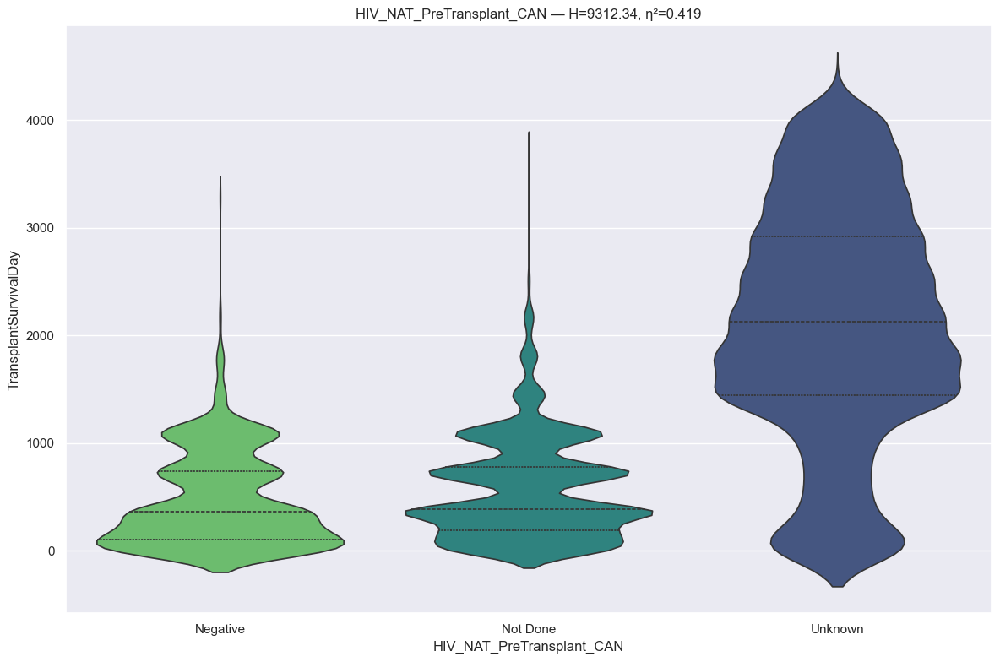

RANKING REPORT: HIV_NAT_PreTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   1559 records
 * Not Done                                          :   7890 records
 * Unknown                                           :  12782 records
BYPASSED CATEGORIES (n < min_n):
 * Positive                                          :      5 records
--------------------------------------------------------------------------------
Kruskal H: 9312.3352 | P-value: 0.000000e+00 | Effect η²: 0.4189
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Unknown      | p=0.0000e+00 | thr=0.0167 | r= 0.789 | *Sig*
Not Done     vs Unknown      | p=0.0000e+00 | thr=0.0167 | r= 0.748 | *Sig*
Negative     vs Not Done     | p=1.8280e-19 | thr=0.0167 | r= 0.144 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::

In [304]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [305]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### HCV NAT Pre-Transplant
* HCV NAT (Nucleic Acid Test) detects HCV RNA, identifying active hepatitis C infections 1–2 weeks post-infection, significantly reducing the "window period" compared to antibody-only tests. It is used to confirm positive antibody results, diagnose acute cases, and measure viral load for treatment monitoring.

In [306]:
# info
feature = u.get_feature_info(df, 'HCV_NAT_PreTranspant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                          count unique      top   freq
HCV_NAT_PreTranspant_CAN  22236      4  Unknown  12772

:::: NaN Count:
HCV_NAT_PreTranspant_CAN    0 



{'HCV_NAT_PreTranspant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

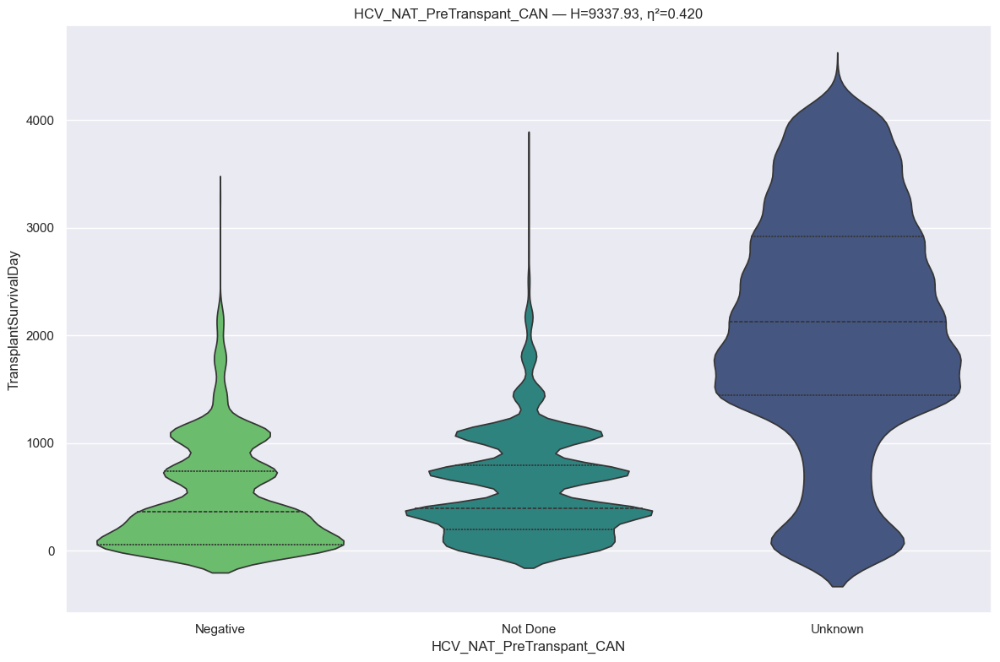

RANKING REPORT: HCV_NAT_PreTranspant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   2220 records
 * Not Done                                          :   7218 records
 * Unknown                                           :  12772 records
BYPASSED CATEGORIES (n < min_n):
 * Positive                                          :     26 records
--------------------------------------------------------------------------------
Kruskal H: 9337.9264 | P-value: 0.000000e+00 | Effect η²: 0.4204
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Unknown      | p=0.0000e+00 | thr=0.0167 | r= 0.782 | *Sig*
Not Done     vs Unknown      | p=0.0000e+00 | thr=0.0167 | r= 0.747 | *Sig*
Negative     vs Not Done     | p=6.9205e-35 | thr=0.0167 | r= 0.173 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

::::::::::

In [307]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [308]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### HBV NAT Result
* A Hepatitis B Virus Nucleic Acid Test (HBV NAT) measures the amount of viral DNA in the blood to detect active infections. A positive/reactive NAT indicates the virus is multiplying and the person is contagious, often used to monitor chronic infections or confirm early infection. A negative/nonreactive NAT means no virus was detected.

In [309]:
# info
feature = u.get_feature_info(df, 'HBV_NAT_Result', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                    count unique      top   freq
HBV_NAT_Result_CAN  22236      4  Unknown  12776

:::: NaN Count:
HBV_NAT_Result_CAN    0 



{'HBV_NAT_Result_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

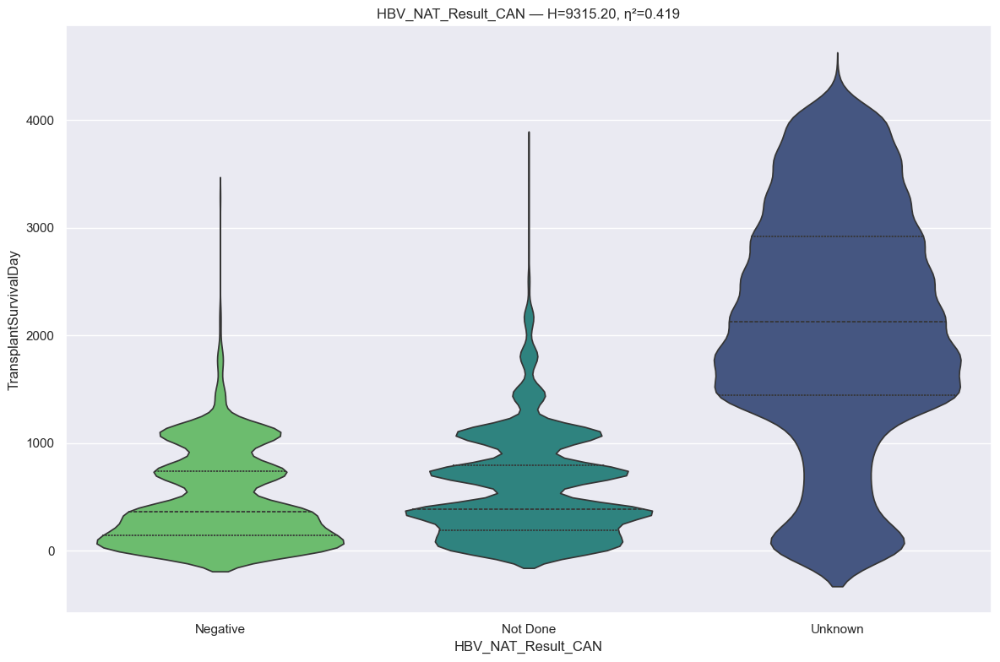

RANKING REPORT: HBV_NAT_Result_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   1709 records
 * Not Done                                          :   7737 records
 * Unknown                                           :  12776 records
BYPASSED CATEGORIES (n < min_n):
 * Positive                                          :     14 records
--------------------------------------------------------------------------------
Kruskal H: 9315.2048 | P-value: 0.000000e+00 | Effect η²: 0.4192
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Unknown      | p=0.0000e+00 | thr=0.0167 | r= 0.790 | *Sig*
Not Done     vs Unknown      | p=0.0000e+00 | thr=0.0167 | r= 0.747 | *Sig*
Negative     vs Not Done     | p=9.8705e-21 | thr=0.0167 | r= 0.144 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

::::::::::::::::

In [310]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [311]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Inhaled Registration
* Life support inhaled refers to mechanical ventilation or respiratory support that forces oxygen into the lungs when a patient cannot breathe adequately on their own, often using a ventilator connected via a tube in the mouth (intubation) or neck (tracheostomy). It is used for critical conditions such as pneumonia, acute respiratory distress, or surgery. 

In [312]:
# info
feature = u.get_feature_info(df, 'LifeSupportInhaledRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                    count unique top   freq
LifeSupportInhaledRegistration_CAN  22236      2  No  22191

:::: NaN Count:
LifeSupportInhaledRegistration_CAN    0 



{'LifeSupportInhaledRegistration_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

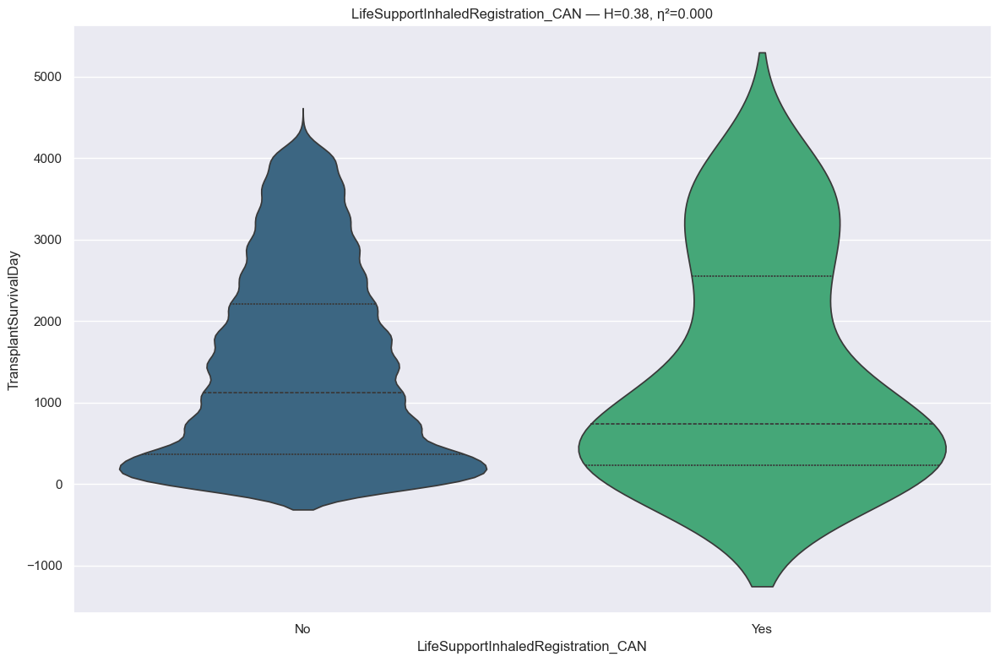

RANKING REPORT: LifeSupportInhaledRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  22191 records
 * Yes                                               :     45 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 0.3804 | P-value: 5.373664e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=5.3737e-01 | thr=0.0500 | r=-0.053 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

LifeSupportInhaledRegistration_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                                No    

In [313]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [314]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Previous Transplant Same Organ

In [315]:
# info
feature = u.get_feature_info(df, 'PreviousTransplantSameOrgan', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                 count unique top   freq
PreviousTransplantSameOrgan_CAN  22236      2  No  21672

:::: NaN Count:
PreviousTransplantSameOrgan_CAN    0 



{'PreviousTransplantSameOrgan_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

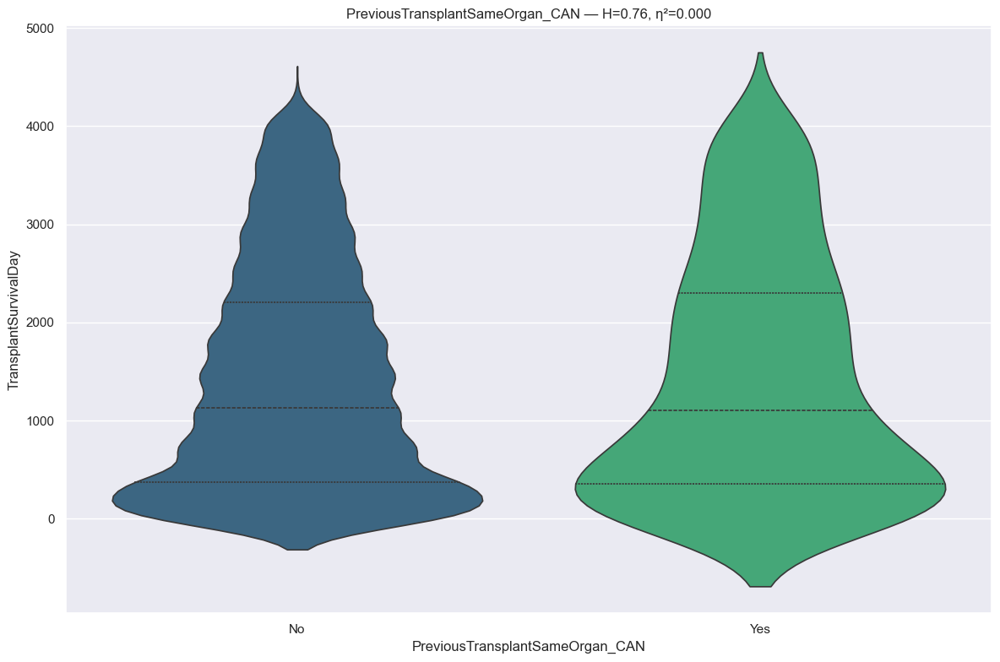

RANKING REPORT: PreviousTransplantSameOrgan_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21672 records
 * Yes                                               :    564 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 0.7585 | P-value: 3.838118e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=3.8381e-01 | thr=0.0500 | r=-0.021 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

PreviousTransplantSameOrgan_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                             No         1437

In [316]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [317]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature has a statistically significant but practically minimal impact on survival.

#### Previous Transplant Any Organ

In [318]:
# info
feature = u.get_feature_info(df, 'PreviousTransplantAnyOrgan', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                count unique top   freq
PreviousTransplantAnyOrgan_CAN  22236      2  No  21621

:::: NaN Count:
PreviousTransplantAnyOrgan_CAN    0 



{'PreviousTransplantAnyOrgan_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

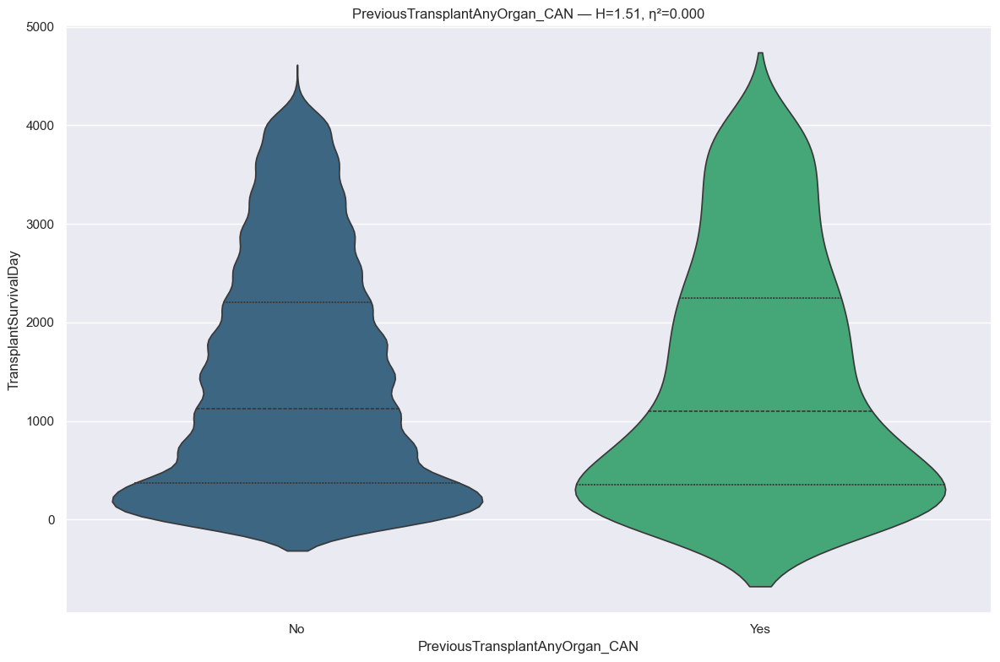

RANKING REPORT: PreviousTransplantAnyOrgan_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21621 records
 * Yes                                               :    615 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 1.5100 | P-value: 2.191345e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=2.1914e-01 | thr=0.0500 | r=-0.029 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

PreviousTransplantAnyOrgan_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                            No         1437.49

In [319]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [320]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature has a statistically significant but practically minimal impact on survival.

#### Antigen RA1
The Rheumatoid Arthritis Diagnostic Panel 1 (often referred to in the context of RA testing) combines Rheumatoid Factor (RF) and Anti-Cyclic Citrullinated Peptide (anti-CCP) antibodies to diagnose rheumatoid arthritis. Anti-CCP is highly specific (>90%) for RA, whereas RF is more sensitive but less specific. These tests help differentiate RA from other joint diseases.

In [321]:
# info
feature = u.get_feature_info(df, 'AntigenRA1', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top  freq
AntigenRA1_CAN  22236     46   2  7536

:::: NaN Count:
AntigenRA1_CAN    0 



{'AntigenRA1_CAN': CategoricalDtype(categories=['1', '10', '101', '102', '11', '1101', '2', '201', '202',
                   '203', '205', '206', '207', '210', '23', '24', '2402',
                   '2403', '25', '26', '2601', '28', '29', '2901', '2902', '3',
                   '30', '3001', '3002', '301', '302', '31', '32', '33', '3301',
                   '3303', '34', '3402', '36', '66', '6601', '6602', '68',
                   '6801', '6802', '69', '74', '80', 'No Antigen', 'Not Tested',
                   'Unknown'],
 , ordered=False, categories_dtype=str)}

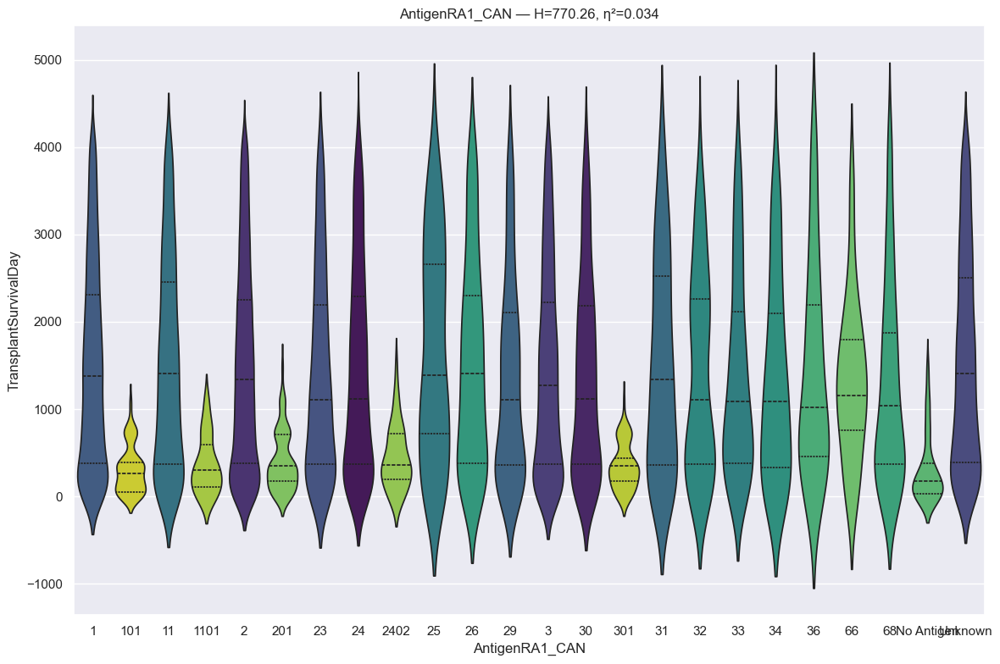

RANKING REPORT: AntigenRA1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :   4268 records
 * 101                                               :    179 records
 * 11                                                :   1086 records
 * 1101                                              :     39 records
 * 2                                                 :   7536 records
 * 201                                               :    259 records
 * 23                                                :    889 records
 * 24                                                :   1247 records
 * 2402                                              :     38 records
 * 25                                                :    140 records
 * 26                                                :    285 records
 * 29                                                :    373 records
 * 3                                                 :   2328 records
 * 30                        

In [322]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [323]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenRA1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :   4268 records
 * 101                                               :    179 records
 * 11                                                :   1086 records
 * 1101                                              :     39 records
 * 2                                                 :   7536 records
 * 201                                               :    259 records
 * 23                                                :    889 records
 * 24                                                :   1247 records
 * 2402                                              :     38 records
 * 25                                                :    140 records
 * 26                                                :    285 records
 * 29                                                :    373 records
 * 3                                                 :   2328 records
 * 30                        

In [324]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen RA2
* HLA-A2 (A2 antigen) is a common class I human leukocyte antigen (HLA) allele that frequently acts as a foreign transplantation antigen (alloantigen) in kidney and pancreas transplants, triggering recipient T-cell responses. Donor-specific sHLA-A2 levels in recipient serum are used to monitor for rejection, with elevated levels indicating potential damage. 

In [325]:
# info
feature = u.get_feature_info(df, 'AntigenRA2', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top  freq
AntigenRA2_CAN  22236     51  24  2132

:::: NaN Count:
AntigenRA2_CAN    0 



{'AntigenRA2_CAN': CategoricalDtype(categories=['1', '10', '101', '11', '1101', '1102', '2', '201', '202',
                   '203', '205', '23', '24', '2402', '2403', '25', '26', '2601',
                   '28', '29', '2901', '2902', '3', '30', '3001', '3002', '301',
                   '302', '31', '32', '33', '3301', '3303', '34', '3401',
                   '3402', '36', '43', '66', '6601', '6602', '68', '6801',
                   '6802', '69', '74', '80', '9', '98', 'No Antigen',
                   'Not Tested', 'Unknown'],
 , ordered=False, categories_dtype=str)}

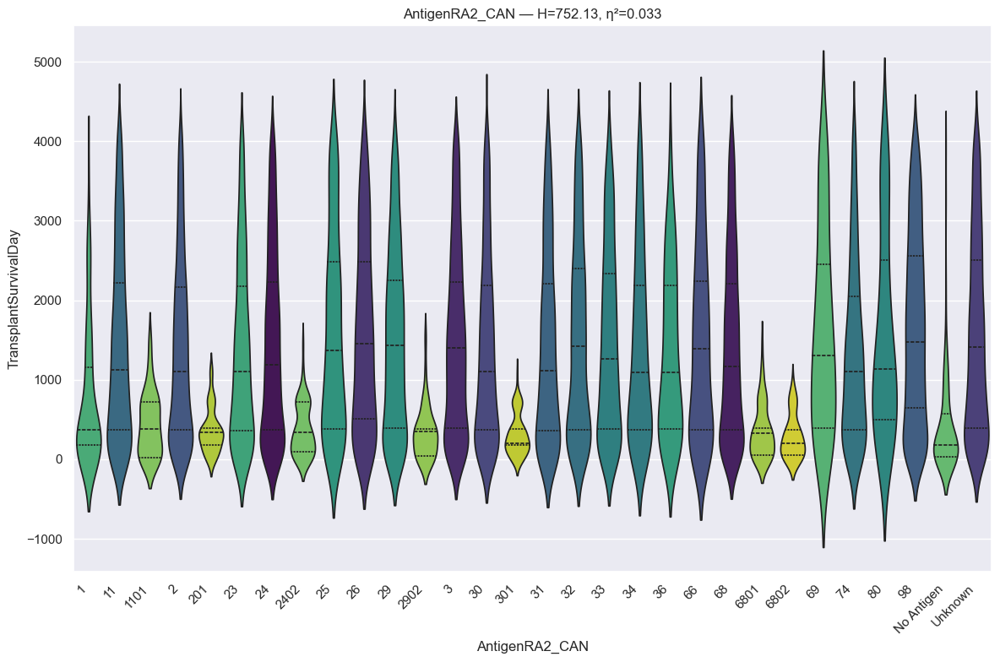

RANKING REPORT: AntigenRA2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :    128 records
 * 11                                                :   1148 records
 * 1101                                              :     48 records
 * 2                                                 :   1813 records
 * 201                                               :     95 records
 * 23                                                :    796 records
 * 24                                                :   2132 records
 * 2402                                              :     73 records
 * 25                                                :    411 records
 * 26                                                :    760 records
 * 29                                                :    923 records
 * 2902                                              :     39 records
 * 3                                                 :   1961 records
 * 30                        

In [326]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [327]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenRA2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :    128 records
 * 11                                                :   1148 records
 * 1101                                              :     48 records
 * 2                                                 :   1813 records
 * 201                                               :     95 records
 * 23                                                :    796 records
 * 24                                                :   2132 records
 * 2402                                              :     73 records
 * 25                                                :    411 records
 * 26                                                :    760 records
 * 29                                                :    923 records
 * 2902                                              :     39 records
 * 3                                                 :   1961 records
 * 30                        

In [328]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen RB1
* HLA-DRB1 matching in transplant medicine refers to identifying compatibility between donor and recipient to reduce the risk of graft-versus-host disease (GVHD) and improve survival, particularly in stem cell transplantation. DRB1 is a crucial locus within the human leukocyte antigen (HLA) system. Matching these alleles is essential for minimizing immune-mediated organ rejection. 

In [329]:
# info
feature = u.get_feature_info(df, 'AntigenRB1', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top  freq
AntigenRB1_CAN  22236     93   7  3813

:::: NaN Count:
AntigenRB1_CAN    0 



{'AntigenRB1_CAN': CategoricalDtype(categories=['12', '13', '1301', '1302', '14', '1401', '1402', '15',
                   '1501', '1502',
                   ...
                   '76', '77', '78', '8', '801', '81', '82', 'No Antigen',
                   'Not Tested', 'Unknown'],
 , ordered=False, categories_dtype=str)}

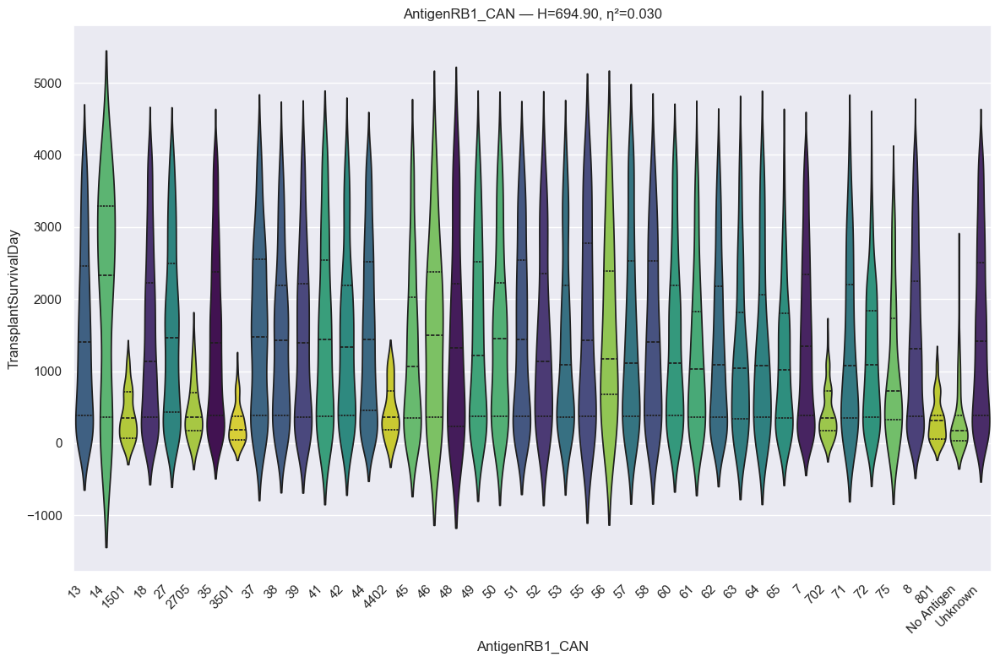

RANKING REPORT: AntigenRB1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 13                                                :    680 records
 * 14                                                :     31 records
 * 1501                                              :     49 records
 * 18                                                :   1192 records
 * 27                                                :    866 records
 * 2705                                              :     31 records
 * 35                                                :   2417 records
 * 3501                                              :     42 records
 * 37                                                :    207 records
 * 38                                                :    356 records
 * 39                                                :    417 records
 * 41                                                :    209 records
 * 42                                                :    305 records
 * 44                        

In [330]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [331]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenRB1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 13                                                :    680 records
 * 14                                                :     31 records
 * 1501                                              :     49 records
 * 18                                                :   1192 records
 * 27                                                :    866 records
 * 2705                                              :     31 records
 * 35                                                :   2417 records
 * 3501                                              :     42 records
 * 37                                                :    207 records
 * 38                                                :    356 records
 * 39                                                :    417 records
 * 41                                                :    209 records
 * 42                                                :    305 records
 * 44                        

In [332]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen RB2
* Antibody-mediated rejection (ABMR) in transplants occurs when the recipient’s immune system forms antibodies against donor antigens (such as HLA or RBC antigens), triggering inflammation and tissue injury. It is categorized as hyperacute, acute, or chronic, requiring immunosuppression and close monitoring for donor-specific antibodies (DSA).

In [333]:
# info
feature = u.get_feature_info(df, 'AntigenRB2', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top  freq
AntigenRB2_CAN  22236     94  44  2752

:::: NaN Count:
AntigenRB2_CAN    0 



{'AntigenRB2_CAN': CategoricalDtype(categories=['13', '1302', '14', '1401', '1402', '15', '1501', '1502',
                   '1503', '1510', '1516', '1517', '1518', '16', '18', '27',
                   '2703', '2704', '2705', '2708', '35', '3501', '3502', '3503',
                   '3508', '3512', '37', '38', '3801', '39', '3901', '3902',
                   '3905', '3906', '40', '4001', '4002', '4005', '4006', '41',
                   '4101', '4102', '42', '4201', '4202', '44', '4402', '4403',
                   '45', '46', '47', '48', '4801', '49', '5', '50', '5001',
                   '5002', '51', '5101', '5102', '52', '53', '54', '55', '5501',
                   '56', '5601', '57', '5701', '5703', '58', '59', '60', '61',
                   '62', '63', '64', '65', '67', '7', '70', '702', '71', '72',
                   '73', '75', '76', '77', '78', '8', '801', '81', '82', '8201',
                   '98', 'No Antigen', 'Not Tested', 'Unknown'],
 , ordered=False, categories_dtype=str)}

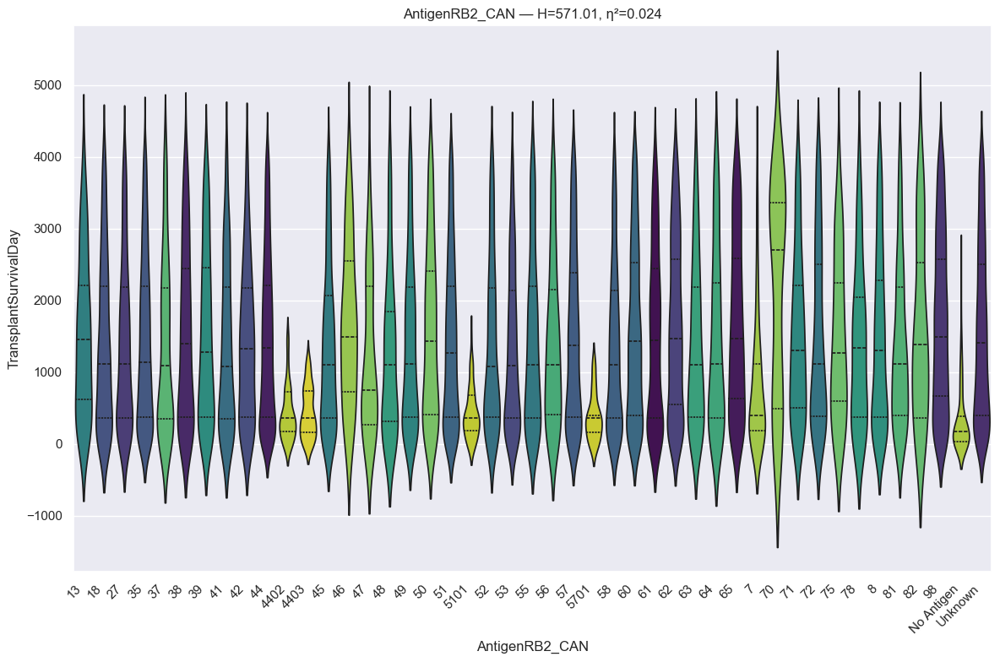

RANKING REPORT: AntigenRB2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 13                                                :    158 records
 * 18                                                :    449 records
 * 27                                                :    430 records
 * 35                                                :   1379 records
 * 37                                                :    203 records
 * 38                                                :    333 records
 * 39                                                :    380 records
 * 41                                                :    241 records
 * 42                                                :    214 records
 * 44                                                :   2752 records
 * 4402                                              :     92 records
 * 4403                                              :     76 records
 * 45                                                :    424 records
 * 46                        

In [334]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [335]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenRB2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 13                                                :    158 records
 * 18                                                :    449 records
 * 27                                                :    430 records
 * 35                                                :   1379 records
 * 37                                                :    203 records
 * 38                                                :    333 records
 * 39                                                :    380 records
 * 41                                                :    241 records
 * 42                                                :    214 records
 * 44                                                :   2752 records
 * 4402                                              :     92 records
 * 4403                                              :     76 records
 * 45                                                :    424 records
 * 46                        

In [336]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen RDR1
1. Recipient HLA-DR1 Antigen (RDR1) in Transplant Risk
In the context of transplant immunology, RDR1 refers to the Recipient HLA-DR1 allele.
Malignancy Risk: Studies have shown that the presence of the HLA-DR1 antigen in transplant recipients (RDR1) is a significant predictor of post-transplant malignancies, particularly non-melanoma skin cancers.
Predictive Modeling: Machine learning models have shown that a lower frequency of HLA-DR1 in transplant recipients is associated with a reduced risk of developing these cancers.
Context: This is often analyzed in lung transplant recipients and other solid-organ transplant recipients, where long-term immunosuppression is required. 
2. Plant RDR1 in Cancer Treatment (Xenograft Model) 
A different "RDR1" (RNA-dependent RNA polymerase 1) from plants has been studied for its potential in treating cancer, which can affect transplant patients. 
Antitumor Mechanism: Plant RDR1 has been used in research to boost miRNA expression in cancer cells, inhibiting tumor growth.
Application: Researchers have successfully delivered plant RDR1 into human cancer cell lines, demonstrating its ability to inhibit growth across various solid and blood cancers, suggesting it is a potential new therapeutic agent. 

In [337]:
# info
feature = u.get_feature_info(df, 'AntigenRDR1', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                 count unique top  freq
AntigenRDR1_CAN  22236     53   4  4356

:::: NaN Count:
AntigenRDR1_CAN    0 



{'AntigenRDR1_CAN': CategoricalDtype(categories=['0', '1', '10', '101', '102', '103', '10300', '11', '1101',
                   '1104', '12', '1201', '1202', '13', '1301', '1302', '1303',
                   '1305', '14', '1401', '1404', '1454', '15', '1501', '1502',
                   '1503', '16', '1601', '1602', '17', '18', '2', '3', '301',
                   '302', '4', '401', '402', '403', '404', '405', '406', '407',
                   '411', '5', '6', '7', '8', '801', '802', '9', '901', '99',
                   'Unknown'],
 , ordered=False, categories_dtype=str)}

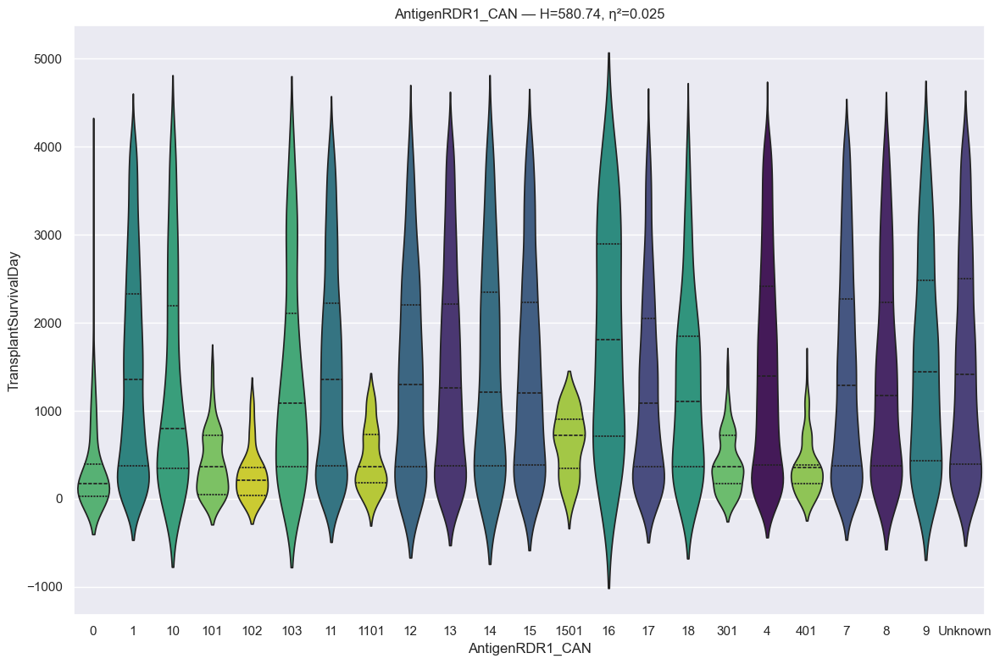

RANKING REPORT: AntigenRDR1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :    121 records
 * 1                                                 :   3036 records
 * 10                                                :    288 records
 * 101                                               :     81 records
 * 102                                               :     33 records
 * 103                                               :    228 records
 * 11                                                :   2181 records
 * 1101                                              :     54 records
 * 12                                                :    400 records
 * 13                                                :   1616 records
 * 14                                                :    317 records
 * 15                                                :    929 records
 * 1501                                              :     31 records
 * 16                       

In [338]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [339]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenRDR1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :    121 records
 * 1                                                 :   3036 records
 * 10                                                :    288 records
 * 101                                               :     81 records
 * 102                                               :     33 records
 * 103                                               :    228 records
 * 11                                                :   2181 records
 * 1101                                              :     54 records
 * 12                                                :    400 records
 * 13                                                :   1616 records
 * 14                                                :    317 records
 * 15                                                :    929 records
 * 1501                                              :     31 records
 * 16                       

In [340]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen RDR2
* RDR2 is a minor histocompatibility antigen (MiHA)-specific cytotoxic T-cell clone (CTL), frequently associated with the human ATP-dependent interferon-responsive (ADIR) gene. It was isolated from a multiple myeloma (MM) patient who experienced a complete remission after receiving a donor lymphocyte infusion (DLI) following an allogeneic stem cell transplant (alloSCT).

In [341]:
# info
feature = u.get_feature_info(df, 'AntigenRDR2', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                 count unique top  freq
AntigenRDR2_CAN  22236     55  15  4323

:::: NaN Count:
AntigenRDR2_CAN    0 



{'AntigenRDR2_CAN': CategoricalDtype(categories=['0', '1', '10', '101', '102', '103', '10300', '11', '1101',
                   '1103', '1104', '12', '1201', '1202', '13', '1301', '1302',
                   '1303', '1305', '14', '1401', '1402', '1403', '1404', '1406',
                   '1454', '15', '1501', '1502', '1503', '16', '1601', '1602',
                   '17', '18', '2', '3', '301', '302', '4', '401', '402', '403',
                   '404', '405', '407', '411', '7', '8', '801', '802', '803',
                   '9', '901', '98', '99', 'Unknown'],
 , ordered=False, categories_dtype=str)}

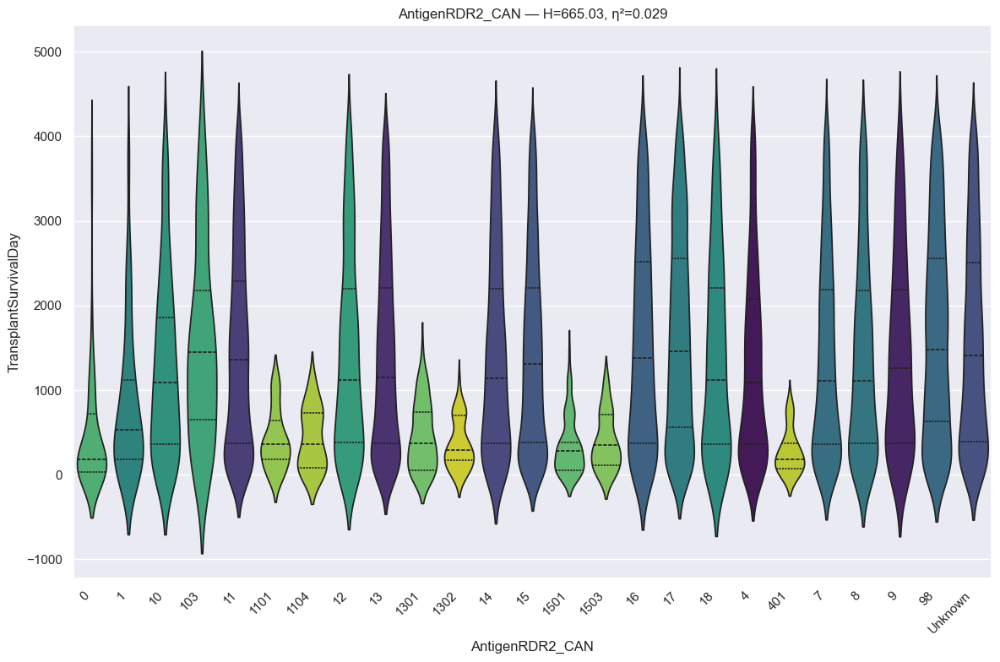

RANKING REPORT: AntigenRDR2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :    137 records
 * 1                                                 :    103 records
 * 10                                                :    252 records
 * 103                                               :     87 records
 * 11                                                :   2206 records
 * 1101                                              :     43 records
 * 1104                                              :     30 records
 * 12                                                :    611 records
 * 13                                                :   3050 records
 * 1301                                              :     61 records
 * 1302                                              :     44 records
 * 14                                                :   1005 records
 * 15                                                :   4323 records
 * 1501                     

In [342]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [343]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenRDR2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :    137 records
 * 1                                                 :    103 records
 * 10                                                :    252 records
 * 103                                               :     87 records
 * 11                                                :   2206 records
 * 1101                                              :     43 records
 * 1104                                              :     30 records
 * 12                                                :    611 records
 * 13                                                :   3050 records
 * 1301                                              :     61 records
 * 1302                                              :     44 records
 * 14                                                :   1005 records
 * 15                                                :   4323 records
 * 1501                     

In [344]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Malignancy Between Registration Transplant

In [345]:
# info
feature = u.get_feature_info(df, 'MalignancyBetweenRegistrationTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                             count unique      top   freq
MalignancyBetweenRegistrationTransplant_CAN  22236      3  Unknown  14543

:::: NaN Count:
MalignancyBetweenRegistrationTransplant_CAN    0 



{'MalignancyBetweenRegistrationTransplant_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

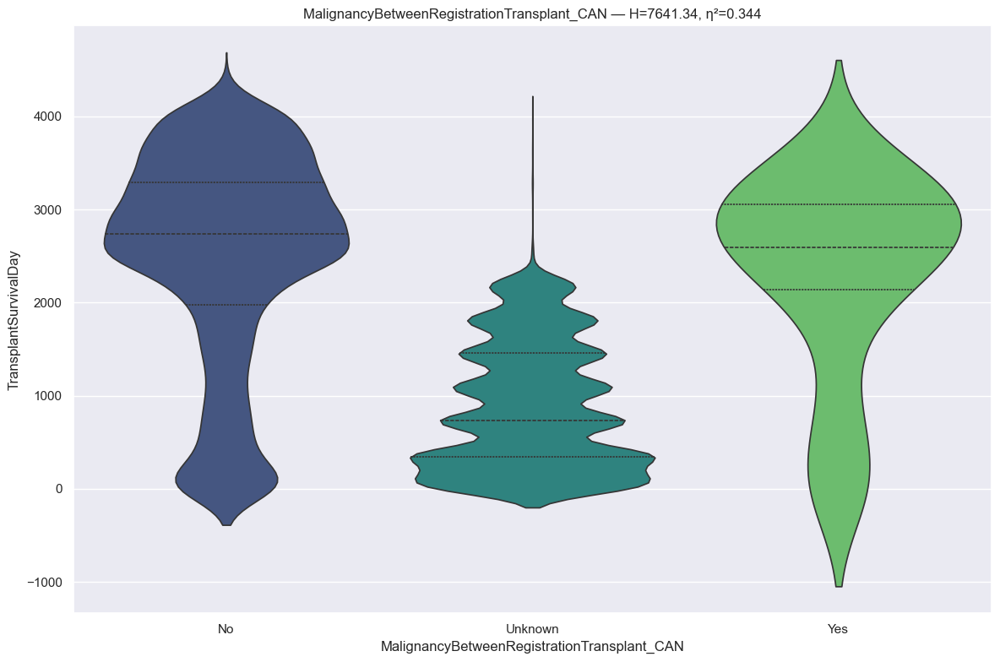

RANKING REPORT: MalignancyBetweenRegistrationTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7657 records
 * Unknown                                           :  14543 records
 * Yes                                               :     36 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 7641.3436 | P-value: 0.000000e+00 | Effect η²: 0.3436
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=0.0000e+00 | thr=0.0167 | r=-0.712 | *Sig*
Unknown      vs Yes          | p=1.0226e-12 | thr=0.0167 | r= 0.687 | *Sig*
No           vs Yes          | p=2.1482e-01 | thr=0.0167 | r=-0.120 | Not Sig
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::

In [346]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [347]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### CMV IGG Transplant
* A CMV IgG test detects antibodies indicating past or present infection with Cytomegalovirus, a common herpes virus. Positive results usually show prior exposure and immunity, while rising IgG levels in paired samples indicate an active or recent infection. It is crucial for assessing risk in pregnant women and immunocompromised individuals

In [348]:
# info
feature = u.get_feature_info(df, 'CMV_IGG_Transplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique      top   freq
CMV_IGG_Transplant_CAN  22236      4  Unknown  14535

:::: NaN Count:
CMV_IGG_Transplant_CAN    0 



{'CMV_IGG_Transplant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

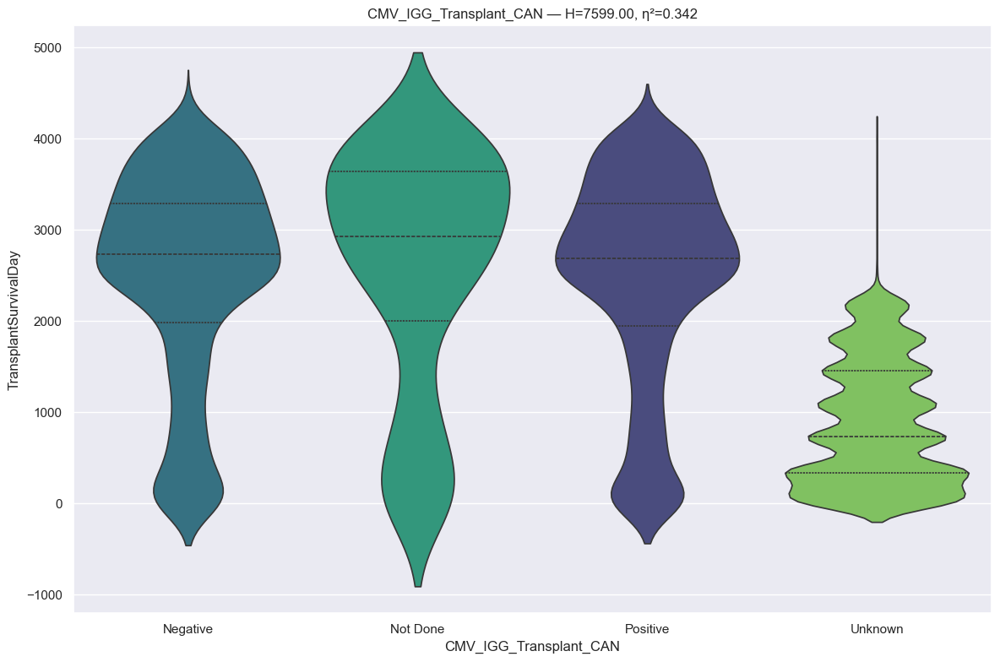

RANKING REPORT: CMV_IGG_Transplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   3209 records
 * Not Done                                          :    205 records
 * Positive                                          :   4287 records
 * Unknown                                           :  14535 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 7599.0027 | P-value: 0.000000e+00 | Effect η²: 0.3417
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Unknown      | p=0.0000e+00 | thr=0.0083 | r=-0.717 | *Sig*
Positive     vs Unknown      | p=0.0000e+00 | thr=0.0083 | r=-0.706 | *Sig*
Not Done     vs Unknown      | p=2.5310e-59 | thr=0.0083 | r=-0.660 | *Sig*
Not Done     vs Positive     | p=1.0815e-02 | thr=0.0083 | r=-0.105 | Not Si

In [349]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [350]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: CMV_IGG_Transplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   3209 records
 * Not Done                                          :    205 records
 * Positive                                          :   4287 records
 * Unknown                                           :  14535 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 7599.0027 | P-value: 0.000000e+00 | Effect η²: 0.3417
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - Negative
  - Positive

>>> Group_2 (1 categories)
  - Not Done

>>> Group_3 (1 categories)
  

In [351]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### CMV IGM Transplant
* CMV IgM is an antibody test detecting the body’s initial immune response to a recent or active Cytomegalovirus (CMV) infection, with levels typically rising 1–2 weeks after exposure. A positive result indicates current infection or reactivation, though IgM can persist for months. It is often used to diagnose primary infection, especially in pregnancy.

In [352]:
# info
feature = u.get_feature_info(df, 'CMV_IGM_Transplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique      top   freq
CMV_IGM_Transplant_CAN  22236      4  Unknown  14645

:::: NaN Count:
CMV_IGM_Transplant_CAN    0 



{'CMV_IGM_Transplant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

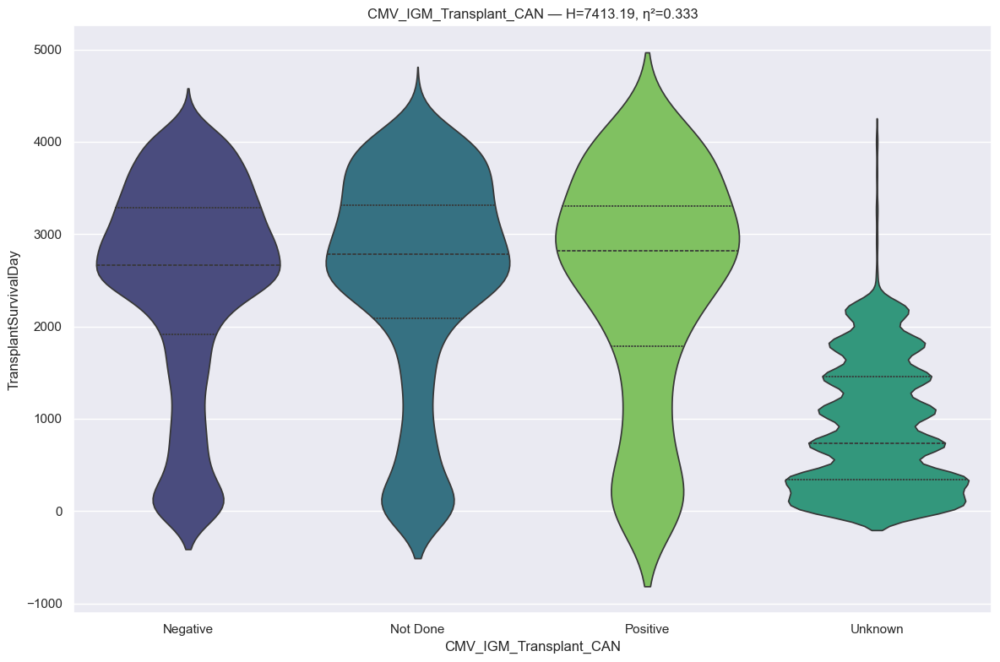

RANKING REPORT: CMV_IGM_Transplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   5220 records
 * Not Done                                          :   2105 records
 * Positive                                          :    266 records
 * Unknown                                           :  14645 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 7413.1877 | P-value: 0.000000e+00 | Effect η²: 0.3333
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Unknown      | p=0.0000e+00 | thr=0.0083 | r=-0.706 | *Sig*
Not Done     vs Unknown      | p=0.0000e+00 | thr=0.0083 | r=-0.702 | *Sig*
Positive     vs Unknown      | p=7.8684e-76 | thr=0.0083 | r=-0.658 | *Sig*
Negative     vs Not Done     | p=3.0586e-02 | thr=0.0083 | r= 0.032 | Not Si

In [353]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [354]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: CMV_IGM_Transplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   5220 records
 * Not Done                                          :   2105 records
 * Positive                                          :    266 records
 * Unknown                                           :  14645 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 7413.1877 | P-value: 0.000000e+00 | Effect η²: 0.3333
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (3 categories)
  - Negative
  - Not Done
  - Positive

>>> Group_2 (1 categories)
  - Unknown



In [355]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Transplant Type

In [356]:
# info
feature = u.get_feature_info(df, 'TransplantType', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                    count unique top   freq
TransplantType_CAN  22236      3   O  22185

:::: NaN Count:
TransplantType_CAN    0 



{'TransplantType_CAN': CategoricalDtype(categories=['H', 'O', 'Unknown'], ordered=False, categories_dtype=str)}

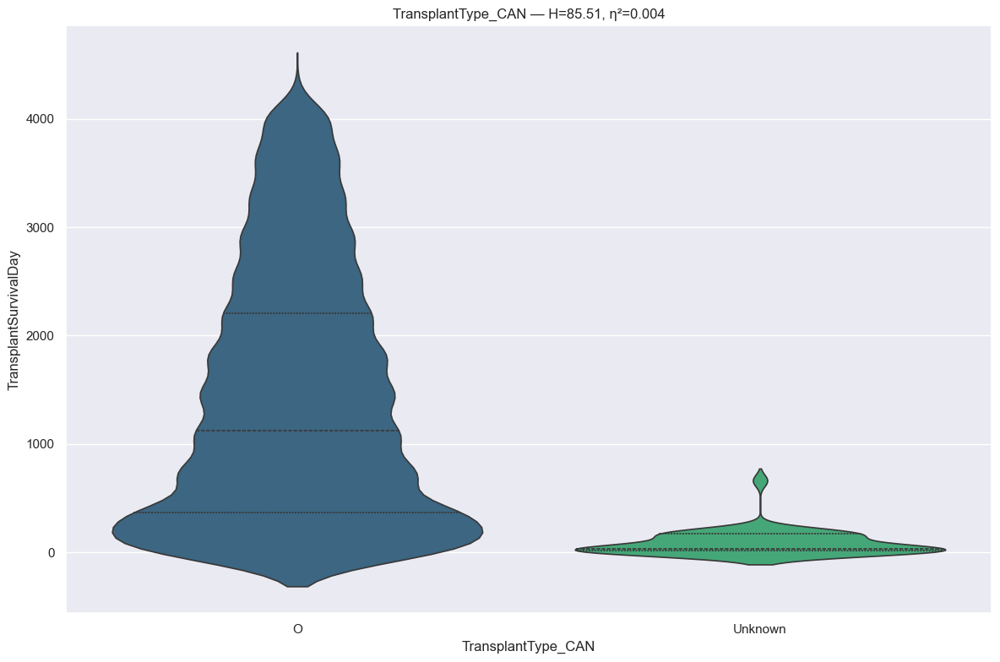

RANKING REPORT: TransplantType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * O                                                 :  22185 records
 * Unknown                                           :     41 records
BYPASSED CATEGORIES (n < min_n):
 * H                                                 :     10 records
--------------------------------------------------------------------------------
Kruskal H: 85.5077 | P-value: 2.308042e-20 | Effect η²: 0.0038
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
O            vs Unknown      | p=2.3083e-20 | thr=0.0500 | r=-0.835 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - O

>>> Group_2 (1 categories)
  - Unknown

>>> Other (1 categories)
  - H

TransplantType_CAN  mean_survival_days  median_survi

In [357]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [358]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Primary Diagnosis Type

In [359]:
# info
feature = u.get_feature_info(df, 'PrimaryDiagnosisType', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                          count unique                         top  freq
PrimaryDiagnosisType_CAN  22236     37  DILATED MYOPATHY: ISCHEMIC  7614

:::: NaN Count:
PrimaryDiagnosisType_CAN    0 



{'PrimaryDiagnosisType_CAN': CategoricalDtype(categories=['ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY',
                   'CANCER', 'CONGENITAL HEART DEFECT - PRIOR SURGERY UNKNOWN',
                   'CONGENITAL HEART DEFECT - WITH SURGERY',
                   'CONGENITAL HEART DEFECT - WITHOUT SURGERY',
                   'CORONARY ARTERY DISEASE',
                   'COVID-19: DILATED MYOPATHY: ACTIVE MYOCARDITIS',
                   'COVID-19: DILATED MYOPATHY: HISTORY OF MYOCARDITIS',
                   'DILATED MYOPATHY: ADRIAMYCIN',
                   'DILATED MYOPATHY: ALCOHOLIC', 'DILATED MYOPATHY: FAMILIAL',
                   'DILATED MYOPATHY: IDIOPATHIC', 'DILATED MYOPATHY: ISCHEMIC',
                   'DILATED MYOPATHY: MYOCARDITIS',
                   'DILATED MYOPATHY: OTHER SPECIFY',
                   'DILATED MYOPATHY: POST PARTUM', 'DILATED MYOPATHY: VIRAL',
                   'DILATED MYOPATHY: VIRAL (NOT COVID-19)',
                   'HEART RE-T

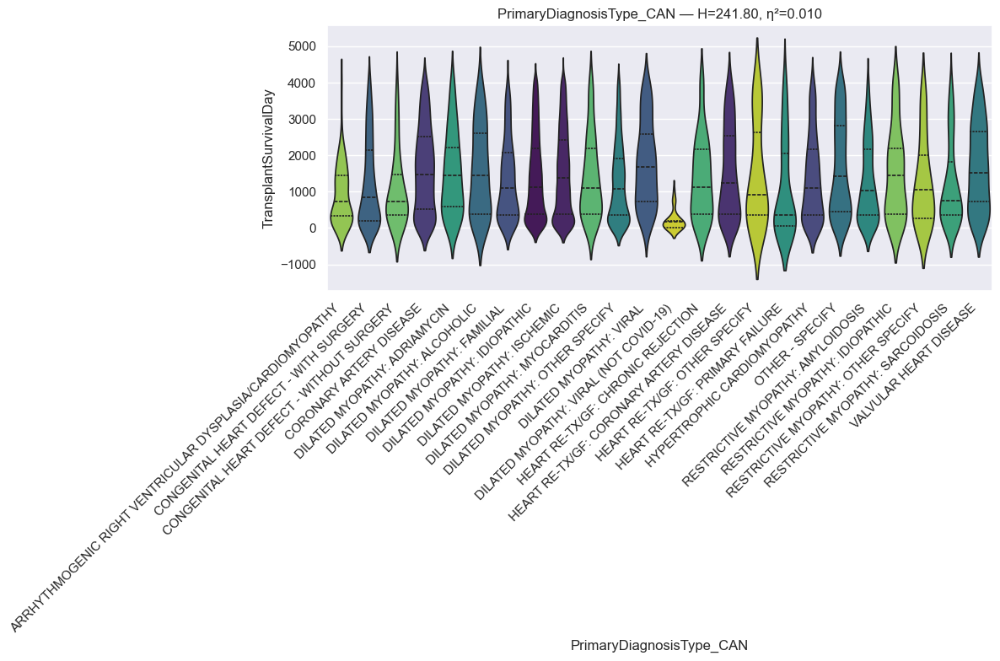

RANKING REPORT: PrimaryDiagnosisType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY:    101 records
 * CONGENITAL HEART DEFECT - WITH SURGERY            :    549 records
 * CONGENITAL HEART DEFECT - WITHOUT SURGERY         :     46 records
 * CORONARY ARTERY DISEASE                           :    783 records
 * DILATED MYOPATHY: ADRIAMYCIN                      :    133 records
 * DILATED MYOPATHY: ALCOHOLIC                       :     71 records
 * DILATED MYOPATHY: FAMILIAL                        :    649 records
 * DILATED MYOPATHY: IDIOPATHIC                      :   7515 records
 * DILATED MYOPATHY: ISCHEMIC                        :   7614 records
 * DILATED MYOPATHY: MYOCARDITIS                     :    116 records
 * DILATED MYOPATHY: OTHER SPECIFY                   :   1838 records
 * DILATED MYOPATHY: VIRAL                           :    222 records
 * DILATED MYOPATHY: VIRAL (NOT COVID-19)            :     30 records
 * HEART RE-

In [360]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": True,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [361]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PrimaryDiagnosisType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY:    101 records
 * CONGENITAL HEART DEFECT - WITH SURGERY            :    549 records
 * CONGENITAL HEART DEFECT - WITHOUT SURGERY         :     46 records
 * CORONARY ARTERY DISEASE                           :    783 records
 * DILATED MYOPATHY: ADRIAMYCIN                      :    133 records
 * DILATED MYOPATHY: ALCOHOLIC                       :     71 records
 * DILATED MYOPATHY: FAMILIAL                        :    649 records
 * DILATED MYOPATHY: IDIOPATHIC                      :   7515 records
 * DILATED MYOPATHY: ISCHEMIC                        :   7614 records
 * DILATED MYOPATHY: MYOCARDITIS                     :    116 records
 * DILATED MYOPATHY: OTHER SPECIFY                   :   1838 records
 * DILATED MYOPATHY: VIRAL                           :    222 records
 * DILATED MYOPATHY: VIRAL (NOT COVID-19)            :     30 records
 * HEART RE-

In [362]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Dialysis Prior Registration
* Dialysis is a life-sustaining treatment for kidney failure that filters waste and excess fluids from the blood when the kidneys can no longer function, usually required when function drops below 10-15%. Hemodialysis typically takes 3-4 hours per session, three times a week, while peritoneal dialysis is done daily at home. Common side effects include fatigue, nausea, and low blood pressure, while long-term care requires careful management of diet and fluid intake.

In [363]:
# info
feature = u.get_feature_info(df, 'DialysisPriorRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                               count unique top   freq
DialysisPriorRegistration_CAN  22236      3  No  20920

:::: NaN Count:
DialysisPriorRegistration_CAN    0 



{'DialysisPriorRegistration_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

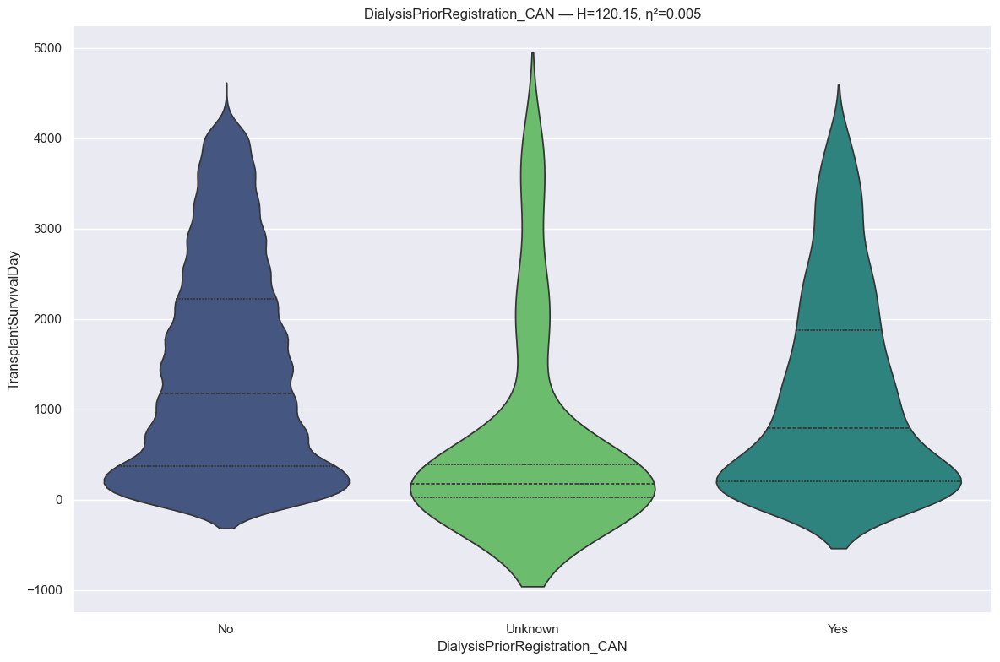

RANKING REPORT: DialysisPriorRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  20920 records
 * Unknown                                           :     71 records
 * Yes                                               :   1245 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 120.1476 | P-value: 8.133564e-27 | Effect η²: 0.0053
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=4.7584e-17 | thr=0.0167 | r=-0.141 | *Sig*
No           vs Unknown      | p=8.8011e-13 | thr=0.0167 | r=-0.491 | *Sig*
Unknown      vs Yes          | p=7.4823e-08 | thr=0.0167 | r= 0.379 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>

In [364]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [365]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Transplant
* Life support comprises temporary medical techniques—such as mechanical ventilation, dialysis, and feeding tubes—designed to sustain vital functions when organs fail, often used in ICU settings while treating underlying illnesses. It can last from a few days to years, depending on the prognosis. Decisions are often deeply personal, involving ethical considerations regarding quality of life and the prolongation of the dying process.

In [366]:
# info
feature = u.get_feature_info(df, 'LifeSupportTransplant_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                           count unique  top   freq
LifeSupportTransplant_CAN  22236      3  Yes  18653

:::: NaN Count:
LifeSupportTransplant_CAN    0 



{'LifeSupportTransplant_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

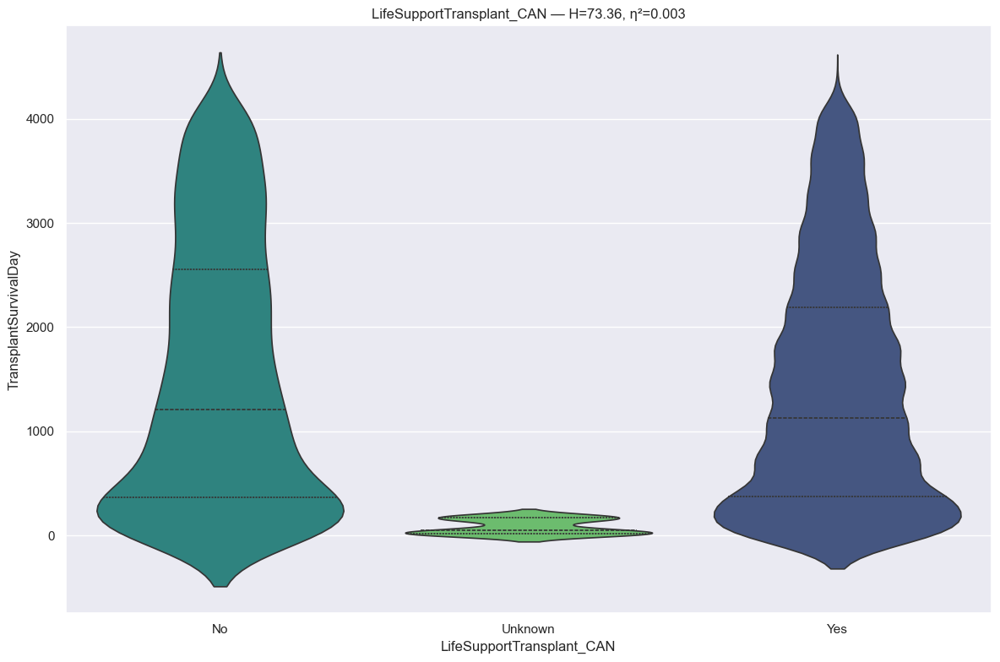

RANKING REPORT: LifeSupportTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   3553 records
 * Unknown                                           :     30 records
 * Yes                                               :  18653 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 73.3587 | P-value: 1.175883e-16 | Effect η²: 0.0032
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=4.7039e-15 | thr=0.0167 | r= 0.827 | *Sig*
No           vs Unknown      | p=1.1650e-14 | thr=0.0167 | r=-0.817 | *Sig*
No           vs Yes          | p=4.7232e-04 | thr=0.0167 | r=-0.037 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Gr

In [367]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [368]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Prior Cardiac Surgery List And Transplant

In [369]:
# info
feature = u.get_feature_info(df, 'PriorCardiacSurgeryListAndTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                          count unique top   freq
PriorCardiacSurgeryListAndTransplant_CAN  22236      3  No  16562

:::: NaN Count:
PriorCardiacSurgeryListAndTransplant_CAN    0 



{'PriorCardiacSurgeryListAndTransplant_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

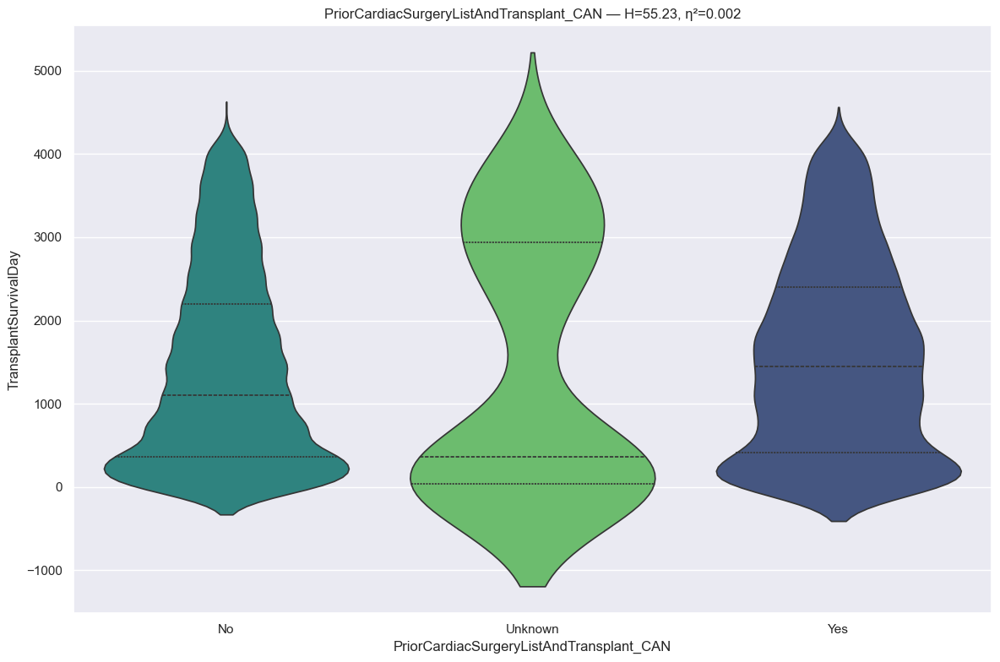

RANKING REPORT: PriorCardiacSurgeryListAndTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  16562 records
 * Unknown                                           :    109 records
 * Yes                                               :   5565 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 55.2295 | P-value: 1.016386e-12 | Effect η²: 0.0024
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=5.8072e-13 | thr=0.0167 | r= 0.064 | *Sig*
Unknown      vs Yes          | p=3.4941e-02 | thr=0.0167 | r= 0.118 | Not Sig
No           vs Unknown      | p=6.3147e-02 | thr=0.0167 | r=-0.103 | Not Sig
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::

In [370]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [371]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Malignancy

In [372]:
# info
feature = u.get_feature_info(df, r'^Malignancy_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top   freq
Malignancy_CAN  22236      3  No  20639

:::: NaN Count:
Malignancy_CAN    0 



{'Malignancy_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

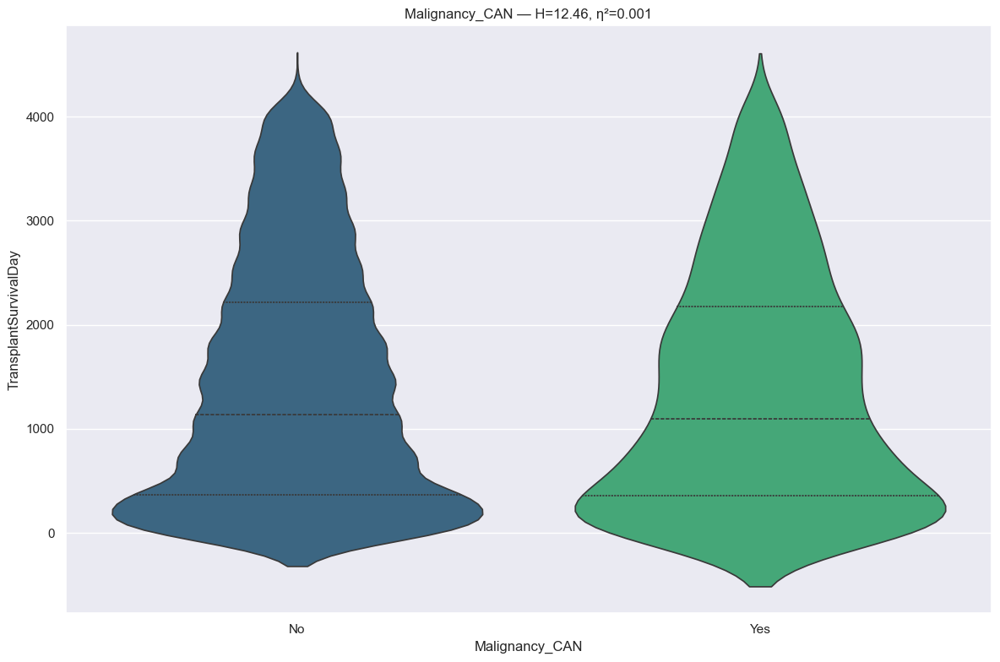

RANKING REPORT: Malignancy_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  20639 records
 * Yes                                               :   1577 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     20 records
--------------------------------------------------------------------------------
Kruskal H: 12.4551 | P-value: 4.168532e-04 | Effect η²: 0.0005
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=4.1686e-04 | thr=0.0500 | r=-0.053 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

>>> Other (1 categories)
  - Unknown

Malignancy_CAN  mean_survival_days  median_survival_d

In [373]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [374]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Ventilatory Support After Registration

In [375]:
# info
feature = u.get_feature_info(df, 'VentilatorySupportAfterRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                         count unique top   freq
VentilatorySupportAfterRegistration_CAN  22236      3  No  17638

:::: NaN Count:
VentilatorySupportAfterRegistration_CAN    0 



{'VentilatorySupportAfterRegistration_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

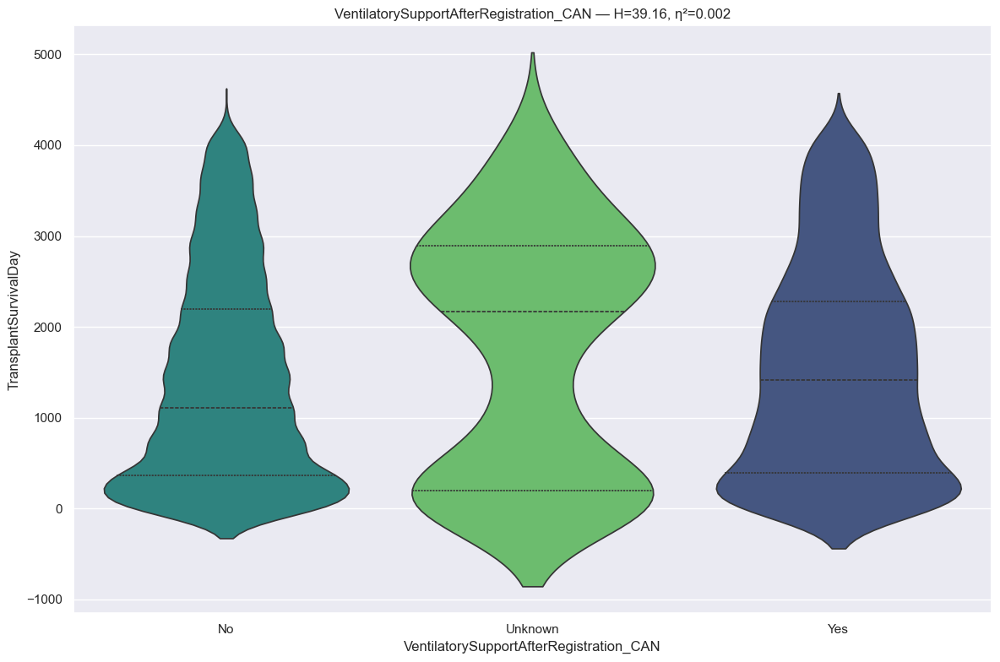

RANKING REPORT: VentilatorySupportAfterRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  17638 records
 * Unknown                                           :    297 records
 * Yes                                               :   4301 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 39.1562 | P-value: 3.143004e-09 | Effect η²: 0.0017
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=7.2899e-08 | thr=0.0167 | r= 0.053 | *Sig*
No           vs Unknown      | p=6.3065e-04 | thr=0.0167 | r= 0.115 | *Sig*
Unknown      vs Yes          | p=1.6397e-02 | thr=0.0167 | r=-0.083 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::

In [376]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [377]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Heart Procedure Type

In [378]:
# info
feature = u.get_feature_info(df, 'HeartProcedureType', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique                 top   freq
HeartProcedureType_CAN  22236      5  Orthotopic Bicaval  17901

:::: NaN Count:
HeartProcedureType_CAN    0 



{'HeartProcedureType_CAN': CategoricalDtype(categories=['Heterotopic', 'Orthotopic Bicaval',
                   'Orthotopic Total (Bicaval, PV)', 'Orthotopic Traditional',
                   'Unknown'],
 , ordered=False, categories_dtype=str)}

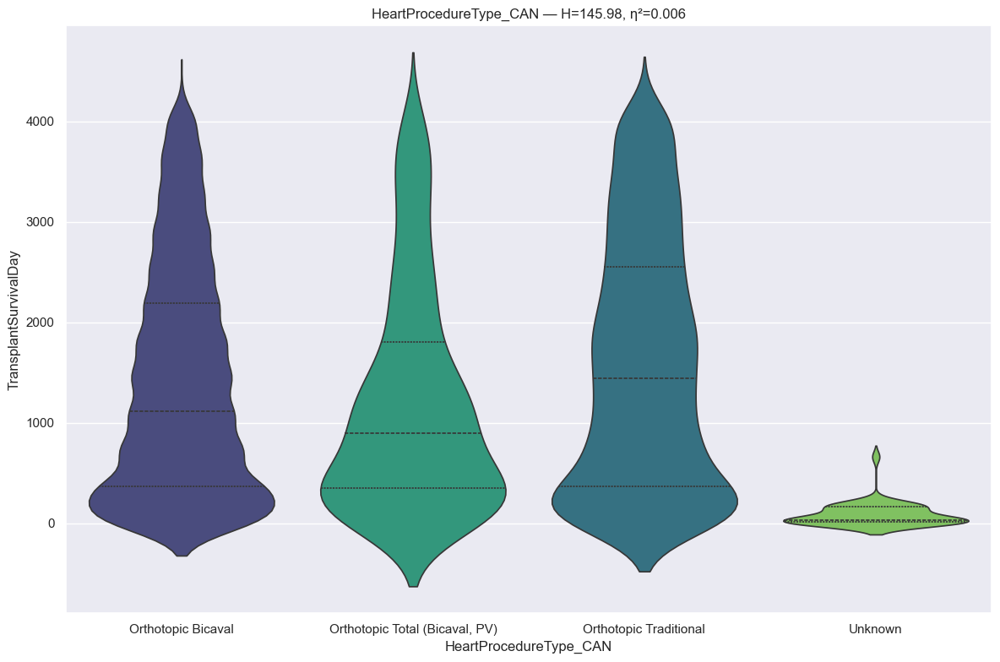

RANKING REPORT: HeartProcedureType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Orthotopic Bicaval                                :  17901 records
 * Orthotopic Total (Bicaval, PV)                    :    544 records
 * Orthotopic Traditional                            :   3740 records
 * Unknown                                           :     41 records
BYPASSED CATEGORIES (n < min_n):
 * Heterotopic                                       :     10 records
--------------------------------------------------------------------------------
Kruskal H: 145.9845 | P-value: 1.935983e-31 | Effect η²: 0.0064
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Orthotopic Bicaval vs Unknown      | p=1.9180e-20 | thr=0.0083 | r=-0.837 | *Sig*
Orthotopic Traditional vs Unknown      | p=8.1234e-20 | thr=0.0083 | r=-0.826 | *Sig*
Orthotopic Total (Bicaval, PV) vs Unknown      | p=9.5442e-1

In [379]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [380]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Transplant Year

In [381]:
# info
feature = u.get_feature_info(df, 'TransplantYear', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                      count         mean       std     min     25%     50%     75%     max
TransplantYear_CAN  22236.0  2016.066289  3.394822  2010.0  2013.0  2016.0  2019.0  2021.0

:::: NaN Count:
TransplantYear_CAN    0 



{'TransplantYear_CAN': dtype('int64')}

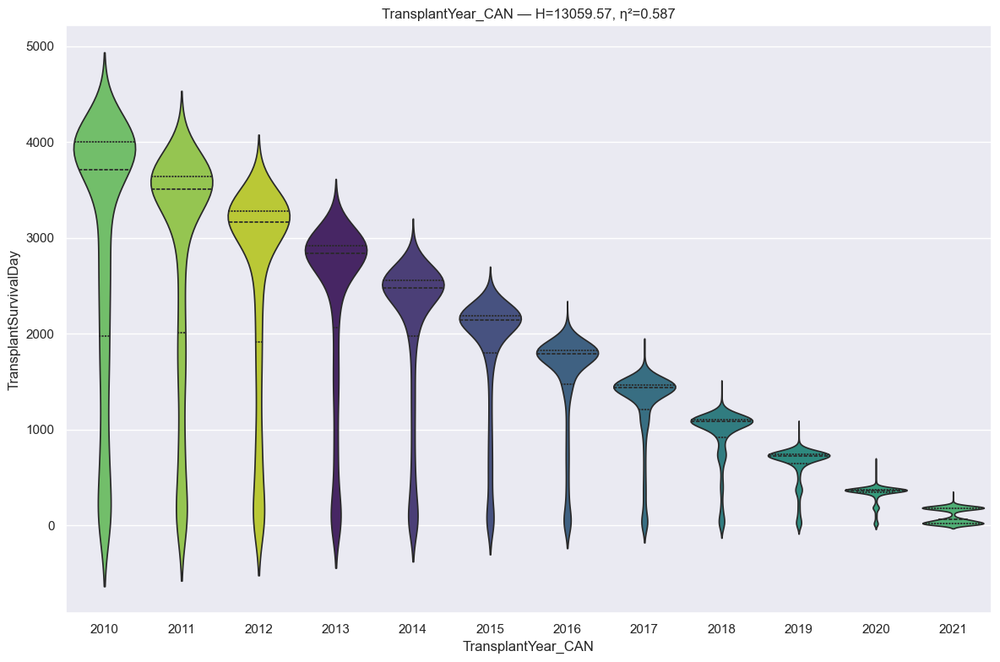

RANKING REPORT: TransplantYear_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 2010                                              :   1499 records
 * 2011                                              :   1405 records
 * 2012                                              :   1459 records
 * 2013                                              :   1547 records
 * 2014                                              :   1663 records
 * 2015                                              :   1740 records
 * 2016                                              :   2035 records
 * 2017                                              :   2082 records
 * 2018                                              :   2113 records
 * 2019                                              :   2189 records
 * 2020                                              :   2359 records
 * 2021                                              :   2145 records
BYPASSED CATEGORIES: None
---------------------------------------------------------------------

In [382]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": True,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [383]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** DO NOT USE!

#### Listing Year

In [384]:
# info
feature = u.get_feature_info(df, 'ListingYear_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                   count         mean       std     min     25%     50%     75%     max
ListingYear_CAN  22236.0  2015.423817  3.594176  1996.0  2013.0  2016.0  2018.0  2021.0

:::: NaN Count:
ListingYear_CAN    0 



{'ListingYear_CAN': dtype('int64')}

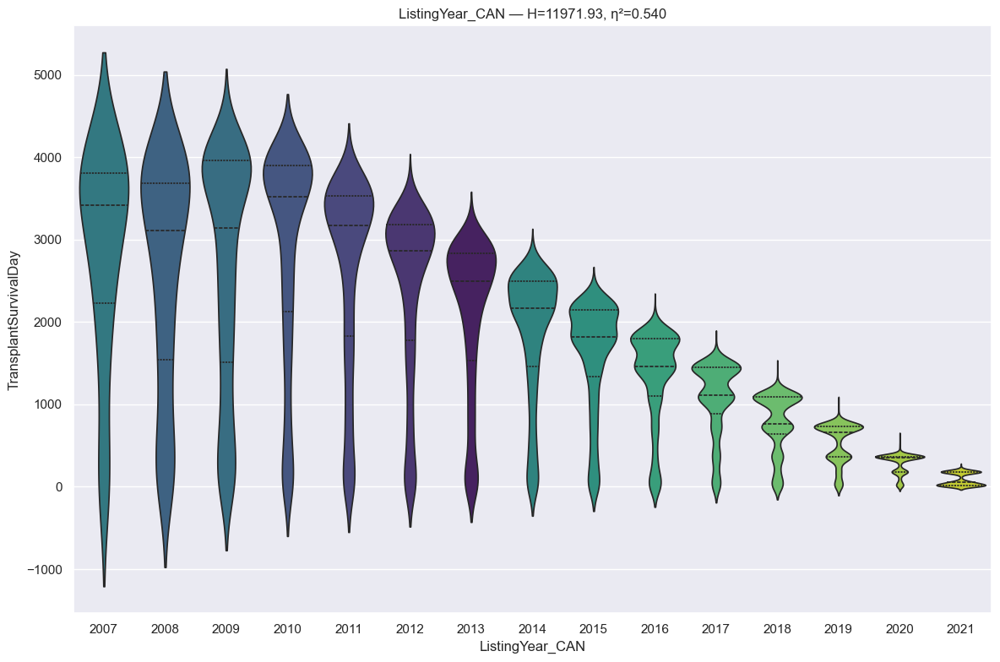

RANKING REPORT: ListingYear_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 2007                                              :     42 records
 * 2008                                              :    163 records
 * 2009                                              :    651 records
 * 2010                                              :   1531 records
 * 2011                                              :   1486 records
 * 2012                                              :   1566 records
 * 2013                                              :   1658 records
 * 2014                                              :   1805 records
 * 2015                                              :   1868 records
 * 2016                                              :   1946 records
 * 2017                                              :   1923 records
 * 2018                                              :   1972 records
 * 2019                                              :   2060 records
 * 2020                     

In [385]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [386]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** DO NOT USE!

#### CrossMatchDone

In [387]:
# info
feature = u.get_feature_info(df, 'CrossMatchDone', cat=True)

                count unique  top   freq
CrossMatchDone  22236      3  Yes  20504

:::: NaN Count:
CrossMatchDone    0 

--- CrossMatchDone ---
dtype: category
Categories: ['No', 'Unknown', 'Yes']
Ordered: False



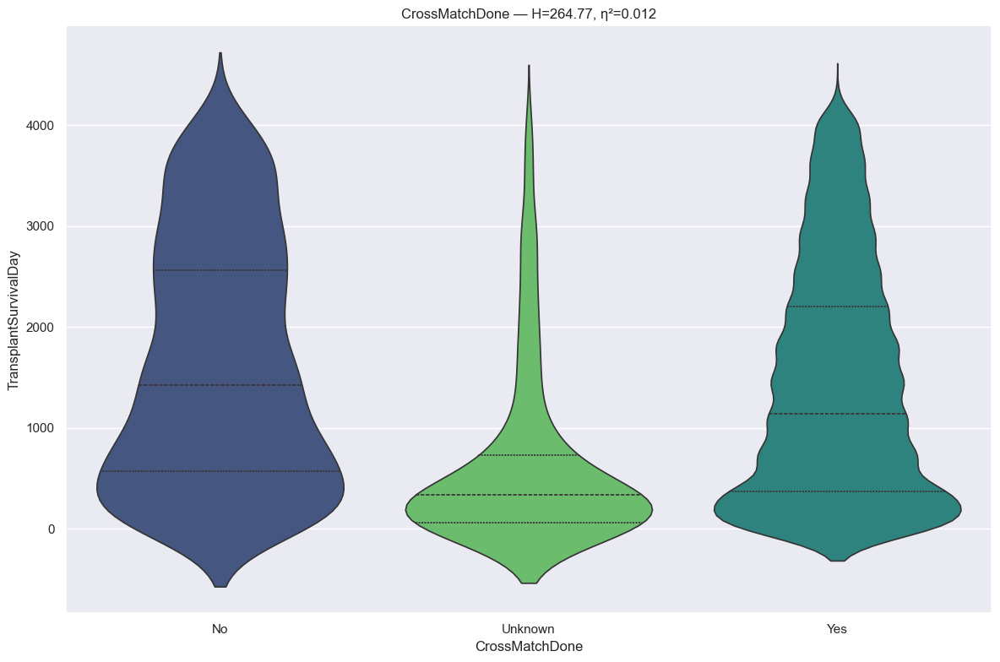

RANKING REPORT: CrossMatchDone (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   1344 records
 * Unknown                                           :    388 records
 * Yes                                               :  20504 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 264.7682 | P-value: 3.208663e-58 | Effect η²: 0.0118
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=2.1578e-54 | thr=0.0167 | r=-0.517 | *Sig*
Unknown      vs Yes          | p=1.3373e-53 | thr=0.0167 | r= 0.456 | *Sig*
No           vs Yes          | p=1.4668e-06 | thr=0.0167 | r=-0.078 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 c

In [388]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [389]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### MismatchLevel_AMIS

In [390]:
# info
feature = u.get_feature_info(df, 'MismatchLevel_AMIS', cat=True)

                    count unique top   freq
MismatchLevel_AMIS  22236      4   2  10572

:::: NaN Count:
MismatchLevel_AMIS    0 

--- MismatchLevel_AMIS ---
dtype: category
Categories: ['0', '1', '2', 'Unknown']
Ordered: False



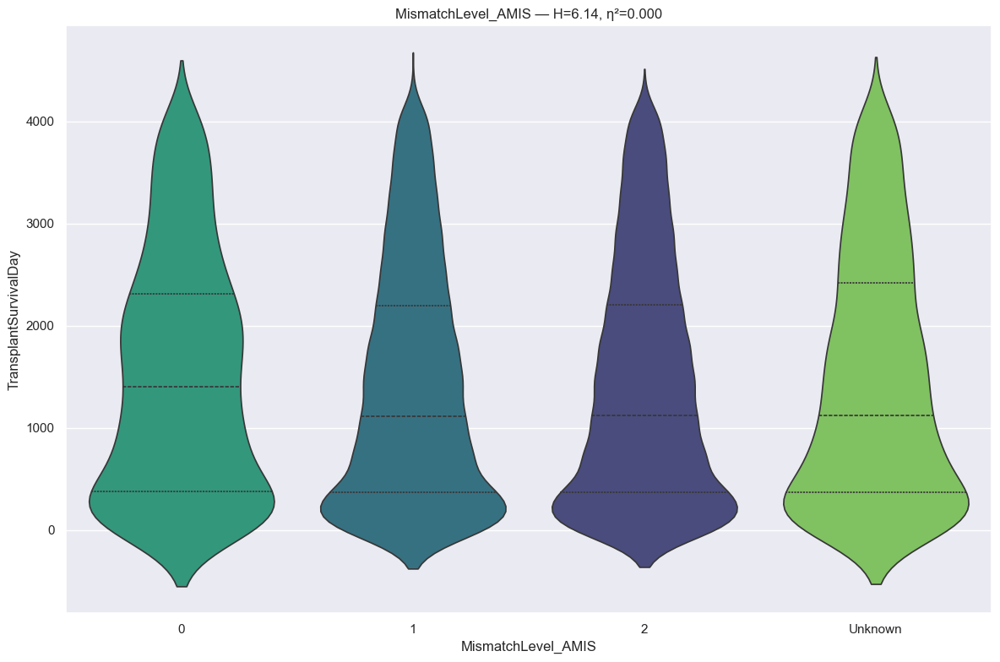

RANKING REPORT: MismatchLevel_AMIS (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :   1370 records
 * 1                                                 :   8445 records
 * 2                                                 :  10572 records
 * Unknown                                           :   1849 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 6.1419 | P-value: 1.049069e-01 | Effect η²: 0.0001
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
0            vs 1            | p=1.5878e-02 | thr=0.0083 | r=-0.041 | Not Sig
0            vs 2            | p=3.3947e-02 | thr=0.0083 | r=-0.035 | Not Sig
0            vs Unknown      | p=2.0356e-01 | thr=0.0083 | r=-0.026 | Not Sig
1            vs Unknown      | p=3.6514e-01 | thr=0.0083 | r= 0.013 | Not Sig

In [391]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [392]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** The feature is not statistically significant and uninformative for survival.

#### MismatchLevel_BMIS

In [393]:
# info
feature = u.get_feature_info(df, 'MismatchLevel_BMIS', cat=True)

                    count unique top   freq
MismatchLevel_BMIS  22236      4   2  14747

:::: NaN Count:
MismatchLevel_BMIS    0 

--- MismatchLevel_BMIS ---
dtype: category
Categories: ['0', '1', '2', 'Unknown']
Ordered: False



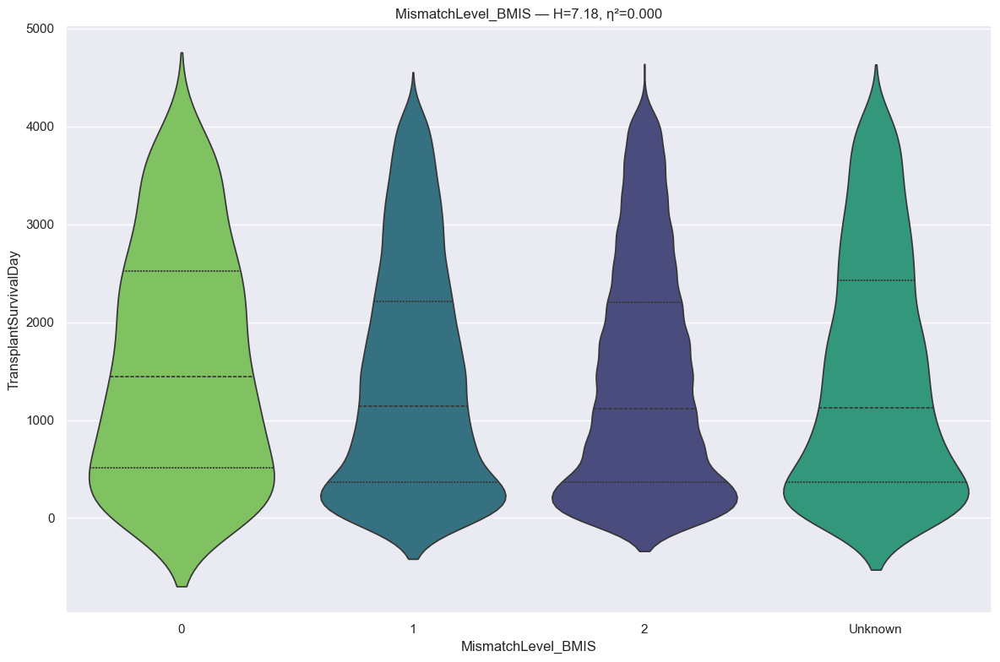

RANKING REPORT: MismatchLevel_BMIS (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :    410 records
 * 1                                                 :   5229 records
 * 2                                                 :  14747 records
 * Unknown                                           :   1850 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 7.1796 | P-value: 6.638924e-02 | Effect η²: 0.0002
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
0            vs 2            | p=1.1665e-02 | thr=0.0083 | r=-0.073 | Not Sig
0            vs 1            | p=2.9207e-02 | thr=0.0083 | r=-0.065 | Not Sig
0            vs Unknown      | p=6.5573e-02 | thr=0.0083 | r=-0.058 | Not Sig
2            vs Unknown      | p=3.8001e-01 | thr=0.0083 | r= 0.013 | Not Sig

In [394]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [395]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** The feature is not statistically significant and uninformative for survival.

#### MismatchLevel_DRMIS

In [396]:
# info
feature = u.get_feature_info(df, 'MismatchLevel_DRMIS', cat=True)

                     count unique top   freq
MismatchLevel_DRMIS  22236      4   2  11262

:::: NaN Count:
MismatchLevel_DRMIS    0 

--- MismatchLevel_DRMIS ---
dtype: category
Categories: ['0', '1', '2', 'Unknown']
Ordered: False



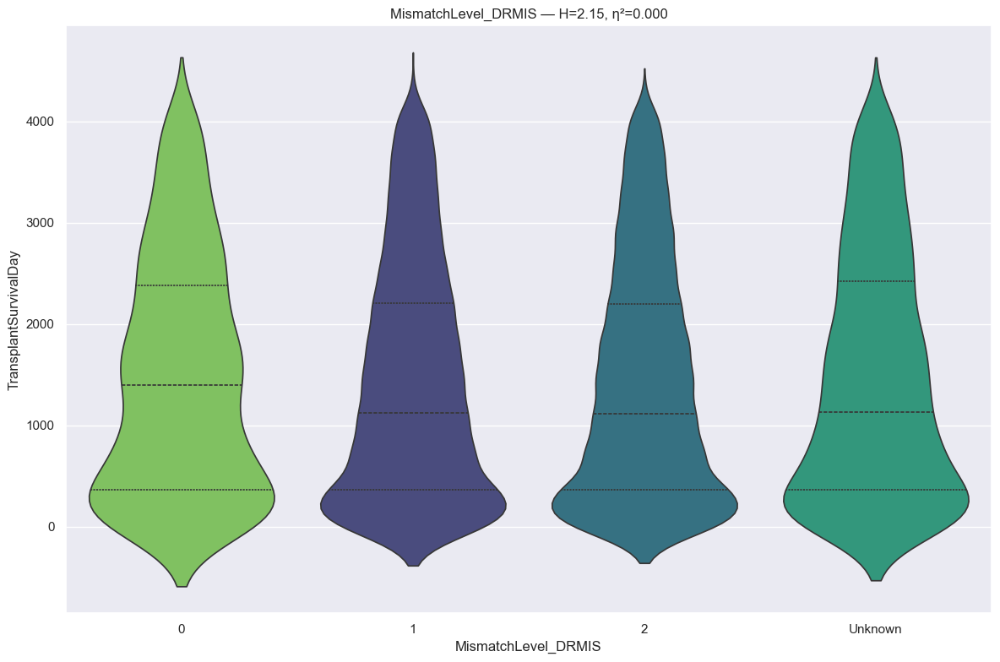

RANKING REPORT: MismatchLevel_DRMIS (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :    988 records
 * 1                                                 :   8129 records
 * 2                                                 :  11262 records
 * Unknown                                           :   1857 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 2.1539 | P-value: 5.410923e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
0            vs 2            | p=2.8145e-01 | thr=0.0083 | r=-0.021 | Not Sig
2            vs Unknown      | p=3.4993e-01 | thr=0.0083 | r= 0.014 | Not Sig
1            vs 2            | p=3.6262e-01 | thr=0.0083 | r=-0.008 | Not Sig
0            vs 1            | p=4.9694e-01 | thr=0.0083 | r=-0.013 | Not Si

In [397]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [398]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** The feature is not statistically significant and uninformative for survival.

#### MismatchLevel_HLAMIS

In [399]:
# info
feature = u.get_feature_info(df, 'MismatchLevel_HLAMIS', cat=True)

                      count unique top  freq
MismatchLevel_HLAMIS  22236      8   5  7647

:::: NaN Count:
MismatchLevel_HLAMIS    0 

--- MismatchLevel_HLAMIS ---
dtype: category
Categories: ['0', '1', '2', '3', '4', '5', '6', 'Unknown']
Ordered: False



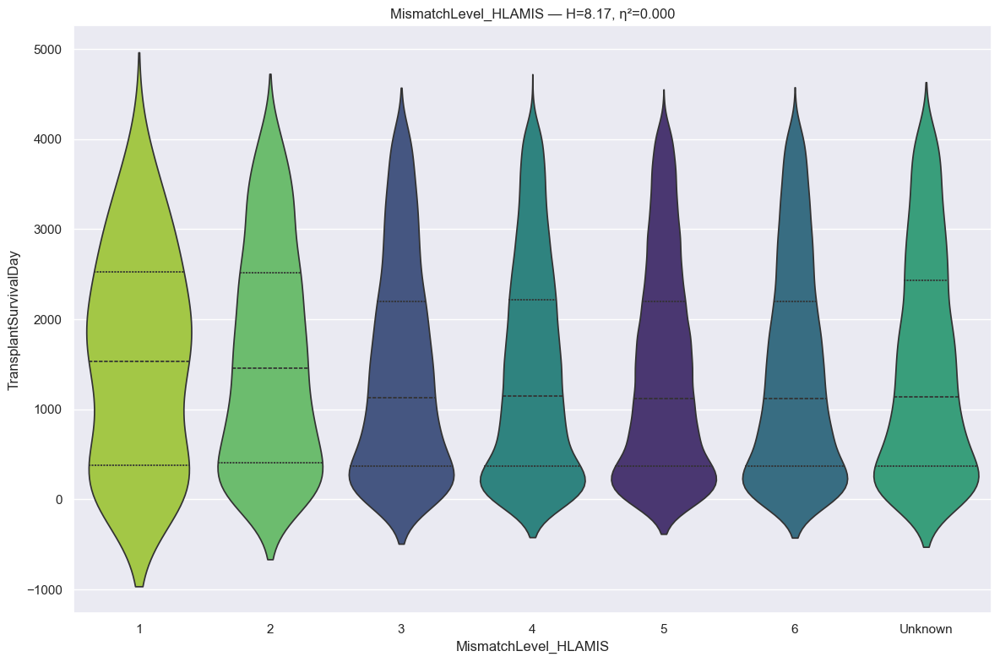

RANKING REPORT: MismatchLevel_HLAMIS (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :     75 records
 * 2                                                 :    554 records
 * 3                                                 :   2208 records
 * 4                                                 :   5178 records
 * 5                                                 :   7647 records
 * 6                                                 :   4696 records
 * Unknown                                           :   1859 records
BYPASSED CATEGORIES (n < min_n):
 * 0                                                 :     19 records
--------------------------------------------------------------------------------
Kruskal H: 8.1690 | P-value: 2.259822e-01 | Effect η²: 0.0001
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0024 | r_threshold: 0.10)
--------------------------------------------------------------------------------
2            vs 6     

In [400]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [401]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: MismatchLevel_HLAMIS (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :     75 records
 * 2                                                 :    554 records
 * 3                                                 :   2208 records
 * 4                                                 :   5178 records
 * 5                                                 :   7647 records
 * 6                                                 :   4696 records
 * Unknown                                           :   1859 records
BYPASSED CATEGORIES (n < min_n):
 * 0                                                 :     19 records
--------------------------------------------------------------------------------
Kruskal H: 8.1690 | P-value: 2.259822e-01 | Effect η²: 0.0001
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison 

In [402]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### BloodGroupMatchLevel

In [403]:
# info
feature = u.get_feature_info(df, 'BloodGroupMatchLevel', cat=True)

                      count unique        top   freq
BloodGroupMatchLevel  22236      3  Identical  19117

:::: NaN Count:
BloodGroupMatchLevel    0 

--- BloodGroupMatchLevel ---
dtype: category
Categories: ['Compatible', 'Identical', 'Incompatible']
Ordered: False



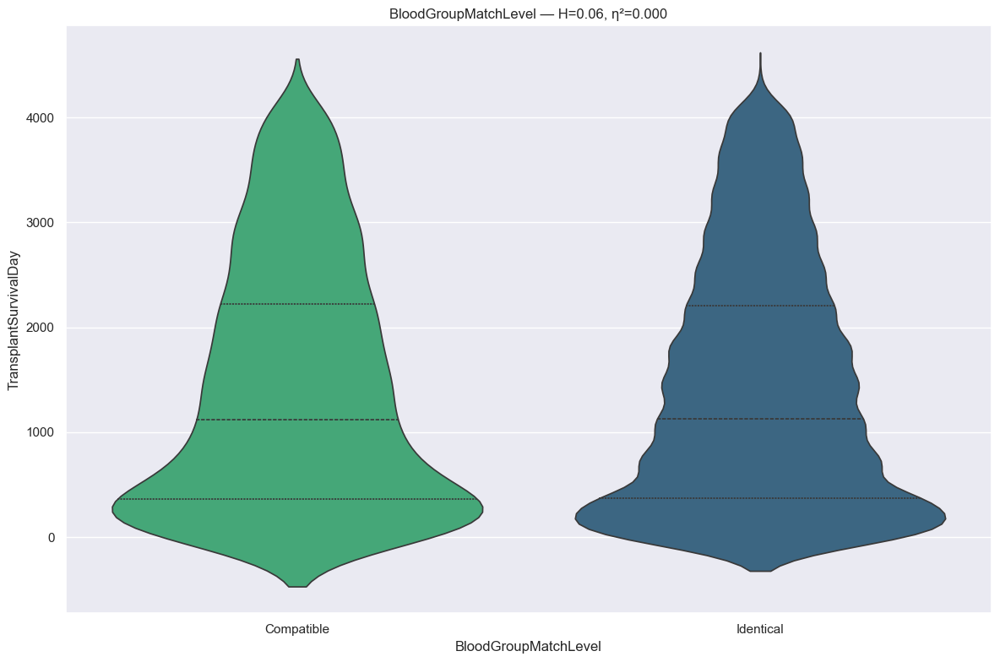

RANKING REPORT: BloodGroupMatchLevel (n ≥ 30)
INCLUDED CATEGORIES:
 * Compatible                                        :   3118 records
 * Identical                                         :  19117 records
BYPASSED CATEGORIES (n < min_n):
 * Incompatible                                      :      1 records
--------------------------------------------------------------------------------
Kruskal H: 0.0624 | P-value: 8.027700e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Compatible   vs Identical    | p=8.0277e-01 | thr=0.0500 | r= 0.003 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - Compatible
  - Identical

>>> Other (1 categories)
  - Incompatible

BloodGroupMatchLevel  mean_survival_days  median_surviv

In [404]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [405]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: BloodGroupMatchLevel (n ≥ 30)
INCLUDED CATEGORIES:
 * Compatible                                        :   3118 records
 * Identical                                         :  19117 records
BYPASSED CATEGORIES (n < min_n):
 * Incompatible                                      :      1 records
--------------------------------------------------------------------------------
Kruskal H: 0.0624 | P-value: 8.027700e-01 | Effect η²: 0.0000
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - Compatible
  - Identical

>>> Other (1 categories)
  - Incompatible



In [406]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Clean Up

In [407]:
# add to remove list
remove_cols.extend(feature)

# remove unwanted columns
df = df.drop(columns=remove_cols).copy()

# removed all unused categories
for col in df.select_dtypes(include="category"):
    df[col] = df[col].cat.remove_unused_categories()

# shape
print(df.shape)

# info
df.info(max_cols=df.shape[1])

(22236, 121)
<class 'pandas.DataFrame'>
RangeIndex: 22236 entries, 0 to 22235
Data columns (total 121 columns):
 #    Column                                        Non-Null Count  Dtype   
---   ------                                        --------------  -----   
 0    PreviousTransplantNumber_CAN                  22236 non-null  category
 1    WaitListDiagnosisCode_CAN                     22236 non-null  category
 2    Citizenship_CAN                               22236 non-null  category
 3    ResidencyStateRegistration_CAN                22236 non-null  category
 4    EducationLevel_CAN                            22236 non-null  category
 5    LifeSupportRegistration_ECMO_CAN              22236 non-null  category
 6    LifeSupportRegistration_IABP_CAN              22236 non-null  category
 7    VentricularDeviceTypeRegistration_CAN         22236 non-null  category
 8    VentricularDeviceBrandRegistration_CAN        22236 non-null  category
 9    FunctionalStatusRegistration_CAN   

#### Write to Disk

In [408]:
# save data: heart dataset
u.write_to_file(df, 'Male_CAN_Heart_PreML',path='../Data/', format='parquet')
u.write_to_file(mapping_df, 'Male_CAN_Heart_Mapping',path='../Data/', format='parquet')

22,236 records written to ../Data/Male_CAN_Heart_PreML.parquet
91 records written to ../Data/Male_CAN_Heart_Mapping.parquet
